# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# New Section

# Import Libraries

In [ ]:
pip install keras-tuner

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 17.1 MB/s eta 0:00:00


In [ ]:
import random
import math
import numpy as np
from sklearn import preprocessing

import os
import pandas as pd
import zipfile

from datetime import datetime, timedelta
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from keras_tuner import Hyperband, BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

In [ ]:
import os
import random
import math
import numpy as np
from sklearn import preprocessing


import pandas as pd
import zipfile

import pandas as pd
from datetime import datetime, timedelta
import numpy as np

from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam


import tensorflow as tf


from keras_tuner import Hyperband, BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters

from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error




import random
import math
import numpy as np
from sklearn import preprocessing


import pandas as pd
import zipfile

import pandas as pd
from datetime import datetime, timedelta


from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.impute import KNNImputer

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import seaborn as sns
import matplotlib.pyplot as plt


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Dense, Dropout, Concatenate, Bidirectional, LSTM






# Load the data

In [ ]:
bh=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Bhadla solar Power Park/27.420177_72.070427_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
ch=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Charan Solar Park/23.902077_71.19477_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
dh=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Dhirubhai Ambani/26.793418_72.009013_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
kam=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/9.415969_78.248047_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
kaz=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/32.2275_78.07099_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
kur=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kurnool/15.855387_78.065199_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
man=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/23.986373_75.32641_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
pava=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Pavagada Solar park/14.138196_77.314631_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
pha=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Phalodi_Solar_Park/27.294_72.365_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
rew=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Rewa Ultra Mega Solar/24.630418_81.537174_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
sak=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Sakri Solar Plant/21.085624_74.352948_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
tan=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Tangste Solar Plant/33.9608_78.0579_Solcast_PT15M.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)

In [ ]:
kur_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kurnool/15.7659_78.2138_2019.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
kam_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/9.3565_78.4015_2019.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)
man_val=pd.read_csv("/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/24.0333_75.05_2019.csv",usecols=['PeriodStart','AirTemp','Azimuth','CloudOpacity','Ghi',"PrecipitableWater",	"RelativeHumidity","SurfacePressure","WindDirection10m"	,"WindSpeed10m"	,"Zenith"	,"AlbedoDaily"],parse_dates=True)


In [ ]:
kur_val

,PeriodStart,AirTemp,Azimuth,CloudOpacity,Ghi,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily
0,2018-12-31T00:00:00Z,18.5,-110,0.0,0,15.5,83.6,984.8,83,1.7,106,0.19
1,2018-12-31T00:15:00Z,18.6,-111,0.0,0,15.4,83.2,985.0,83,1.6,102,0.19
2,2018-12-31T00:30:00Z,18.6,-112,0.0,0,15.4,82.8,985.3,83,1.6,99,0.19
3,2018-12-31T00:45:00Z,18.7,-113,0.0,0,15.3,82.4,985.6,83,1.5,95,0.19
4,2018-12-31T01:00:00Z,18.8,-114,0.0,0,15.3,81.5,985.8,82,1.5,92,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...
35227,2020-01-01T22:45:00Z,22.7,-108,0.0,0,35.2,84.7,981.4,121,2.5,123,0.18
35228,2020-01-01T23:00:00Z,22.8,-108,0.0,0,35.2,84.6,981.5,120,2.6,119,0.18
35229,2020-01-01T23:15:00Z,22.9,-108,0.0,0,35.3,84.4,981.6,120,2.7,116,0.18
35230,2020-01-01T23:30:00Z,23.0,-109,0.0,0,35.3,84.1,981.8,120,2.8,112,0.18


# Data Processing

In [ ]:
class DateTimeConverter:
    def __init__(self, data):
        self.data = data
    def add_month_hour_columns(self):
      self.data['Month']=pd.to_datetime(self.data['PeriodStart']).dt.month
      self.data['Hour']=pd.to_datetime(self.data['PeriodStart']).dt.hour
    def add_features(self):
      self.data = pd.get_dummies(self.data, columns=['Month'])
      self.data['sin_hour'] = np.sin(2*np.pi*self.data['Hour'].astype(int)/24)
      self.data['cos_hour'] = np.cos(2*np.pi*self.data['Hour'].astype(int)/24)
    def visualize_transformations(self):
      fig, ax = plt.subplots()
      ax.plot(self.data['Hour'].iloc[:96], self.data['Ghi'].iloc[:96]/1000, label='Solar Irradiance')
      ax.plot(self.data['Hour'].iloc[:96], self.data['sin_hour'].iloc[:96], label='Sine of Hour')
      ax.plot(self.data['Hour'].iloc[:96], self.data['cos_hour'].iloc[:96], label='Cosine of Hour')
      ax.set_xlabel('Hour of Day')
      ax.set_ylabel('Value')
      ax.set_title('Solar Irradiance and Time of Day Transformations')
      ax.legend()
      plt.show()

    def remove_features(self):
      self.data.drop(['Year', 'Day', 'Minute', 'Hour','Clearsky GHI', 'DHI', 'DNI', 'Clearsky DHI', 'Clearsky DNI','Fill Flag'],inplace=True,axis=1)
    
    def get_data(self):
      return self.data



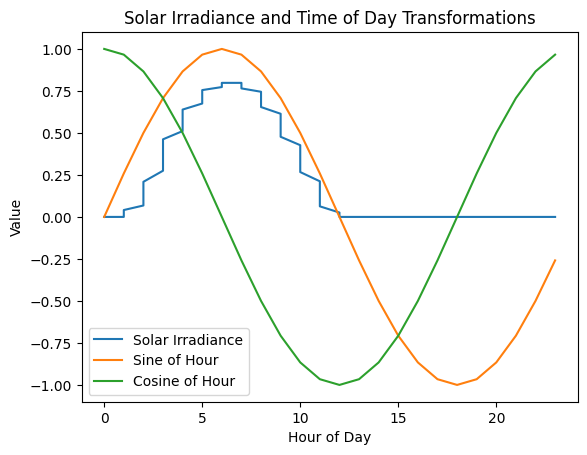

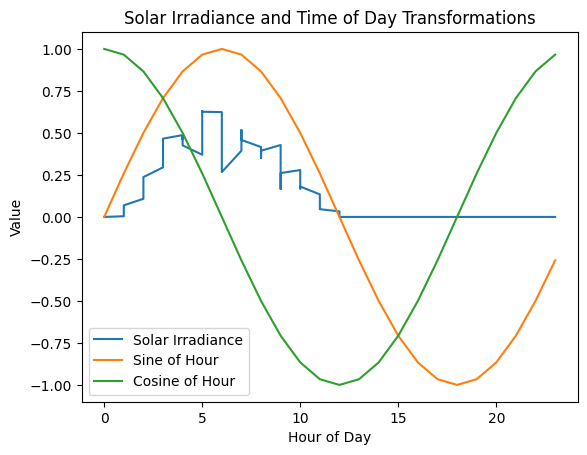

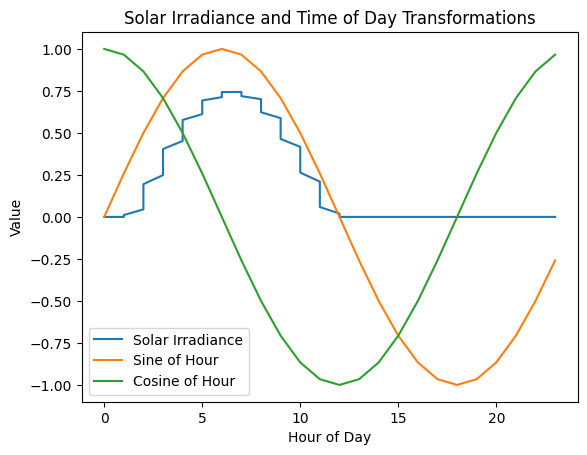

In [ ]:
# kur_val
dt_converter = DateTimeConverter(kur_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kur_val=dt_converter.get_data()
# kam_val
dt_converter = DateTimeConverter(kam_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kam_val=dt_converter.get_data()

# man_val
dt_converter = DateTimeConverter(man_val)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
man_val=dt_converter.get_data()

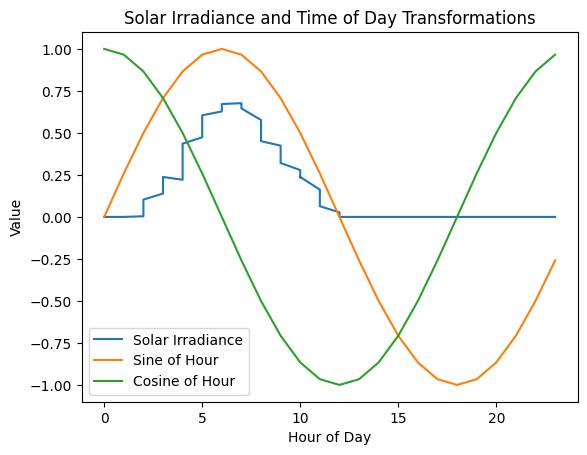

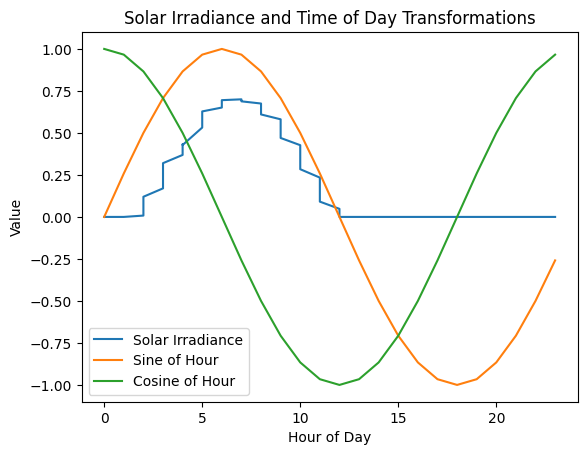

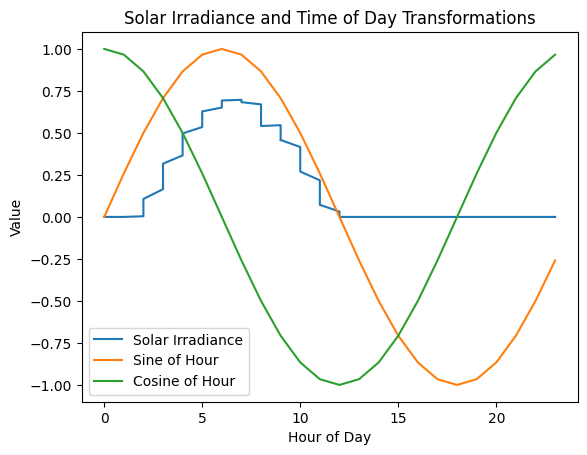

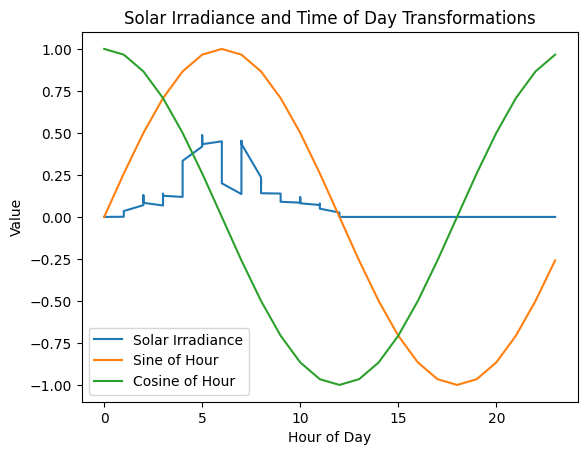

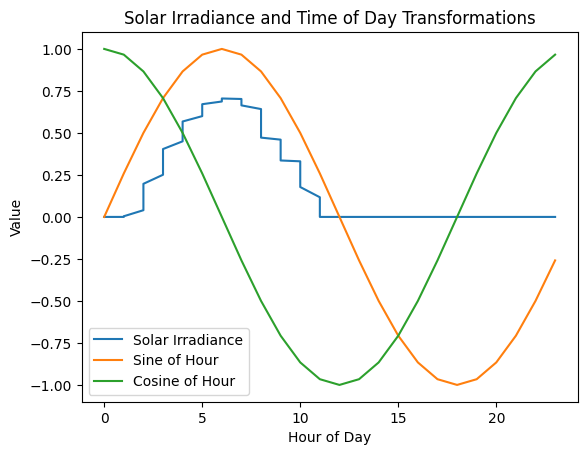

...

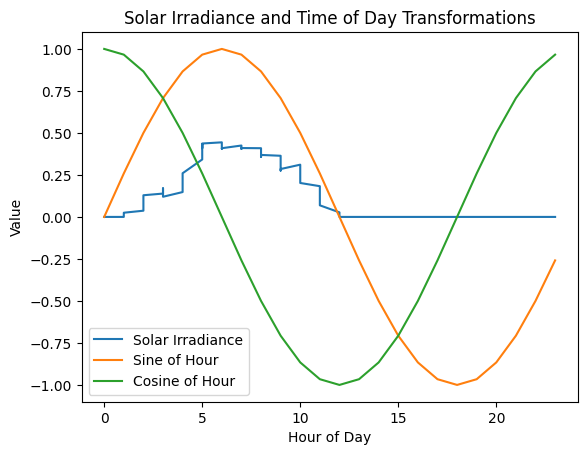

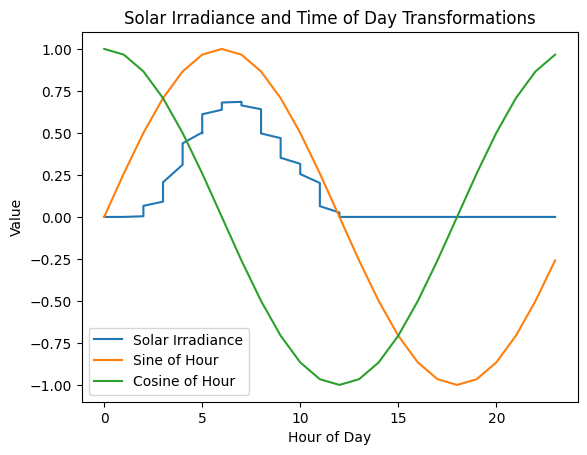

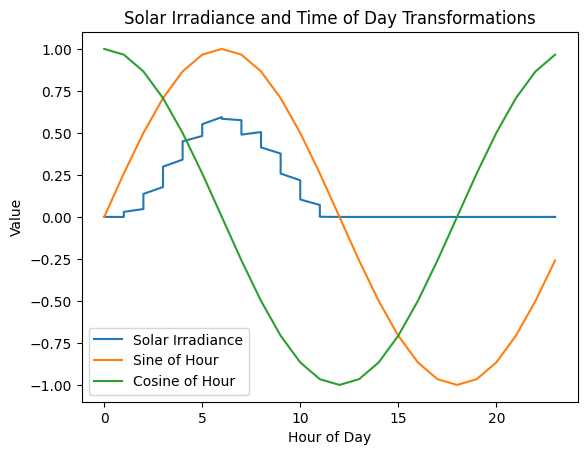

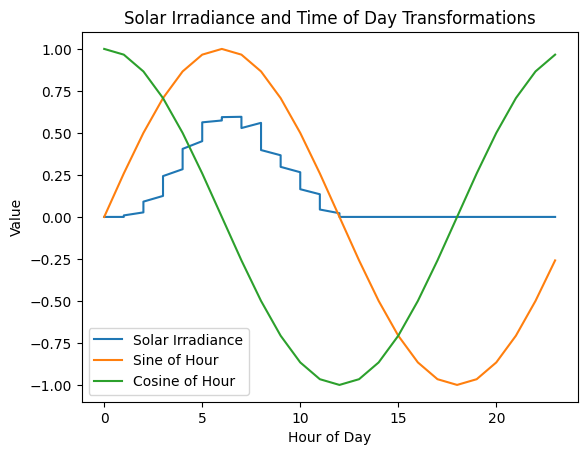

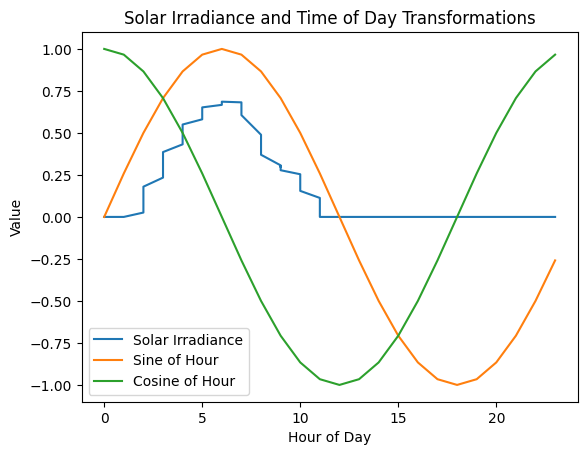

In [ ]:
# bh
dt_converter = DateTimeConverter(bh)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
bh=dt_converter.get_data()
# ch
dt_converter = DateTimeConverter(ch)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
ch=dt_converter.get_data()
# dh
dt_converter = DateTimeConverter(dh)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
dh=dt_converter.get_data()
# kam
dt_converter = DateTimeConverter(kam)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kam=dt_converter.get_data()
# kaz
dt_converter = DateTimeConverter(kaz)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kaz=dt_converter.get_data()
# kur
dt_converter = DateTimeConverter(kur)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
kur=dt_converter.get_data()
# man
dt_converter = DateTimeConverter(man)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
man=dt_converter.get_data()
# pava
dt_converter = DateTimeConverter(pava)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
pava=dt_converter.get_data()
# pha
dt_converter = DateTimeConverter(pha)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
pha=dt_converter.get_data()
# rew
dt_converter = DateTimeConverter(rew)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
rew=dt_converter.get_data()
# sak
dt_converter = DateTimeConverter(sak)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
sak=dt_converter.get_data()
# tan
dt_converter = DateTimeConverter(tan)
dt_converter.add_month_hour_columns()
dt_converter.add_features()
dt_converter.visualize_transformations()
tan=dt_converter.get_data()


# Checking the variance of the data

In [ ]:
class SolarIrradianceMetrics:
    def __init__(self, data_file):
        self.data = data_file
        self.Irradiance = self.data['Ghi']

    def get_mean(self):
        return np.mean(self.Irradiance)

    def get_iqr(self):
        q1 = np.percentile(self.Irradiance, 25)
        q3 = np.percentile(self.Irradiance, 75)
        return q3 - q1

    def get_std_dev(self):
        return np.std(self.Irradiance)

    def plot_histogram(self):
        plt.hist(self.Irradiance, bins=50)
        plt.title('Distribution of Solar Irradiance Data')
        plt.xlabel('Irradiance (w/m^2)')
        plt.ylabel('Frequency')
        plt.show()

    def plot_boxplot(self):
        plt.boxplot(self.Irradiance)
        plt.title('Boxplot of Solar Irradiance Data')
        plt.xlabel('Irradiance (w/m^2)')
        plt.show()

    def plot_stats(self):
        mean = self.get_mean()
        iqr = self.get_iqr()
        std_dev = self.get_std_dev()

        fig, ax = plt.subplots()
        ax.bar(['Mean', 'IQR', 'Std. Dev.'], [mean, iqr, std_dev])
        ax.set_title('Statistics of Solar Irradiance Data')
        ax.set_ylabel('Irradiance (W/m^2)')
        plt.show()


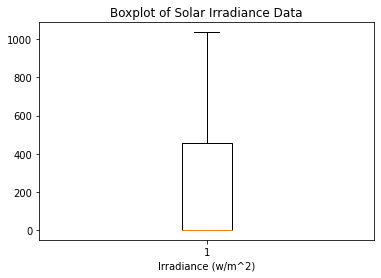

Stnadard Deviation :- 300.776681824732
Inter-quartile Range :- 455.0
Mean :- 220.87882733585857


In [ ]:
sm=SolarIrradianceMetrics(bh)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

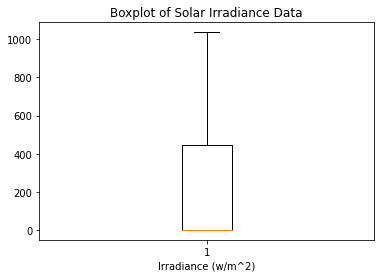

Stnadard Deviation :- 299.4462966874787
Inter-quartile Range :- 443.25
Mean :- 218.87026515151516


In [ ]:
sm=SolarIrradianceMetrics(ch)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

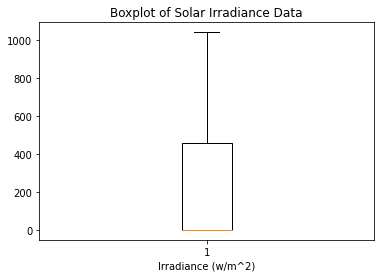

Stnadard Deviation :- 303.24702833181635
Inter-quartile Range :- 456.0
Mean :- 222.03224957912457


In [ ]:
sm=SolarIrradianceMetrics(dh)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

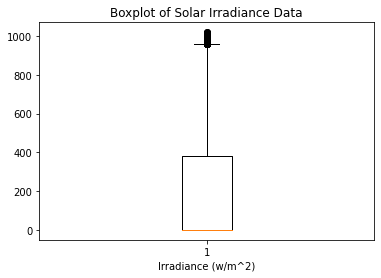

Stnadard Deviation :- 290.02785081617975
Inter-quartile Range :- 383.0
Mean :- 204.68711858164983


In [ ]:
sm=SolarIrradianceMetrics(kam)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

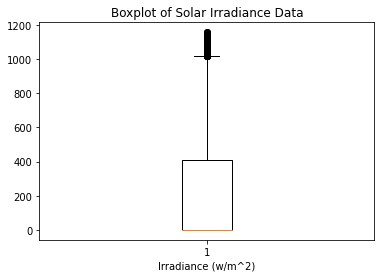

Stnadard Deviation :- 310.9372758982954
Inter-quartile Range :- 407.0
Mean :- 221.69787720959596


In [ ]:
sm=SolarIrradianceMetrics(kaz)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

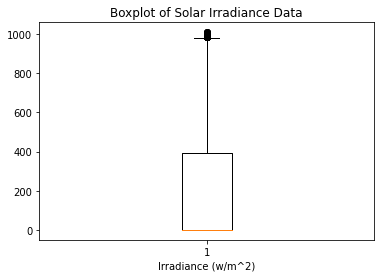

Stnadard Deviation :- 292.4554611962433
Inter-quartile Range :- 393.0
Mean :- 207.43233112373738


In [ ]:
sm=SolarIrradianceMetrics(kur)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

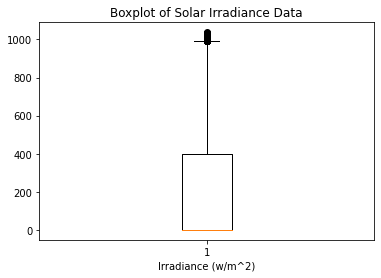

Stnadard Deviation :- 293.2598505729882
Inter-quartile Range :- 397.0
Mean :- 206.58691077441077


In [ ]:
sm=SolarIrradianceMetrics(man)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

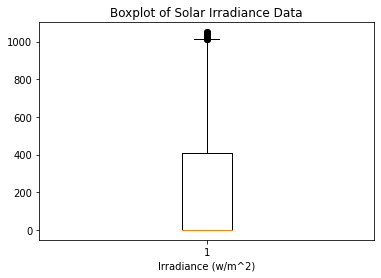

Stnadard Deviation :- 300.8688450373308
Inter-quartile Range :- 406.25
Mean :- 214.91398358585857


In [ ]:
sm=SolarIrradianceMetrics(pava)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

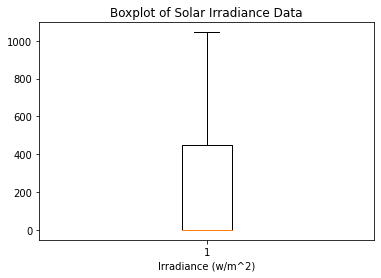

Stnadard Deviation :- 300.6777040313171
Inter-quartile Range :- 451.0
Mean :- 220.29261363636363


In [ ]:
sm=SolarIrradianceMetrics(pha)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

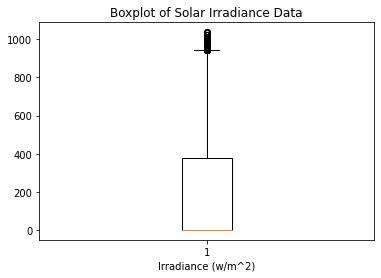

Stnadard Deviation :- 283.85183627053846
Inter-quartile Range :- 378.0
Mean :- 198.93054240319864


In [ ]:
sm=SolarIrradianceMetrics(rew)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

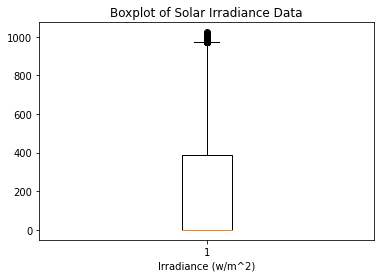

Stnadard Deviation :- 288.5697624045657
Inter-quartile Range :- 389.0
Mean :- 204.15330387205387


In [ ]:
sm=SolarIrradianceMetrics(sak)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

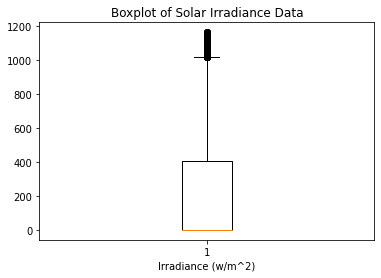

Stnadard Deviation :- 305.13550593345474
Inter-quartile Range :- 407.0
Mean :- 220.37240898569024


In [ ]:
sm=SolarIrradianceMetrics(tan)
sm.plot_boxplot()
print("Stnadard Deviation :-",sm.get_std_dev())
print("Inter-quartile Range :-",sm.get_iqr())
print("Mean :-",sm.get_mean())

# Finding Optimal Time steps Lags

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

class AutocorrelationAnalyzer:
    def __init__(self, data, column_name):
        self.data = data
        self.column_name = column_name

    def calculate_acf(self, lags=None):
        if lags is None:
            lags = len(self.data) - 1
        acf_values = pd.Series(self.data[self.column_name]).autocorr(lag=lags)
        return acf_values

    def plot_acf(self, lags=None):
        if lags is None:
            lags = len(self.data) - 1
        fig, ax = plt.subplots(figsize=(10, 6))
        plot_acf(self.data[self.column_name], lags=lags, ax=ax)
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.title('Autocorrelation Function')
        plt.show()

Autocorrelation at lag 4: 0.930416574132719


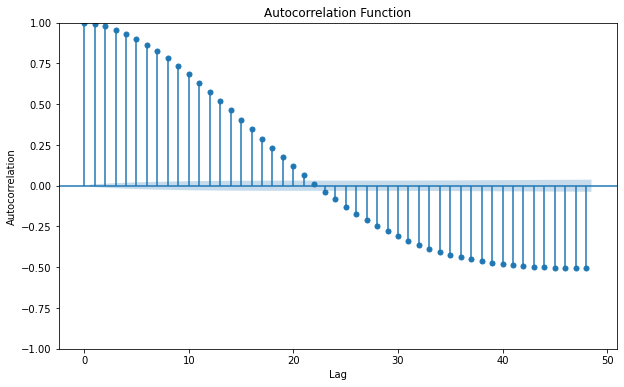

In [ ]:




# Replace 'irradiance' with the name of the column containing your irradiance data
column_name = 'Ghi'

# Create an AutocorrelationAnalyzer instance
analyzer = AutocorrelationAnalyzer(kaz, column_name)

# Calculate and print the autocorrelation for a specific lag (e.g., 4)
lag = 4
print(f"Autocorrelation at lag {lag}: {analyzer.calculate_acf(lag)}")

# Plot the autocorrelation function for the time series
lags_to_plot = 48  # Adjust this value as needed
analyzer.plot_acf(lags_to_plot)

In [ ]:
lag = 96
print(f"Autocorrelation at lag {lag}: {analyzer.calculate_acf(lag)}")

Autocorrelation at lag 96: 0.9121131977606574


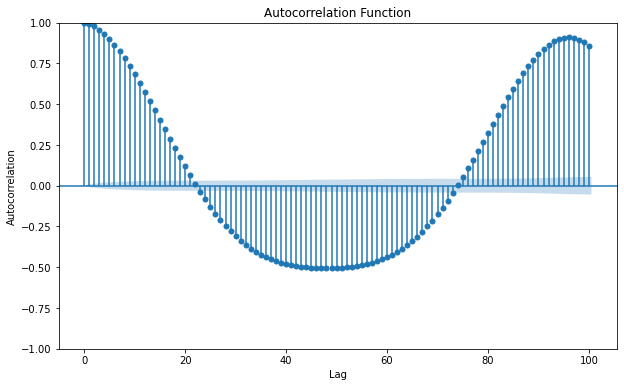

In [ ]:
# Plot the autocorrelation function for the time series
lags_to_plot = 100  # Adjust this value as needed
analyzer.plot_acf(lags_to_plot)

# Data Spliting

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

class SplitData:

    def __init__(self,data,n_timesteps, n_outputs, only_production=False):
        # Read data from csv
        self.df=data
        # self.train=train
        # self.test=test

        self.train = None
        self.test = None

        self.x_train = None
        self.y_train = None

        self.x_test = None
        self.y_test = None

        self.only_production = only_production
        self.lag = n_timesteps

        self.n_features = None
        self.num_of_outputs = n_outputs
        
        self.cols = self.df.columns


    def split_sequences(self, sequences):
        X, y = list(), list()
        for i in range(len(sequences)):
            # find the end of this pattern 
            end_ix = i + self.lag
            # check if we are beyond the dataset
            if end_ix > len(sequences):
                break
            # gather input and output parts of the pattern
            if self.only_production:
                seq_x, seq_y = sequences[i:end_ix, -1], sequences[end_ix:(end_ix+self.num_of_outputs), -1]
            else:
                seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:(end_ix+self.num_of_outputs),-1]
            X.append(seq_x)
            y.append(seq_y)
        return (np.array(X), np.array(y))

    def unique_shapes(self,x, y, lag_, n_features_, num_of_outputs_, only_production):
        uniuqe_shapes = []
        for k in range(len(x)):
            if only_production==True:
                if (x[k].shape == (lag_,)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)
            else:
                if (x[k].shape == (lag_, n_features_)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)       
        x = x[uniuqe_shapes]
        y = y[uniuqe_shapes]
        x = np.stack(x)
        y = np.stack(y)
        return (x, y)
    def preprocess_data(self):
        # Select non-correlated variables and perform One-Hot-Encoding to Months and Sin-Cos Similarities to Hours
        self.n_features = len(self.cols)

        feature_index = self.df.columns.get_loc('Ghi')

        # Pop the feature from its current position
        df_feature = self.df.pop('Ghi')

        # Insert the feature at the last index
        self.df.insert(len(self.df.columns), 'Ghi', df_feature)

        # Set the training data range

        train_start_4 = "2022-07-31T00:00:00Z"
        train_end_4 = "2022-12-31T23:45:00Z"

        # Set the training data range
        train_start_8 = "2022-03-31T00:00:00Z"
        train_end_8 = "2022-12-31T23:45:00Z"

        # Set the training data range
        train_start_12 = "2021-12-31T00:00:00Z"
        train_end_12 = "2022-12-31T23:45:00Z"


        # Set the test data range
        test_start = "2022-12-31T23:45:00Z"

        # Convert the 'PeriodStart' column to a datetime format
        self.df['PeriodStart'] = pd.to_datetime(self.df['PeriodStart'])

        # Split the data into train and test sets based on the date and time range
        self.train_4 = self.df[(self.df['PeriodStart'] >= train_start_4) & (self.df['PeriodStart'] <= train_end_4)]
        self.train_8 = self.df[(self.df['PeriodStart'] >= train_start_8) & (self.df['PeriodStart'] <= train_end_8)]
        self.train_12 = self.df[(self.df['PeriodStart'] >= train_start_12) & (self.df['PeriodStart'] <= train_end_12)]
        self.test = self.df[self.df['PeriodStart'] >= test_start]

        self.x_train_4, self.y_train_4 = self.split_sequences(self.train_4.values)
        self.x_train_8, self.y_train_8 = self.split_sequences(self.train_8.values)
        self.x_train_12, self.y_train_12 = self.split_sequences(self.train_12.values)
        self.x_test, self.y_test = self.split_sequences(self.test.values)

        self.x_train_4, self.y_train_4 = self.unique_shapes(self.x_train_4, self.y_train_4, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_train_8, self.y_train_8 = self.unique_shapes(self.x_train_8, self.y_train_8, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_train_12, self.y_train_12 = self.unique_shapes(self.x_train_12, self.y_train_12, self.lag, self.n_features, self.num_of_outputs, self.only_production)
        self.x_test, self.y_test   = self.unique_shapes(self.x_test,  self.y_test,  self.lag, self.n_features, self.num_of_outputs,self.only_production)

        return ((self.x_train_4[:, :, 1:],self.y_train_4),(self.x_train_8[:, :, 1:],self.y_train_8),(self.x_train_12[:, :, 1:],self.y_train_12),(self.x_test[:, :, 1:],self.y_test))

In [ ]:
len(bh.columns)-1

26

In [ ]:
n_timesteps=96
n_features=26
n_outputs=1

## KAM

In [ ]:
sd3=SplitData(kam,n_timesteps,n_outputs,only_production=False)
kam_train_4,kam_train_8,kam_train_12,kam_test=sd3.preprocess_data()
X_train_kam_4,y_train_kam_4=kam_train_4
X_train_kam_8,y_train_kam_8=kam_train_8
X_train_kam_12,y_train_kam_12=kam_train_12
X_test_kam,y_test_kam=kam_test


df_kam=kam.copy()

df_train_4_date_kam=pd.DataFrame()
df_train_8_date_kam=pd.DataFrame()
df_train_12_date_kam=pd.DataFrame()
df_test_date_kam=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_kam['PeriodStart'] = pd.to_datetime(df_kam['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_kam['Date'] = df_kam[(df_kam['PeriodStart'] >= train_start_4) & (df_kam['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_kam['Date'] = df_kam[(df_kam['PeriodStart'] >= train_start_8) & (df_kam['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_kam['Date']= df_kam[(df_kam['PeriodStart'] >= train_start_12) & (df_kam['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_kam['Date']= df_kam[(df_kam['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_kam=df_train_4_date_kam.iloc[-len(X_train_kam_4):]
df_train_8_date_kam=df_train_8_date_kam.iloc[-len(X_train_kam_8):]
df_train_12_date_kam=df_train_12_date_kam.iloc[-len(X_train_kam_12):]
df_test_date_kam=df_test_date_kam.iloc[-len(X_test_kam):]

<ipython-input-12-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


## kur

In [ ]:
sd3=SplitData(kur,n_timesteps,n_outputs,only_production=False)
kur_train_4,kur_train_8,kur_train_12,kur_test=sd3.preprocess_data()
X_train_kur_4,y_train_kur_4=kur_train_4
X_train_kur_8,y_train_kur_8=kur_train_8
X_train_kur_12,y_train_kur_12=kur_train_12
X_test_kur,y_test_kur=kur_test

df_kur=kur.copy()

df_train_4_date_kur=pd.DataFrame()
df_train_8_date_kur=pd.DataFrame()
df_train_12_date_kur=pd.DataFrame()
df_test_date_kur=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_kur['PeriodStart'] = pd.to_datetime(df_kur['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_kur['Date'] = df_kur[(df_kur['PeriodStart'] >= train_start_4) & (df_kur['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_kur['Date'] = df_kur[(df_kur['PeriodStart'] >= train_start_8) & (df_kur['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_kur['Date']= df_kur[(df_kur['PeriodStart'] >= train_start_12) & (df_kur['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_kur['Date']= df_kur[(df_kur['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_kur=df_train_4_date_kur.iloc[-len(X_train_kur_4):]
df_train_8_date_kur=df_train_8_date_kur.iloc[-len(X_train_kur_8):]
df_train_12_date_kur=df_train_12_date_kur.iloc[-len(X_train_kur_12):]
df_test_date_kur=df_test_date_kur.iloc[-len(X_test_kur):]

<ipython-input-11-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


## man

In [ ]:
sd3=SplitData(man,n_timesteps,n_outputs,only_production=False)
man_train_4,man_train_8,man_train_12,man_test=sd3.preprocess_data()
X_train_man_4,y_train_man_4=man_train_4
X_train_man_8,y_train_man_8=man_train_8
X_train_man_12,y_train_man_12=man_train_12
X_test_man,y_test_man=man_test


df_man=man.copy()

df_train_4_date_man=pd.DataFrame()
df_train_8_date_man=pd.DataFrame()
df_train_12_date_man=pd.DataFrame()
df_test_date_man=pd.DataFrame()

train_start_4 = "2022-07-31T00:00:00Z"
train_end_4 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_8 = "2022-03-31T00:00:00Z"
train_end_8 = "2022-12-31T23:45:00Z"

# Set the training data range
train_start_12 = "2021-12-31T00:00:00Z"
train_end_12 = "2022-12-31T23:45:00Z"


# Set the test data range
test_start = "2022-12-31T23:45:00Z"

# Convert the 'PeriodStart' column to a datetime format
df_man['PeriodStart'] = pd.to_datetime(df_man['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_train_4_date_man['Date'] = df_man[(df_man['PeriodStart'] >= train_start_4) & (df_man['PeriodStart'] <= train_end_4)]['PeriodStart']
df_train_8_date_man['Date'] = df_man[(df_man['PeriodStart'] >= train_start_8) & (df_man['PeriodStart'] <= train_end_8)]['PeriodStart']
df_train_12_date_man['Date']= df_man[(df_man['PeriodStart'] >= train_start_12) & (df_man['PeriodStart'] <= train_end_12)]['PeriodStart']
df_test_date_man['Date']= df_man[(df_man['PeriodStart'] >= test_start)]['PeriodStart']

df_train_4_date_man=df_train_4_date_man.iloc[-len(X_train_man_4):]
df_train_8_date_man=df_train_8_date_man.iloc[-len(X_train_man_8):]
df_train_12_date_man=df_train_12_date_man.iloc[-len(X_train_man_12):]
df_test_date_man=df_test_date_man.iloc[-len(X_test_man):]

<ipython-input-11-4d81ce585261>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


# Data Scaling

In [ ]:
X_train_kam_4 = X_train_kam_4.astype('float32')
y_train_kam_4 = y_train_kam_4.astype('float32')

X_train_kam_8 = X_train_kam_8.astype('float32')
y_train_kam_8 = y_train_kam_8.astype('float32')

X_train_kam_12 = X_train_kam_12.astype('float32')
y_train_kam_12 = y_train_kam_12.astype('float32')

X_test_kam = X_test_kam.astype('float32')
y_test_kam = y_test_kam.astype('float32')

In [ ]:
X_train_kur_4 = X_train_kur_4.astype('float32')
y_train_kur_4 = y_train_kur_4.astype('float32')

X_train_kur_8 = X_train_kur_8.astype('float32')
y_train_kur_8 = y_train_kur_8.astype('float32')

X_train_kur_12 = X_train_kur_12.astype('float32')
y_train_kur_12 = y_train_kur_12.astype('float32')

X_test_kur = X_test_kur.astype('float32')
y_test_kur = y_test_kur.astype('float32')

In [ ]:
X_train_man_4 = X_train_man_4.astype('float32')
y_train_man_4 = y_train_man_4.astype('float32')

X_train_man_8 = X_train_man_8.astype('float32')
y_train_man_8 = y_train_man_8.astype('float32')

X_train_man_12 = X_train_man_12.astype('float32')
y_train_man_12 = y_train_man_12.astype('float32')

X_test_man = X_test_man.astype('float32')
y_test_man = y_test_man.astype('float32')

## KAM

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_kam_4 = X_train_kam_4.reshape(X_train_kam_4.shape[0], -1)
X_train_flat_kam_8= X_train_kam_8.reshape(X_train_kam_8.shape[0], -1)
X_train_flat_kam_12 = X_train_kam_12.reshape(X_train_kam_12.shape[0], -1)
X_test_flat_kam = X_test_kam.reshape(X_test_kam.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_kam = MinMaxScaler(feature_range=(0,1))
X_train_scaled_kam_4 = scaler_kam.fit_transform(X_train_flat_kam_4)
X_train_scaled_kam_8 = scaler_kam.fit_transform(X_train_flat_kam_8)
X_train_scaled_kam_12 = scaler_kam.fit_transform(X_train_flat_kam_12)
X_test_scaled_kam = scaler_kam.transform(X_test_flat_kam)

# Reshape back to original shape
X_train_kam_4= X_train_scaled_kam_4.reshape(X_train_kam_4.shape)
X_train_kam_8= X_train_scaled_kam_8.reshape(X_train_kam_8.shape)
X_train_kam_12= X_train_scaled_kam_12.reshape(X_train_kam_12.shape)
X_test_kam= X_test_scaled_kam.reshape(X_test_kam.shape)


scaler_y_kam = MinMaxScaler(feature_range=(0,1))
y_train_kam_4 = scaler_y_kam.fit_transform(y_train_kam_4)
y_train_kam_8 = scaler_y_kam.fit_transform(y_train_kam_8)
y_train_kam_12 = scaler_y_kam.fit_transform(y_train_kam_12)
y_test_kam=scaler_y_kam.transform(y_test_kam)

## KUR

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_kur_4 = X_train_kur_4.reshape(X_train_kur_4.shape[0], -1)
X_train_flat_kur_8= X_train_kur_8.reshape(X_train_kur_8.shape[0], -1)
X_train_flat_kur_12 = X_train_kur_12.reshape(X_train_kur_12.shape[0], -1)
X_test_flat_kur = X_test_kur.reshape(X_test_kur.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_kur = MinMaxScaler(feature_range=(0,1))
X_train_scaled_kur_4 = scaler_kur.fit_transform(X_train_flat_kur_4)
X_train_scaled_kur_8 = scaler_kur.fit_transform(X_train_flat_kur_8)
X_train_scaled_kur_12 = scaler_kur.fit_transform(X_train_flat_kur_12)
X_test_scaled_kur = scaler_kur.transform(X_test_flat_kur)

# Reshape back to original shape
X_train_kur_4= X_train_scaled_kur_4.reshape(X_train_kur_4.shape)
X_train_kur_8= X_train_scaled_kur_8.reshape(X_train_kur_8.shape)
X_train_kur_12= X_train_scaled_kur_12.reshape(X_train_kur_12.shape)
X_test_kur= X_test_scaled_kur.reshape(X_test_kur.shape)


scaler_y_kur = MinMaxScaler(feature_range=(0,1))
y_train_kur_4 = scaler_y_kur.fit_transform(y_train_kur_4)
y_train_kur_8 = scaler_y_kur.fit_transform(y_train_kur_8)
y_train_kur_12 = scaler_y_kur.fit_transform(y_train_kur_12)
y_test_kur=scaler_y_kur.transform(y_test_kur)

## MAN

In [ ]:
# Flatten X_train and X_test to 2 dimensions
X_train_flat_man_4 = X_train_man_4.reshape(X_train_man_4.shape[0], -1)
X_train_flat_man_8= X_train_man_8.reshape(X_train_man_8.shape[0], -1)
X_train_flat_man_12 = X_train_man_12.reshape(X_train_man_12.shape[0], -1)
X_test_flat_man = X_test_man.reshape(X_test_man.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler_man = MinMaxScaler(feature_range=(0,1))
X_train_scaled_man_4 = scaler_man.fit_transform(X_train_flat_man_4)
X_train_scaled_man_8 = scaler_man.fit_transform(X_train_flat_man_8)
X_train_scaled_man_12 = scaler_man.fit_transform(X_train_flat_man_12)
X_test_scaled_man = scaler_man.transform(X_test_flat_man)

# Reshape back to original shape
X_train_man_4= X_train_scaled_man_4.reshape(X_train_man_4.shape)
X_train_man_8= X_train_scaled_man_8.reshape(X_train_man_8.shape)
X_train_man_12= X_train_scaled_man_12.reshape(X_train_man_12.shape)
X_test_man= X_test_scaled_man.reshape(X_test_man.shape)


scaler_y_man = MinMaxScaler(feature_range=(0,1))
y_train_man_4 = scaler_y_man.fit_transform(y_train_man_4)
y_train_man_8 = scaler_y_man.fit_transform(y_train_man_8)
y_train_man_12 = scaler_y_man.fit_transform(y_train_man_12)
y_test_man=scaler_y_man.transform(y_test_man)

# Solar Irradiance Forecasting Transfer-Learning Model

In [ ]:
from keras.layers import Reshape
class TransferLearningModel:

    def __init__(self, base_model_path, target_regions, n_timesteps, n_features, n_outputs):
        self.base_model_path = base_model_path
        self.target_regions = target_regions
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = None
        self.history = None

    def build_model_strategy_1(self):
        # Load base model and freeze all layers except last one
        self.model = load_model(self.base_model_path)
        for layer in self.model.layers[:-1]:
            layer.trainable = False

    def build_model_strategy_2(self):
    # Load base model and use it as weight initialization for TL model
      self.model = load_model(self.base_model_path)
    def build_model_strategy_3(self):
    # Load base model and freeze initial layers, add new output layer
      self.model = load_model(self.base_model_path)
      for layer in self.model.layers[:-1]:
          layer.trainable = False
      self.model.layers[-2].trainable = True
      self.model.pop()
      x = self.model.layers[-1].output
      x = Dense(self.n_outputs)(x)
      self.model = Model(inputs=self.model.input, outputs=x)
    def compile_model(self, learning_rate=0.001):
        optimizer = Adam(learning_rate=learning_rate)
        self.model.compile(optimizer=optimizer, loss='mse')
        self.model.summary()

    def fit_model(self, train_data, train_labels, val_data, val_labels, batch_size=128 ,epochs=250, patience=10, verbose=1,
                checkpoint_path=None):
        # Define early stopping and model checkpoint callbacks
        early_stopping = EarlyStopping(monitor='val_loss', patience=patience, verbose=verbose, mode='min', restore_best_weights=True)
        if checkpoint_path is not None:
            model_checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=verbose, save_best_only=True, mode='min')

        # Fit the model
        if checkpoint_path is not None:
            self.history = self.model.fit(train_data, train_labels, validation_split=0.2, batch_size=batch_size, epochs=epochs,
                                        callbacks=[ model_checkpoint,early_stopping], verbose=verbose)
        else:
            self.history = self.model.fit(train_data, train_labels, validation_split=0.2, batch_size=batch_size, epochs=epochs,
                                        callbacks=[model_checkpoint,early_stopping], verbose=verbose)
    def load_trained_model(self, path):
      self.model = load_model(path)

    def plot_loss_history(self):
        train_loss = self.history.history['loss']
        val_loss = self.history.history['val_loss']
        epochs = range(1, len(train_loss) + 1)
        plt.plot(epochs, train_loss, 'bo', label='Training loss')
        plt.plot(epochs, val_loss, 'b', label='Validation loss')
        plt.title('Training and validation loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()
    def save_trained(self,path):
      self.model.save(path)
    def predict(self, data):
        return self.model.predict(data)


# KAM

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_kam_4, y_train_kam_4, X_test_kam, y_test_kam, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0560 - mae: 0.1143
Epoch 1: val_loss improved from inf to 0.00562, saving model to /content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5
92/92 [==============================] - 22s 143ms/step - loss: 0.0560 - mae: 0.1143 - val_loss: 0.0056 - val_mae: 0.0577
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0040 - mae: 0.0411
Epoch 2: val_loss improved from 0.00562 to 0.00455, saving model to /content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5
92/92 [==============================] - 12s 125ms/step - loss: 0.0040 - mae: 0.0411 - val_loss: 0.0046 - val_mae: 0.0569
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0030 - mae: 0.0337
Epoch 3: val_loss did not improve from 0.00455
92/92 [==============================] - 11s 125ms/step - loss: 0.0030 - mae: 0.0337 - val_loss: 0.0055 - val_mae: 0.0652
Epo

181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

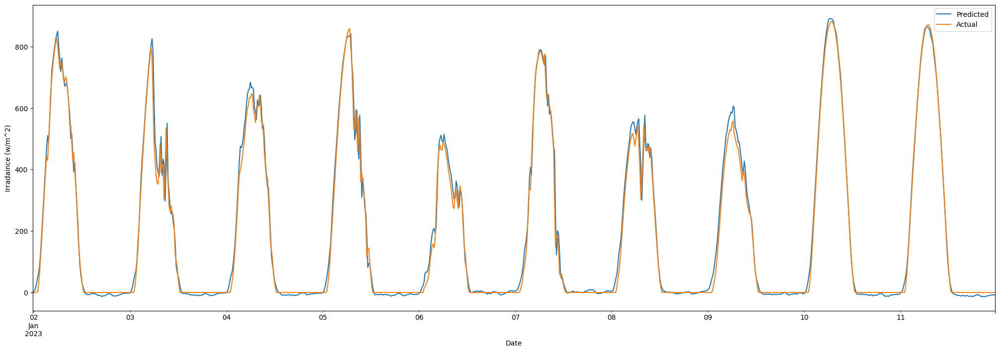

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(best_model.predict(X_test_kam))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9829181788385142
Root Mean Sqaured Error 39.942123
Mean Absolute Error 30.681252


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_kam_8, y_train_kam_8, X_test_kam, y_test_kam, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0225 - mae: 0.0785
Epoch 1: val_loss improved from inf to 0.00427, saving model to /content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 32s 147ms/step - loss: 0.0225 - mae: 0.0785 - val_loss: 0.0043 - val_mae: 0.0484
Epoch 2/250
165/165 [==============================] - ETA: 0s - loss: 0.0029 - mae: 0.0326
Epoch 2: val_loss improved from 0.00427 to 0.00335, saving model to /content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5
165/165 [==============================] - 22s 131ms/step - loss: 0.0029 - mae: 0.0326 - val_loss: 0.0033 - val_mae: 0.0438
Epoch 3/250
165/165 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.0280
Epoch 3: val_loss improved from 0.00335 to 0.00207, saving model to /content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5
165

181/181 [==============================] - 4s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

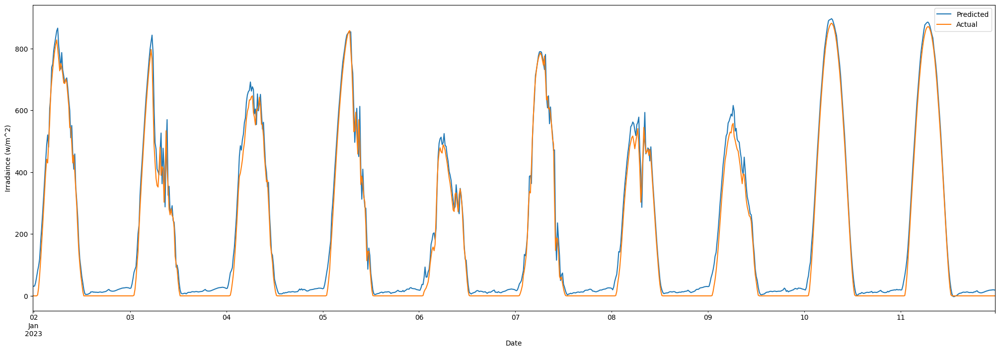

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(best_model.predict(X_test_kam))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9905956803856257
Root Mean Sqaured Error 29.539507
Mean Absolute Error 20.137989


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_kam_12, y_train_kam_12, X_test_kam, y_test_kam, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0219 - mae: 0.0651
Epoch 1: val_loss improved from inf to 0.00259, saving model to /content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 41s 148ms/step - loss: 0.0219 - mae: 0.0651 - val_loss: 0.0026 - val_mae: 0.0344
Epoch 2/250
219/219 [==============================] - ETA: 0s - loss: 0.0023 - mae: 0.0297
Epoch 2: val_loss improved from 0.00259 to 0.00191, saving model to /content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5
219/219 [==============================] - 29s 134ms/step - loss: 0.0023 - mae: 0.0297 - val_loss: 0.0019 - val_mae: 0.0300
Epoch 3/250
219/219 [==============================] - ETA: 0s - loss: 0.0018 - mae: 0.0256
Epoch 3: val_loss improved from 0.00191 to 0.00150, saving model to /content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/Bi-LSTM/Best_base.h5
219

181/181 [==============================] - 4s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

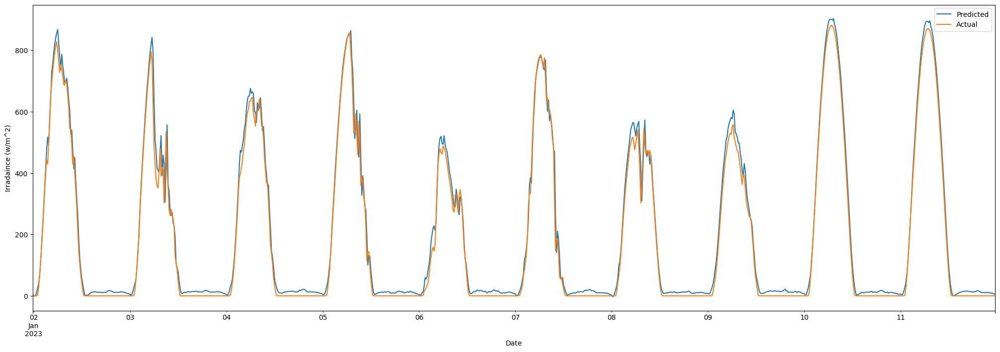

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(best_model.predict(X_test_kam))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9922391306573731
Root Mean Sqaured Error 27.444721
Mean Absolute Error 18.926197


## Persistance model

In [ ]:
kam

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,24.6,-112,95.4,56.8,92.1,1012.8,15,2.9,103,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,24.5,-112,95.1,56.8,92.6,1013.0,12,3.0,100,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,24.5,-112,91.6,56.8,93.0,1013.2,10,3.1,96,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,24.4,-113,82.1,56.8,93.4,1013.4,8,3.2,93,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,24.4,-114,71.6,56.9,93.7,1013.7,7,3.2,90,...,0,0,0,0,0,0,1,0.258819,0.965926,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,22.7,-93,0.0,20.4,73.1,1018.3,10,3.0,122,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,22.8,-93,0.0,20.6,72.7,1018.4,10,3.1,119,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,23.1,-94,0.0,20.8,72.2,1018.5,11,3.1,115,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,23.3,-94,0.0,21.0,71.6,1018.6,12,3.1,111,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# kam['PeriodStart'] = pd.to_datetime(df_kam['PeriodStart'])
df_per_kam =pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_kam = kam[kam['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
df_per_kam

,PeriodStart,Ghi
70176,2023-01-01 00:00:00+00:00,0
70177,2023-01-01 00:15:00+00:00,0
70178,2023-01-01 00:30:00+00:00,0
70179,2023-01-01 00:45:00+00:00,0
70180,2023-01-01 01:00:00+00:00,3
...,...,...
76027,2023-03-02 22:45:00+00:00,0
76028,2023-03-02 23:00:00+00:00,0
76029,2023-03-02 23:15:00+00:00,0
76030,2023-03-02 23:30:00+00:00,0


In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_kam
# Apply the Persistence model
forecast = persistence_model(data)



In [ ]:
df_per_kam['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

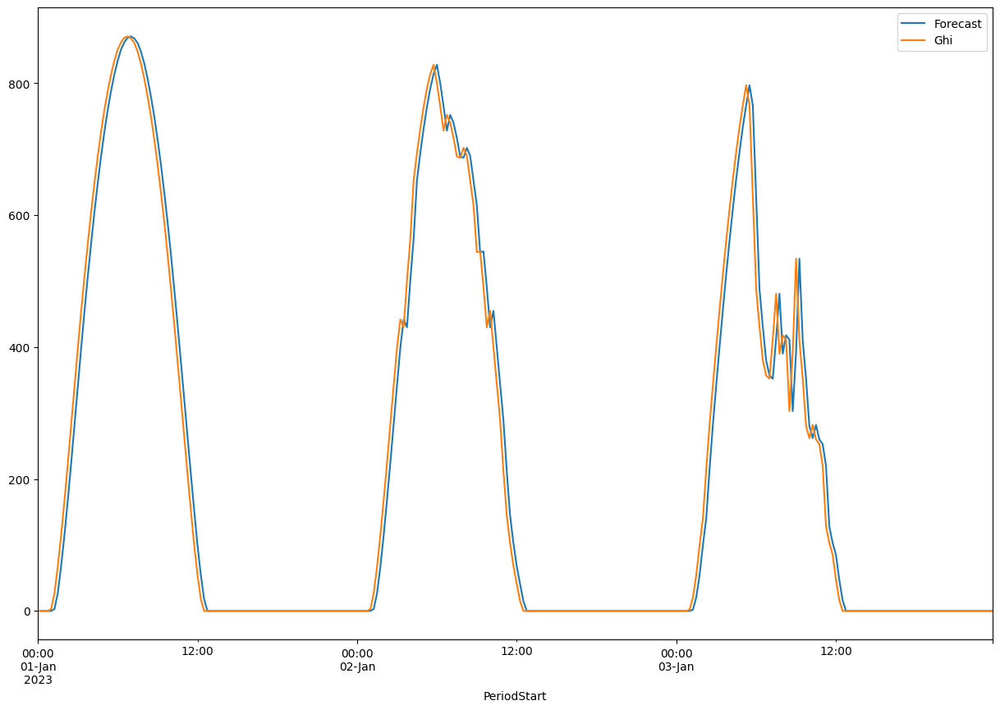

In [ ]:
df_per_kam.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_kam.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_kam['Forecast'],df_per_kam['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_kam['Forecast'],df_per_kam['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_kam['Forecast'],df_per_kam['Ghi']))

r2_Score 0.9874831047459152
Root Mean Sqaured Error 34.38657514143131
Mean Absolute Error 19.69871904355252


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_kam_4,y_train_kam_4,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0012
Epoch 1: val_loss improved from inf to 0.00110, saving model to /content/drive/MyDrive/Generalizati

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9929284510959056
Root Mean Sqaured Error 26.46945
Mean Absolute Error 17.692318


Text(0, 0.5, 'Irradiance (W/m^2)')

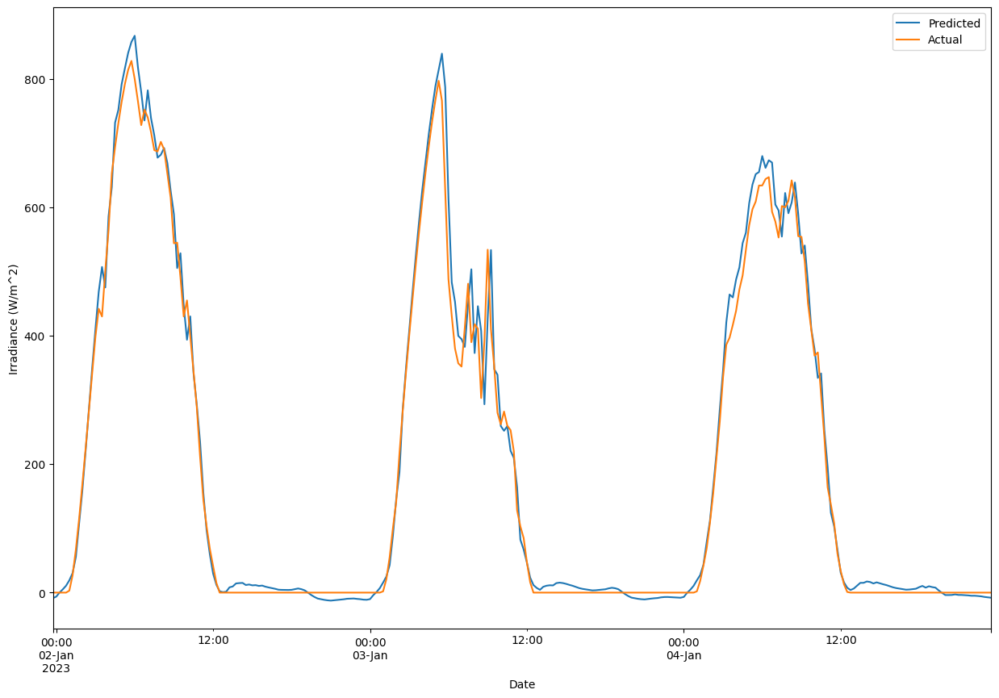

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_1.predict(X_test_kam))
print("r2_Score",r2_score(p3_1.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_kam_8,y_train_kam_8,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 0.0012
Epoch 1: val_loss improved from inf to 0.00097, saving model to /content/drive/MyDrive/Generaliza

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9936165971959191
Root Mean Sqaured Error 25.149256
Mean Absolute Error 15.759571


Text(0, 0.5, 'Irradiance (W/m^2)')

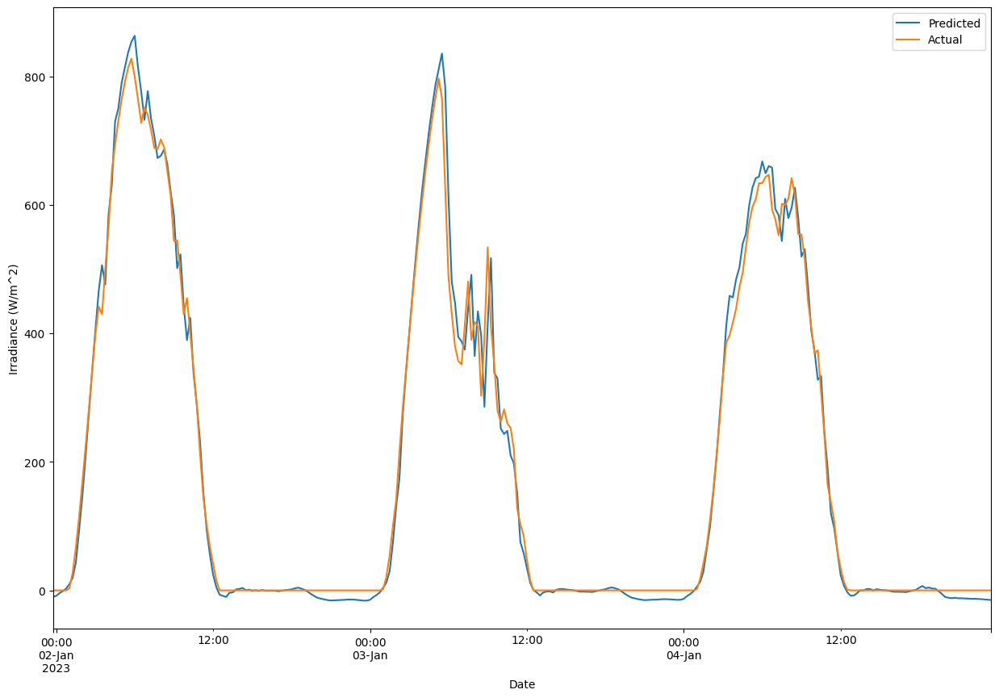

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_1.predict(X_test_kam))
print("r2_Score",r2_score(p3_1.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_kam_12,y_train_kam_12,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 9.8367e-04
Epoch 1: val_loss improved from inf to 0.00101, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9940416390863323
Root Mean Sqaured Error 23.852741
Mean Absolute Error 13.016799


Text(0, 0.5, 'Irradiance (W/m^2)')

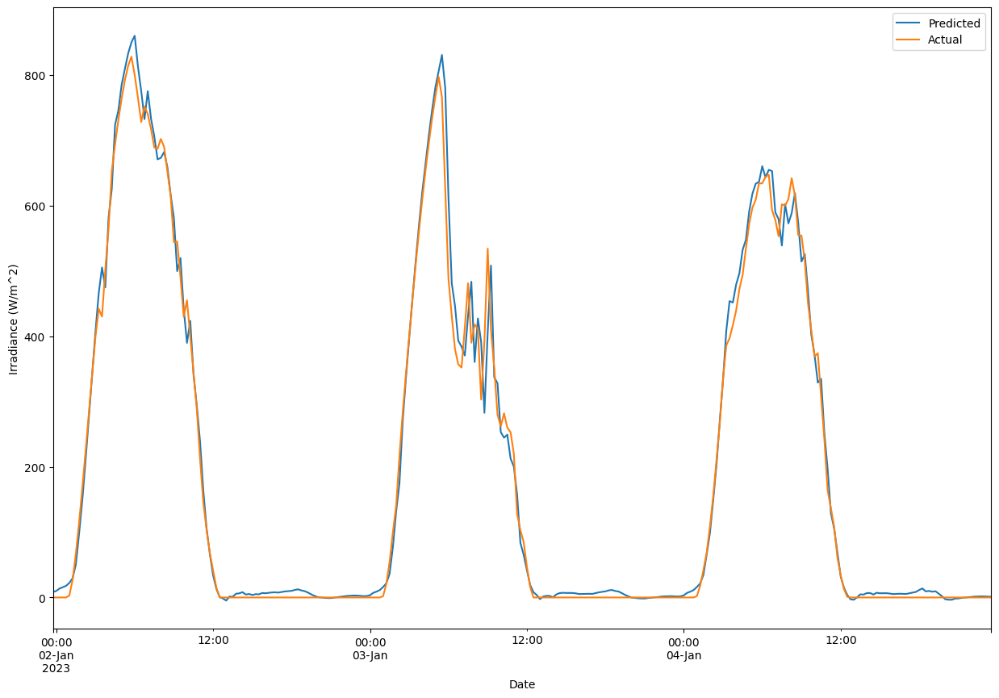

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_1.predict(X_test_kam))
print("r2_Score",r2_score(p3_1.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_kam_4,y_train_kam_4,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='//content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S2_4.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
91/92 [============================>.] - ETA: 0s - loss: 0.0015
Epoch 1: val_loss improved from inf to 0.00157, saving model to //content/drive/MyDrive/Generalizati

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9942632799996647
Root Mean Sqaured Error 23.142307
Mean Absolute Error 12.488224


Text(0, 0.5, 'Irradiance (W/m^2)')

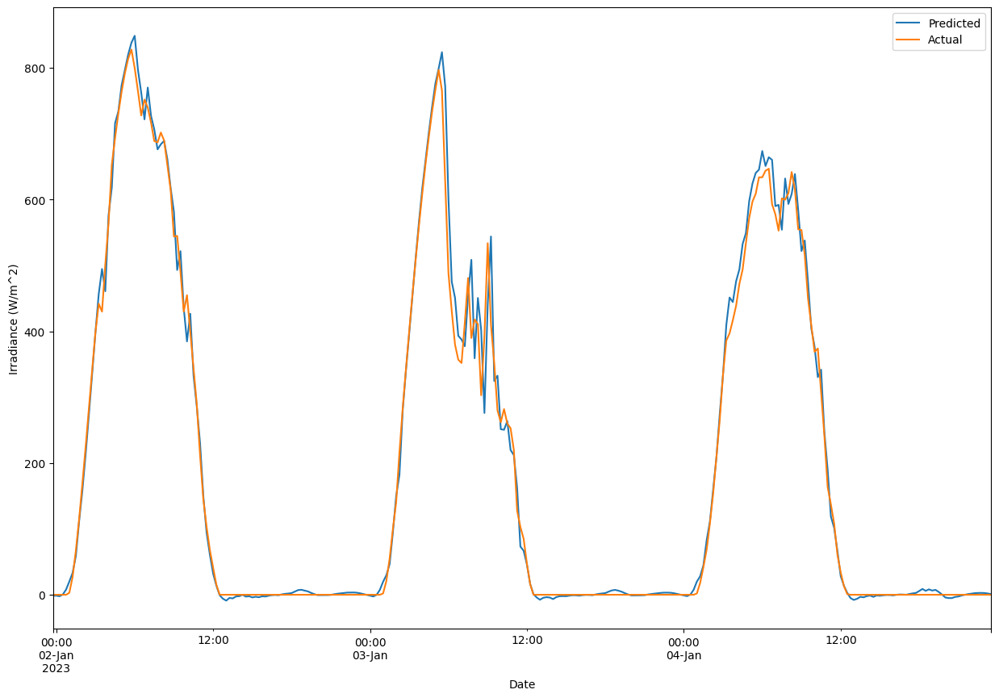

In [ ]:

df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_2.predict(X_test_kam))
print("r2_Score",r2_score(p3_2.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_kam_8,y_train_kam_8,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S2_8.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0014
Epoch 1: val_loss improved from inf to 0.00081, saving model to /content/drive/MyDrive/Generalizat

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9928716714191809
Root Mean Sqaured Error 25.57762
Mean Absolute Error 14.985531


Text(0, 0.5, 'Irradiance (W/m^2)')

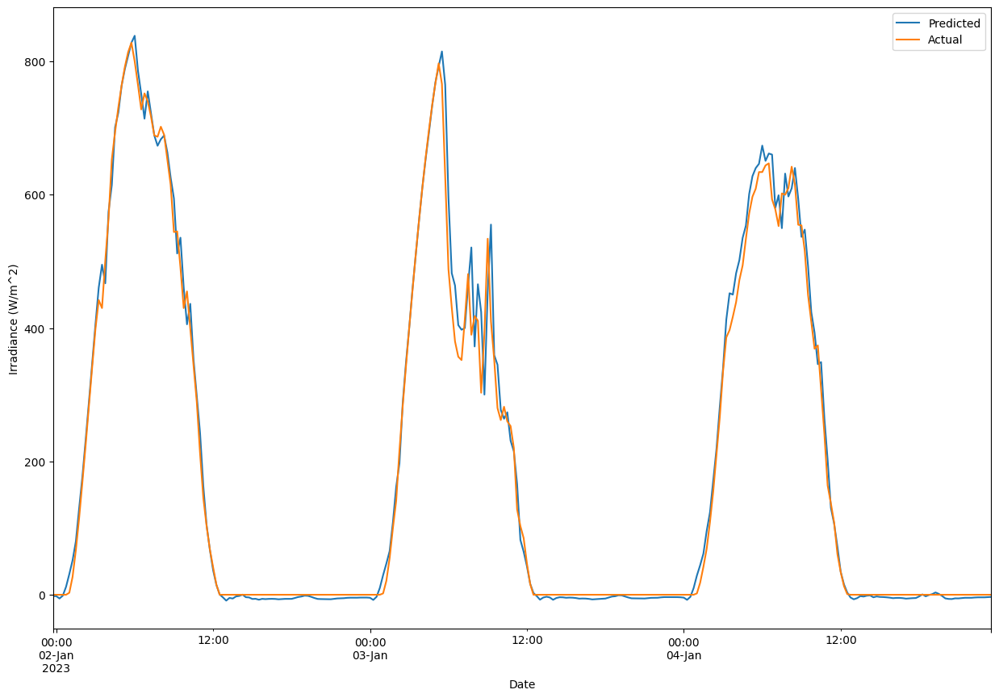

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_2.predict(X_test_kam))
print("r2_Score",r2_score(p3_2.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_kam_12,y_train_kam_12,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S2_12.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0011
Epoch 1: val_loss improved from inf to 0.00083, saving model to /content/drive/MyDrive/Generalizat

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9947619220982125
Root Mean Sqaured Error 22.246235
Mean Absolute Error 10.234205


Text(0, 0.5, 'Irradiance (W/m^2)')

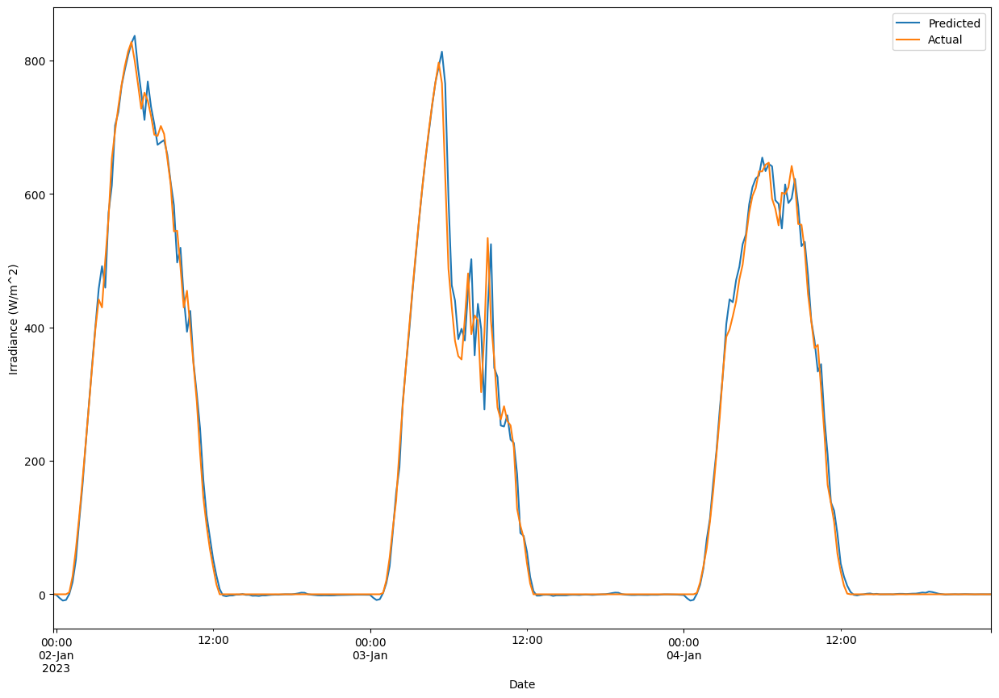

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_2.predict(X_test_kam))
print("r2_Score",r2_score(p3_2.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_kam_4,y_train_kam_4,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9916192902008831
Root Mean Sqaured Error 28.999712
Mean Absolute Error 22.132217


Text(0, 0.5, 'Irradiance (W/m^2)')

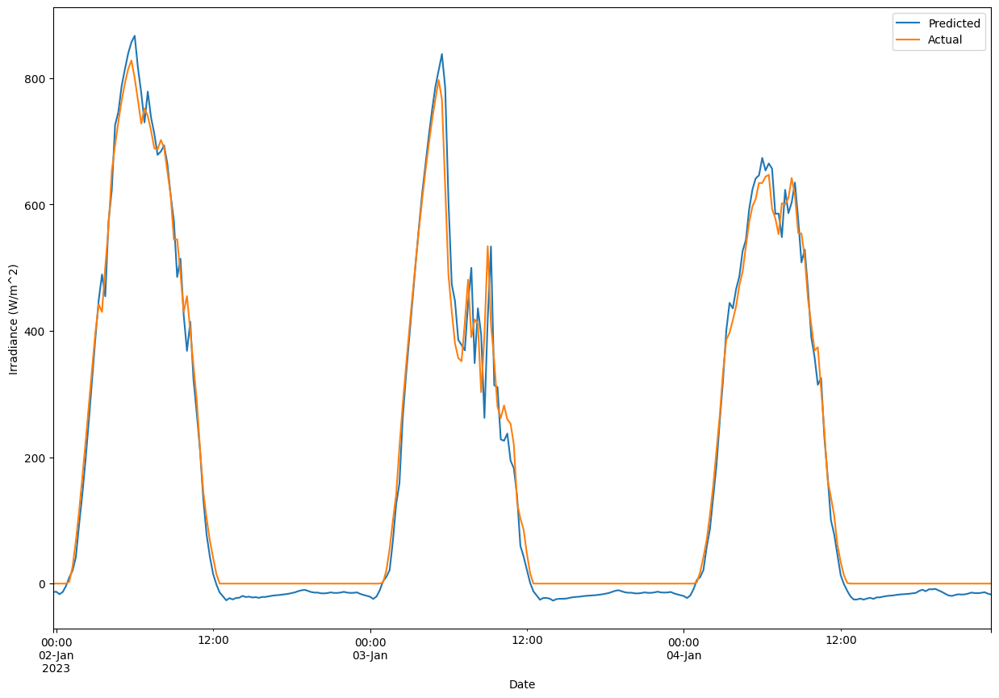

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_3.predict(X_test_kam))
print("r2_Score",r2_score(p3_3.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_kam_8,y_train_kam_8,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9930554282123564
Root Mean Sqaured Error 24.997683
Mean Absolute Error 14.616899


Text(0, 0.5, 'Irradiance (W/m^2)')

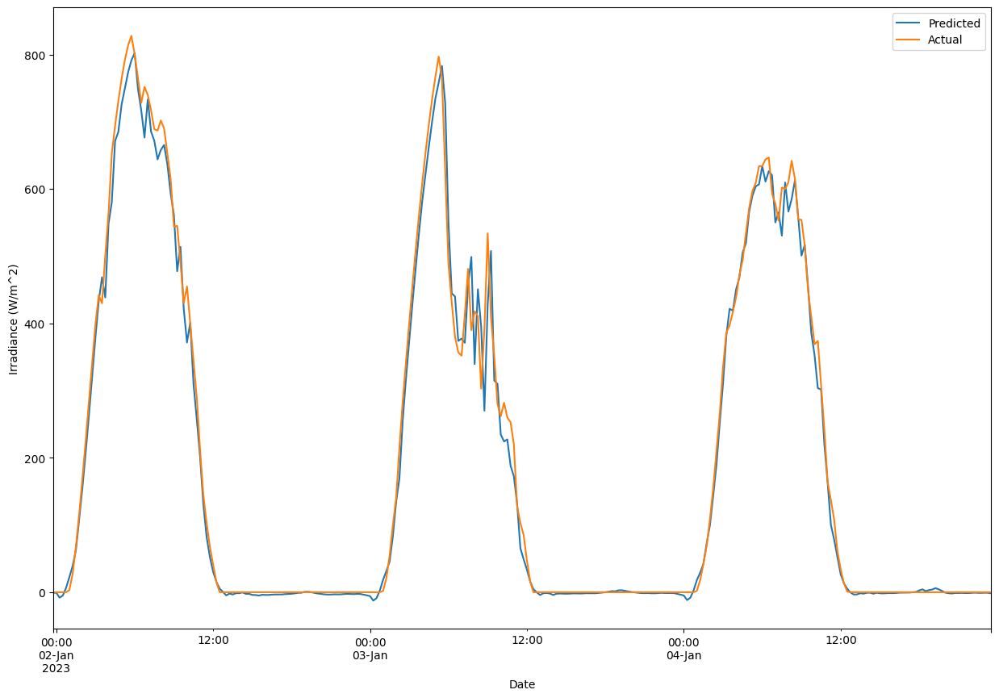

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_3.predict(X_test_kam))
print("r2_Score",r2_score(p3_3.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_kam_12,y_train_kam_12,X_test_kam,y_test_kam,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_6 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 1s 8ms/step
r2_Score 0.994444403274179
Root Mean Sqaured Error 23.11272
Mean Absolute Error 12.424009


Text(0, 0.5, 'Irradiance (W/m^2)')

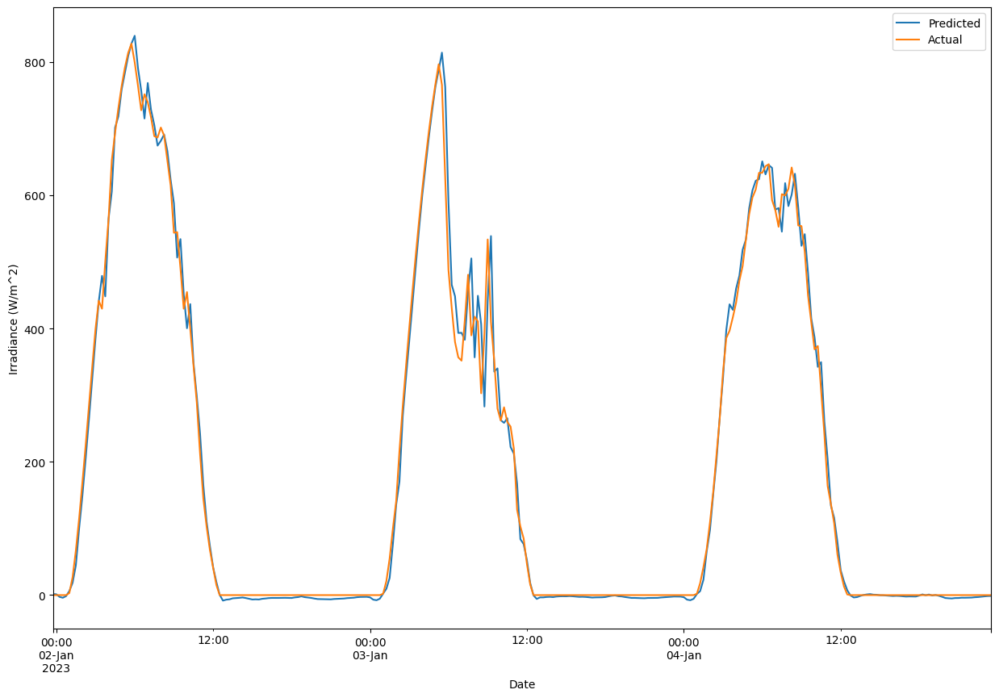

In [ ]:
df_test_date_kam['Actual']=scaler_y_kam.inverse_transform(y_test_kam)
df_test_date_kam['Predicted']=scaler_y_kam.inverse_transform(p3_3.predict(X_test_kam))
print("r2_Score",r2_score(p3_3.predict(X_test_kam),y_test_kam))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kam['Actual'],df_test_date_kam['Predicted']))
df_test_date_kam.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# KUR

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Kurnool/Bi-LSTM/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_kur_4, y_train_kur_4, X_test_kur, y_test_kur, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0450 - mae: 0.1043
Epoch 1: val_loss improved from inf to 0.00885, saving model to /content/drive/MyDrive/Generalization_India_Models/Kurnool/Bi-LSTM/Best_base.h5
92/92 [==============================] - 29s 150ms/step - loss: 0.0450 - mae: 0.1043 - val_loss: 0.0089 - val_mae: 0.0817
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0034 - mae: 0.0362
Epoch 2: val_loss improved from 0.00885 to 0.00466, saving model to /content/drive/MyDrive/Generalization_India_Models/Kurnool/Bi-LSTM/Best_base.h5
92/92 [==============================] - 11s 121ms/step - loss: 0.0034 - mae: 0.0362 - val_loss: 0.0047 - val_mae: 0.0563
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0025 - mae: 0.0296
Epoch 3: val_loss improved from 0.00466 to 0.00302, saving model to /content/drive/MyDrive/Generalization_India_Models/Kurnool/Bi-LSTM/Best_base.h5
92/92 [==============================] - 11s 1

181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

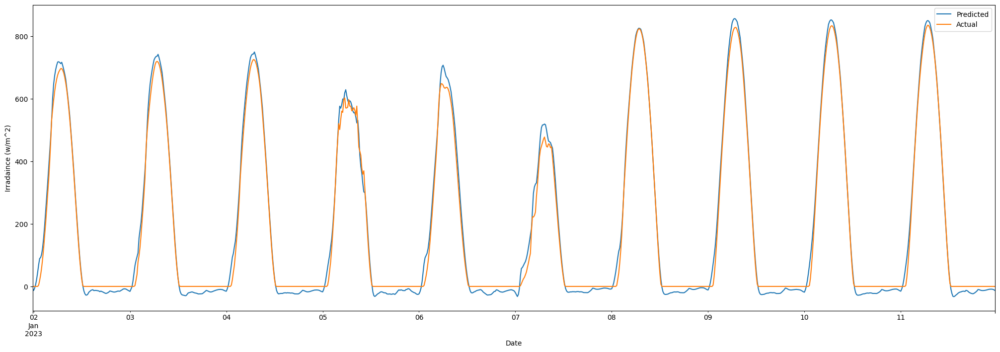

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(best_model.predict(X_test_kur))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9931598044498317
Root Mean Sqaured Error 26.72117
Mean Absolute Error 22.870897


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_kur_8, y_train_kur_8, X_test_kur, y_test_kur, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

181/181 [==============================] - 5s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

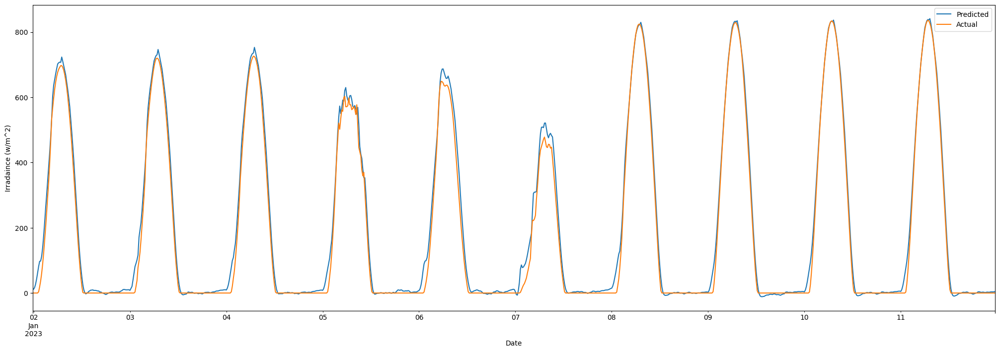

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(best_model.predict(X_test_kur))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9902969574944632
Root Mean Sqaured Error 31.299675
Mean Absolute Error 25.350529


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_kur_12, y_train_kur_12, X_test_kur, y_test_kur, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

181/181 [==============================] - 4s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

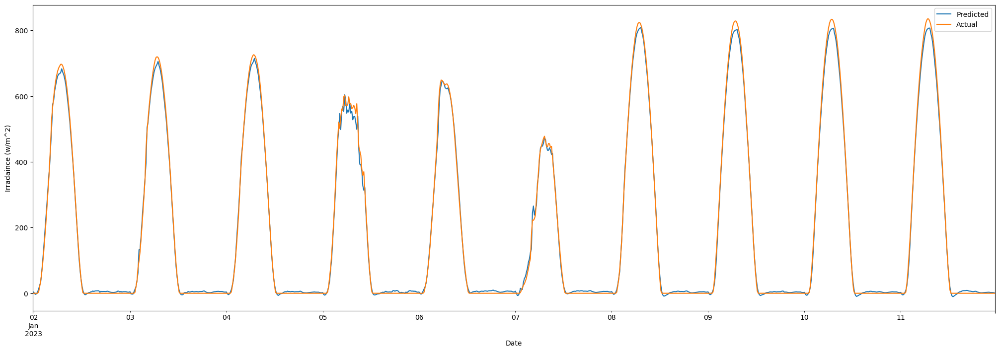

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(best_model.predict(X_test_kur))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.9981612664879581
Root Mean Sqaured Error 13.342684
Mean Absolute Error 9.197177


## Persistance model

In [ ]:
kur

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,22.0,-110,0.6,40.5,80.9,984.9,104,2.4,106,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,22.0,-111,0.0,40.4,80.5,985.1,104,2.4,102,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,22.0,-112,0.0,40.4,80.1,985.3,103,2.4,99,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,22.0,-112,0.0,40.3,79.7,985.5,103,2.4,96,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,22.1,-113,0.0,40.3,79.2,985.7,102,2.4,92,...,0,0,0,0,0,0,1,0.258819,0.965926,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,21.4,-89,0.0,14.9,54.9,988.5,162,2.3,123,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,21.5,-90,0.0,14.8,55.5,988.6,162,2.3,119,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,21.8,-91,0.0,14.8,56.5,988.7,162,2.2,116,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,22.1,-92,0.0,14.7,57.5,988.8,161,2.2,112,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# kur['PeriodStart'] = pd.to_datetime(df_kur['PeriodStart'])
df_per_kur =pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_kur = kur[kur['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
df_per_kur

,PeriodStart,Ghi
70176,2023-01-01 00:00:00+00:00,0
70177,2023-01-01 00:15:00+00:00,0
70178,2023-01-01 00:30:00+00:00,0
70179,2023-01-01 00:45:00+00:00,0
70180,2023-01-01 01:00:00+00:00,0
...,...,...
76027,2023-03-02 22:45:00+00:00,0
76028,2023-03-02 23:00:00+00:00,0
76029,2023-03-02 23:15:00+00:00,0
76030,2023-03-02 23:30:00+00:00,0


In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_kur
# Apply the Persistence model
forecast = persistence_model(data)



In [ ]:
df_per_kur['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

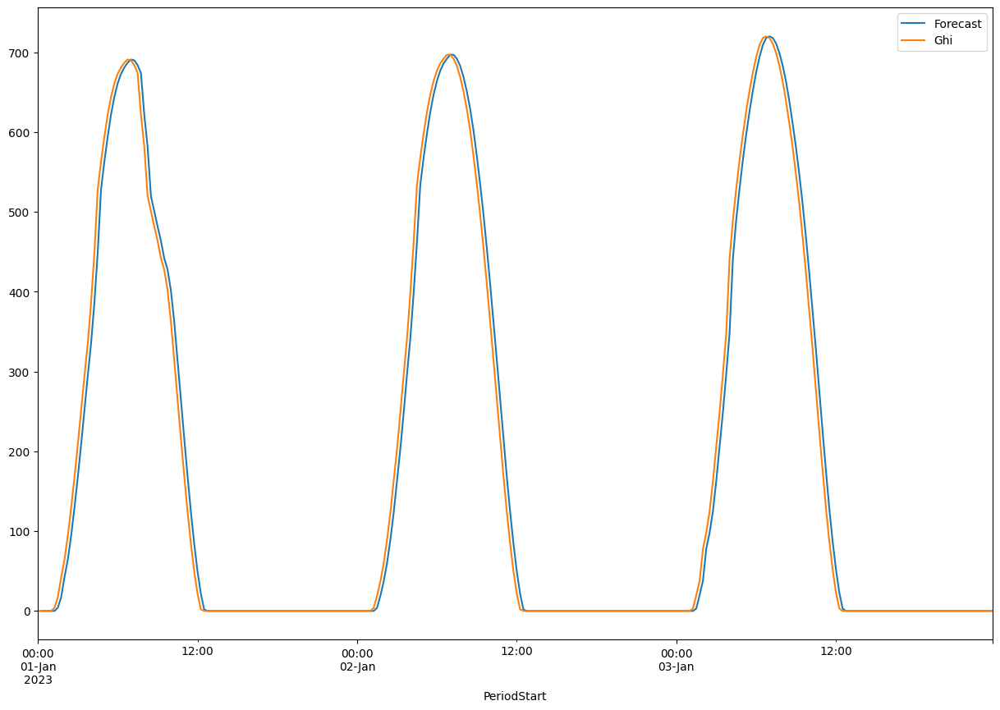

In [ ]:
df_per_kur.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_kur.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_kur['Forecast'],df_per_kur['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_kur['Forecast'],df_per_kur['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_kur['Forecast'],df_per_kur['Ghi']))

r2_Score 0.9918695096385224
Root Mean Sqaured Error 28.753227272174662
Mean Absolute Error 17.776259607173355


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_kur_4,y_train_kur_4,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
90/92 [============================>.] - ETA: 0s - loss: 0.0010
Epoch 1: val_loss improved from inf to 0.00038, saving model to /content/drive/MyDrive/Generalizati

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9978785454460395
Root Mean Sqaured Error 14.965356
Mean Absolute Error 11.904977


Text(0, 0.5, 'Irradiance (W/m^2)')

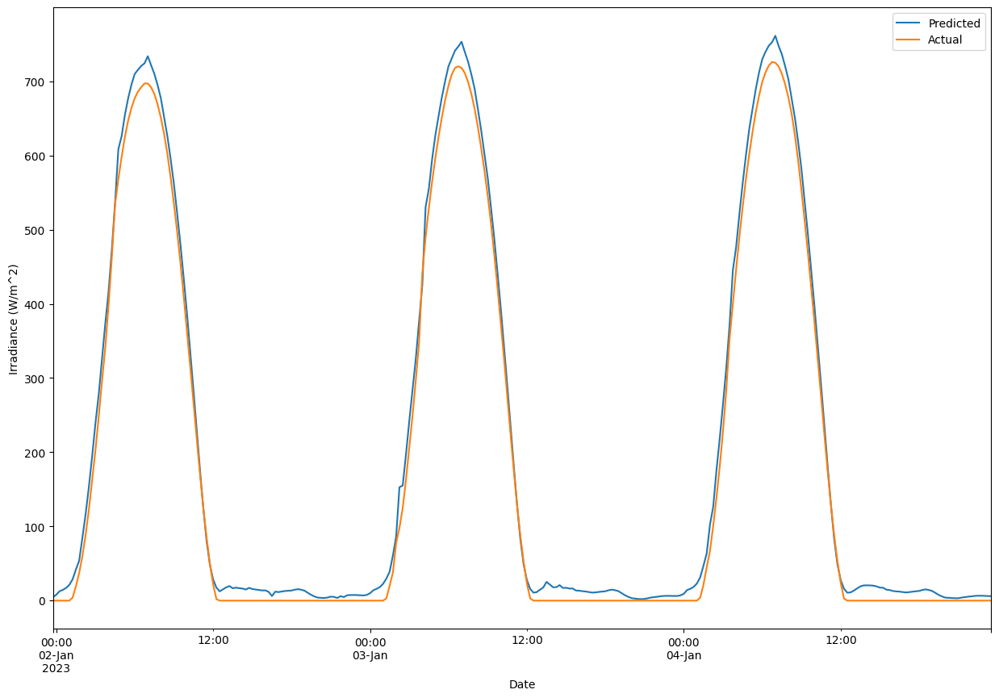

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_1.predict(X_test_kur))
print("r2_Score",r2_score(p3_1.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_kur_8,y_train_kur_8,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 0.0010
Epoch 1: val_loss improved from inf to 0.00046, saving model to /content/drive/MyDrive/Generaliza

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9985079329364034
Root Mean Sqaured Error 12.52216
Mean Absolute Error 9.39847


Text(0, 0.5, 'Irradiance (W/m^2)')

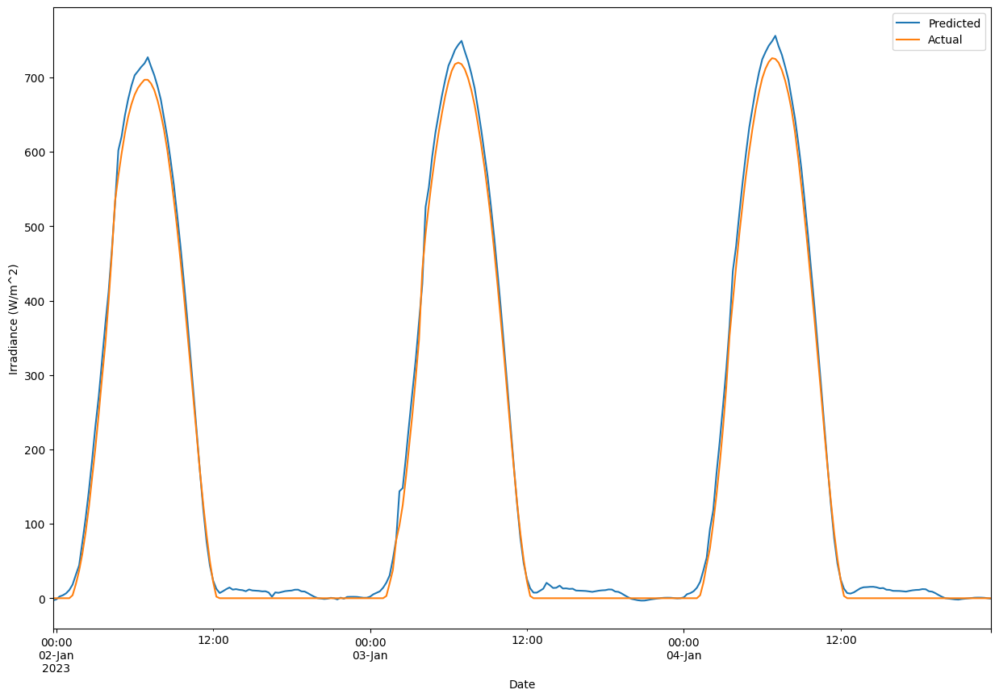

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_1.predict(X_test_kur))
print("r2_Score",r2_score(p3_1.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_kur_12,y_train_kur_12,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
217/219 [============================>.] - ETA: 0s - loss: 7.8253e-04
Epoch 1: val_loss improved from inf to 0.00043, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 10ms/step
r2_Score 0.998832989264724
Root Mean Sqaured Error 10.9164915
Mean Absolute Error 7.9667797


Text(0, 0.5, 'Irradiance (W/m^2)')

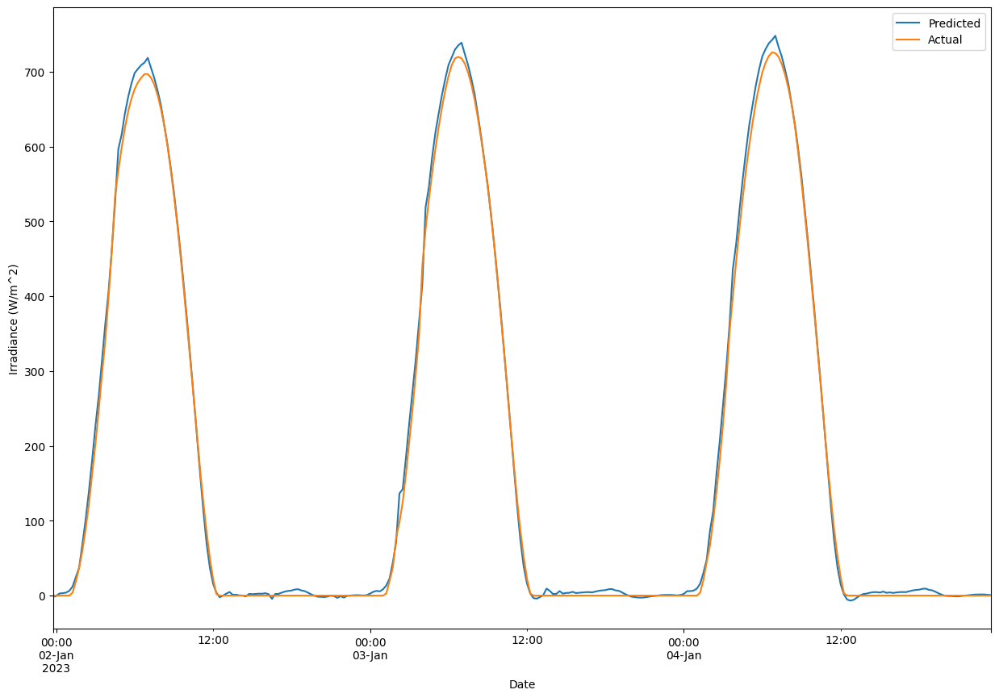

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_1.predict(X_test_kur))
print("r2_Score",r2_score(p3_1.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_kur_4,y_train_kur_4,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S2_4.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0013
Epoch 1: val_loss improved from inf to 0.00070, saving model to /content/drive/MyDrive/Generalizatio

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9988237169305276
Root Mean Sqaured Error 11.143912
Mean Absolute Error 7.5953927


Text(0, 0.5, 'Irradiance (W/m^2)')

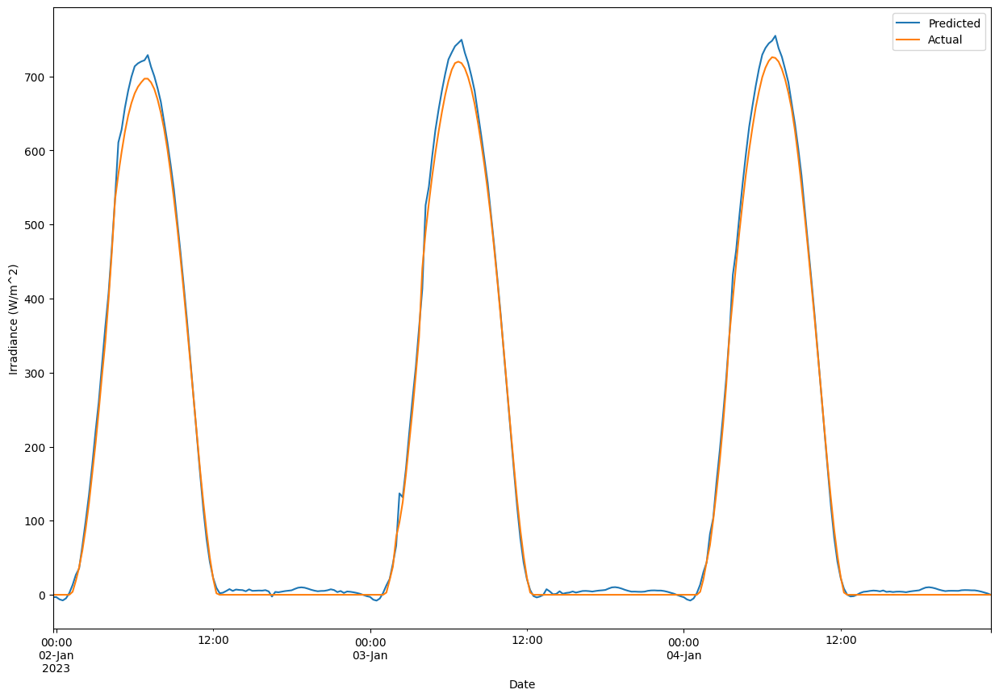

In [ ]:

df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_2.predict(X_test_kur))
print("r2_Score",r2_score(p3_2.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_kur_8,y_train_kur_8,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S2_8.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 0.0012
Epoch 1: val_loss improved from inf to 0.00037, saving model to /content/drive/MyDrive/Generalizat

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9989294665883264
Root Mean Sqaured Error 10.399284
Mean Absolute Error 7.676186


Text(0, 0.5, 'Irradiance (W/m^2)')

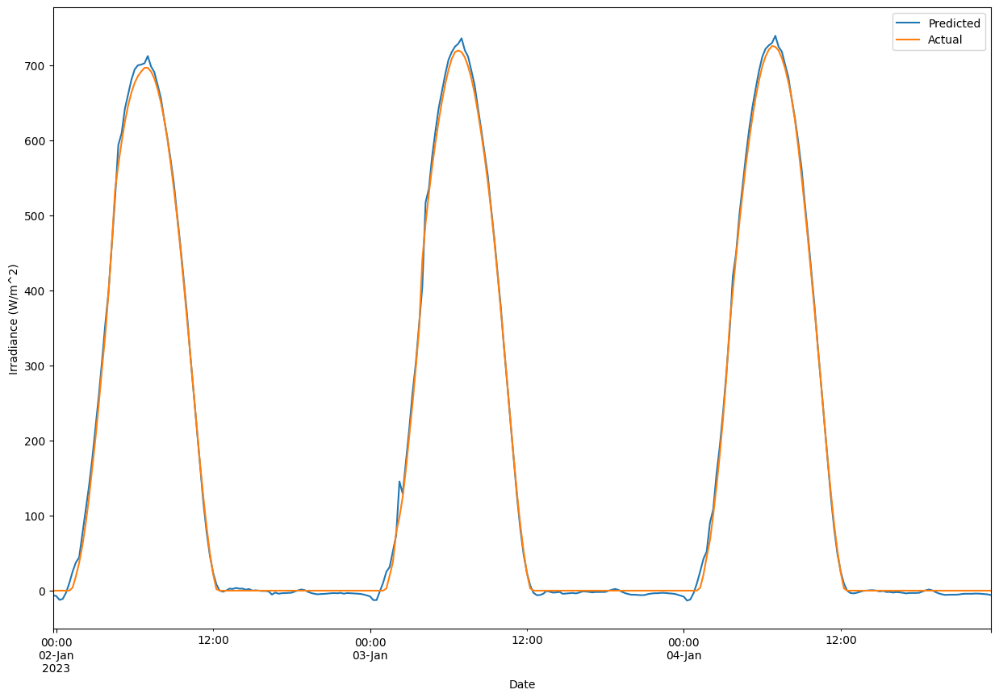

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_2.predict(X_test_kur))
print("r2_Score",r2_score(p3_2.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_kur_12,y_train_kur_12,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S2_12.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 9.1192e-04
Epoch 1: val_loss improved from inf to 0.00033, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9993701944214113
Root Mean Sqaured Error 8.100696
Mean Absolute Error 4.795949


Text(0, 0.5, 'Irradiance (W/m^2)')

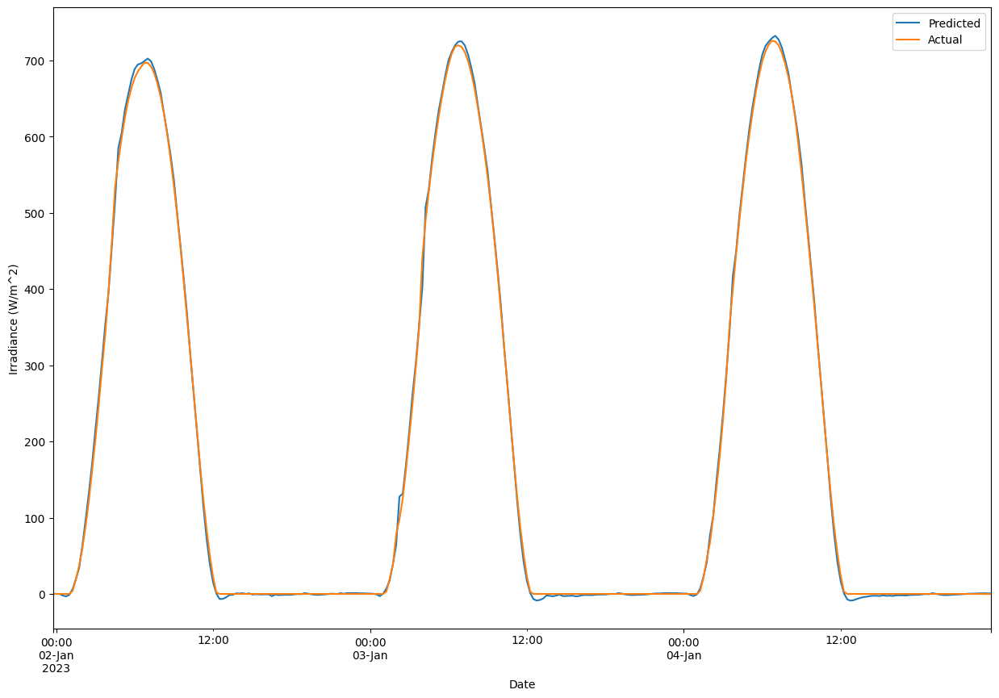

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_2.predict(X_test_kur))
print("r2_Score",r2_score(p3_2.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_kur_4,y_train_kur_4,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9943022118819375
Root Mean Sqaured Error 24.66679
Mean Absolute Error 20.565828


Text(0, 0.5, 'Irradiance (W/m^2)')

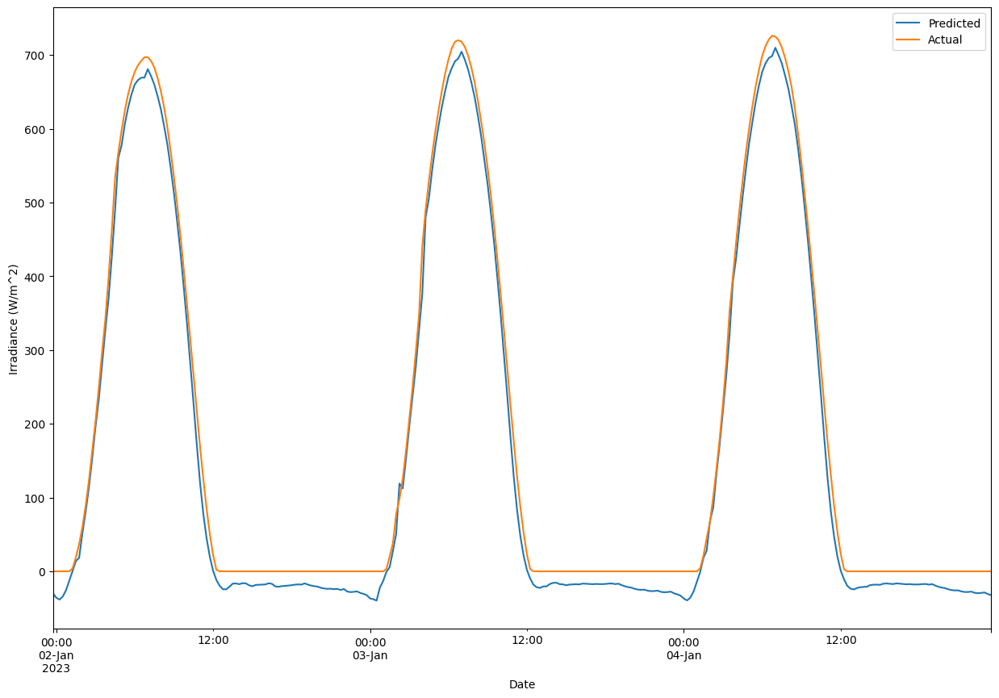

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_3.predict(X_test_kur))
print("r2_Score",r2_score(p3_3.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_kur_8,y_train_kur_8,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9966110083916854
Root Mean Sqaured Error 19.075521
Mean Absolute Error 14.967146


Text(0, 0.5, 'Irradiance (W/m^2)')

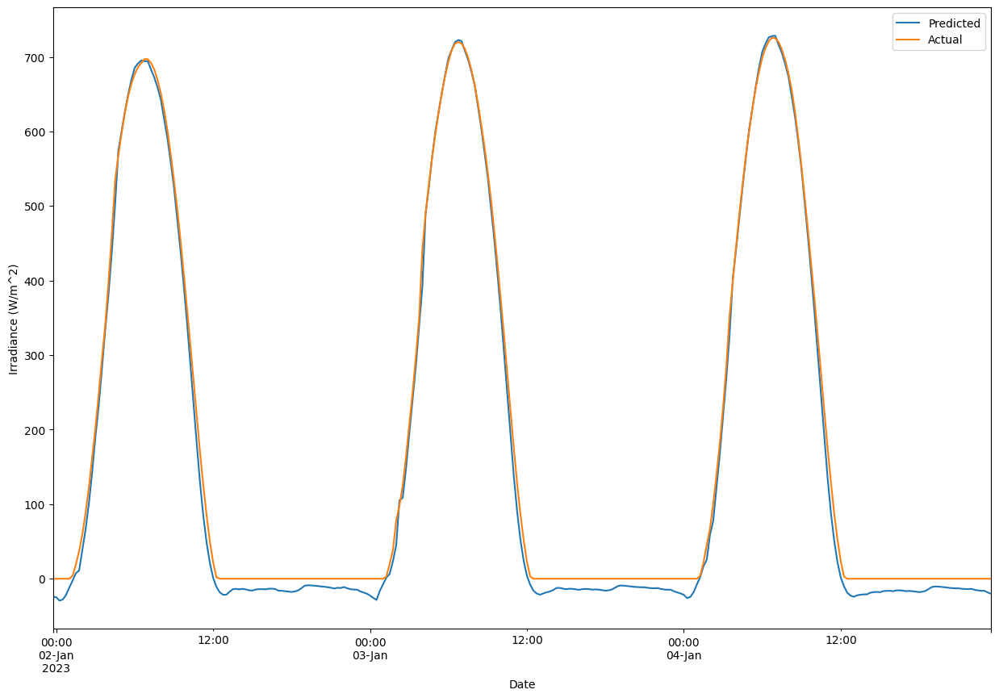

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_3.predict(X_test_kur))
print("r2_Score",r2_score(p3_3.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_kur_12,y_train_kur_12,X_test_kur,y_test_kur,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Kurnool/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 9ms/step
r2_Score 0.998802458474958
Root Mean Sqaured Error 11.143214
Mean Absolute Error 8.392733


Text(0, 0.5, 'Irradiance (W/m^2)')

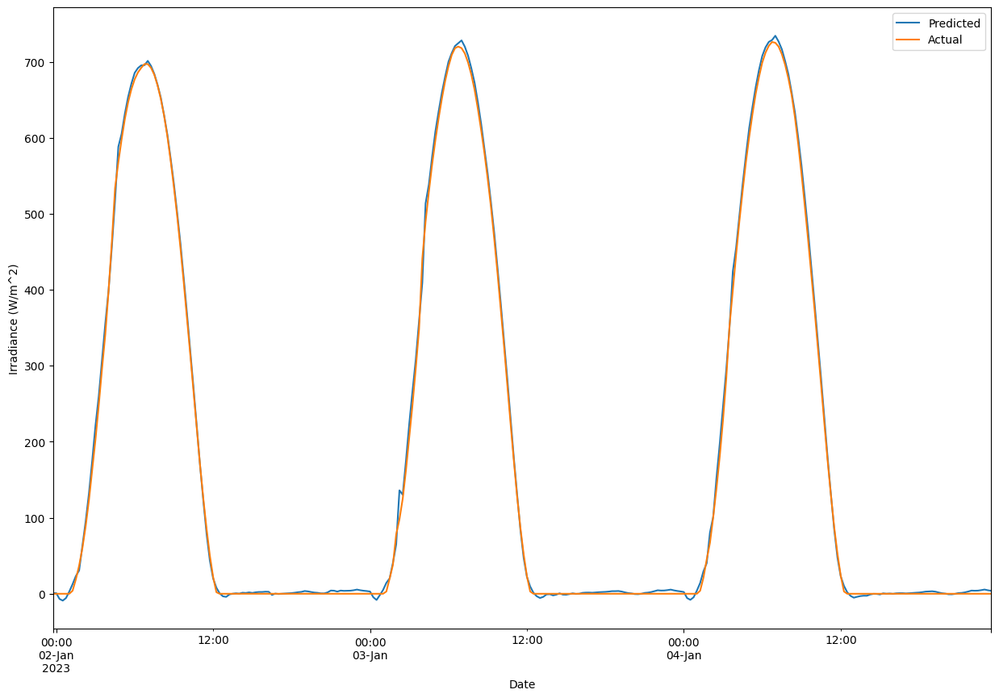

In [ ]:
df_test_date_kur['Actual']=scaler_y_kur.inverse_transform(y_test_kur)
df_test_date_kur['Predicted']=scaler_y_kur.inverse_transform(p3_3.predict(X_test_kur))
print("r2_Score",r2_score(p3_3.predict(X_test_kur),y_test_kur))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_kur['Actual'],df_test_date_kur['Predicted']))
df_test_date_kur.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# man

## Bi-LSTM

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM

class SolarPowerForecastingModel:

    def __init__(self, n_timesteps, n_features, n_outputs,Model=None):
        self.n_timesteps = n_timesteps
        self.n_features = n_features
        self.n_outputs = n_outputs
        self.model = Model
        
    def build_model(self):
        self.model = Sequential()
        self.model.add(Bidirectional(LSTM(units=640,return_sequences=True,input_shape=(self.n_timesteps, self.n_features))))
        self.model.add(Bidirectional(LSTM(units=64)))
        self.model.add(Dense(self.n_outputs))
        self.model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['mae'])
        return self.model
    def train_model(self, X_train, y_train, X_test, y_test, epochs, batch_size):
        mc = tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/Bi-LSTM/Best_base.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=2, mode='min', restore_best_weights=True)
        self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=[early_stopping,mc])

    def load_trained_model(self, path):
        self.model = load_model(path)

    def save_trained_model(self, path):
        self.model.save(path)
    
    def predict(self, X):
        return self.model.predict(X)


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_man_4, y_train_man_4, X_test_man, y_test_man, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
92/92 [==============================] - ETA: 0s - loss: 0.0337 - mae: 0.0982
Epoch 1: val_loss improved from inf to 0.00097, saving model to /content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/Bi-LSTM/Best_base.h5
92/92 [==============================] - 27s 136ms/step - loss: 0.0337 - mae: 0.0982 - val_loss: 9.6583e-04 - val_mae: 0.0239
Epoch 2/250
92/92 [==============================] - ETA: 0s - loss: 0.0028 - mae: 0.0332
Epoch 2: val_loss improved from 0.00097 to 0.00093, saving model to /content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/Bi-LSTM/Best_base.h5
92/92 [==============================] - 11s 125ms/step - loss: 0.0028 - mae: 0.0332 - val_loss: 9.2770e-04 - val_mae: 0.0251
Epoch 3/250
92/92 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.0272
Epoch 3: val_loss did not improve from 0.00093
92/92 [==============================] - 11s 117ms/step - loss: 0.0021 - mae: 0.0272 - val_loss: 0.0011 - val_mae: 0.

181/181 [==============================] - 5s 19ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

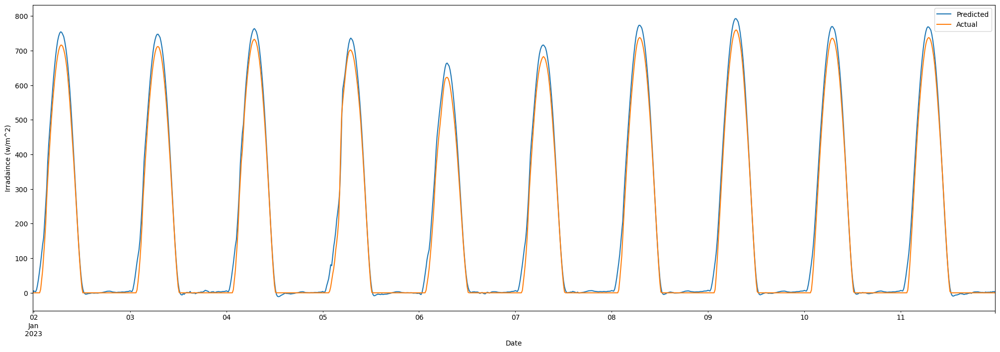

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(best_model.predict(X_test_man))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))

181/181 [==============================] - 3s 19ms/step
r2_Score 0.9910869588603824
Root Mean Sqaured Error 28.668207
Mean Absolute Error 19.187489


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_man_8, y_train_man_8, X_test_man, y_test_man, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0280 - mae: 0.0738
Epoch 1: val_loss improved from inf to 0.00108, saving model to /content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/Bi-LSTM/Best_base.h5
165/165 [==============================] - 33s 150ms/step - loss: 0.0280 - mae: 0.0738 - val_loss: 0.0011 - val_mae: 0.0233
Epoch 2/250
165/165 [==============================] - ETA: 0s - loss: 0.0022 - mae: 0.0277
Epoch 2: val_loss improved from 0.00108 to 0.00096, saving model to /content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/Bi-LSTM/Best_base.h5
165/165 [==============================] - 23s 137ms/step - loss: 0.0022 - mae: 0.0277 - val_loss: 9.6181e-04 - val_mae: 0.0249
Epoch 3/250
165/165 [==============================] - ETA: 0s - loss: 0.0017 - mae: 0.0240
Epoch 3: val_loss did not improve from 0.00096
165/165 [==============================] - 23s 137ms/step - loss: 0.0017 - mae: 0.0240 - val_loss: 0.0016 - val

181/181 [==============================] - 6s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

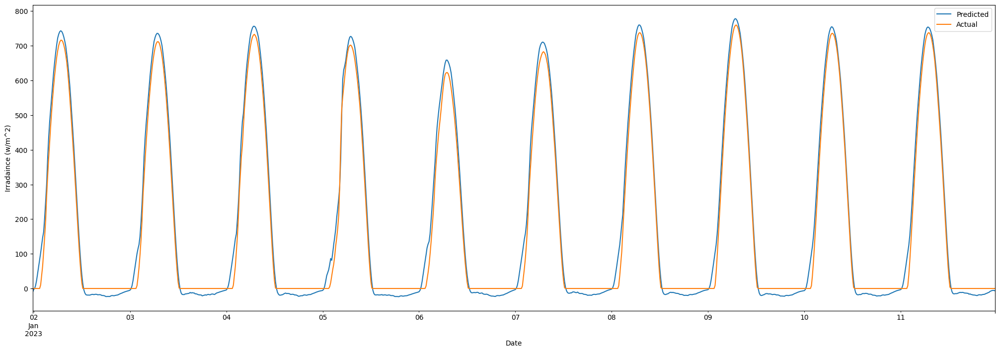

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(best_model.predict(X_test_man))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))

181/181 [==============================] - 3s 19ms/step
r2_Score 0.9898497766292537
Root Mean Sqaured Error 30.26097
Mean Absolute Error 24.767591


In [ ]:
best_model = SolarPowerForecastingModel(n_timesteps, n_features, n_outputs)
best_model.build_model()
best_model.train_model(X_train_man_12, y_train_man_12, X_test_man, y_test_man, epochs=250, batch_size=128)

# Print the model summary
best_model.model.summary()

Epoch 1/250
219/219 [==============================] - ETA: 0s - loss: 0.0209 - mae: 0.0612
Epoch 1: val_loss improved from inf to 0.00135, saving model to /content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/Bi-LSTM/Best_base.h5
219/219 [==============================] - 40s 146ms/step - loss: 0.0209 - mae: 0.0612 - val_loss: 0.0013 - val_mae: 0.0288
Epoch 2/250
219/219 [==============================] - ETA: 0s - loss: 0.0017 - mae: 0.0242
Epoch 2: val_loss did not improve from 0.00135
219/219 [==============================] - 29s 132ms/step - loss: 0.0017 - mae: 0.0242 - val_loss: 0.0020 - val_mae: 0.0344
Epoch 3/250
219/219 [==============================] - ETA: 0s - loss: 0.0013 - mae: 0.0208
Epoch 3: val_loss improved from 0.00135 to 0.00047, saving model to /content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/Bi-LSTM/Best_base.h5
219/219 [==============================] - 30s 137ms/step - loss: 0.0013 - mae: 0.0208 - val_loss: 4.6788e-04 - val

181/181 [==============================] - 4s 18ms/step


Text(0, 0.5, 'Irradaince (w/m^2)')

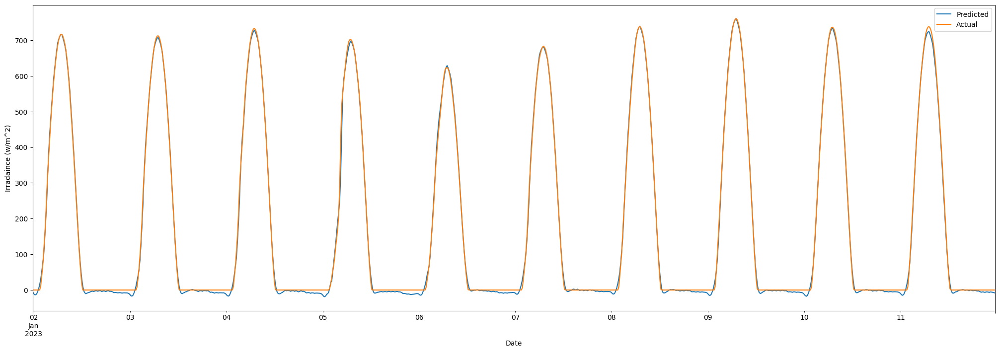

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(best_model.predict(X_test_man))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*10].plot(figsize=(25,8))
plt.ylabel('Irradaince (w/m^2)')

In [ ]:
print("r2_Score",r2_score(best_model.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))

181/181 [==============================] - 3s 18ms/step
r2_Score 0.997749292730737
Root Mean Sqaured Error 13.814501
Mean Absolute Error 8.480114


## Persistance model

In [ ]:
man

,PeriodStart,AirTemp,Azimuth,CloudOpacity,PrecipitableWater,RelativeHumidity,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,sin_hour,cos_hour,Ghi
0,2020-12-31 00:00:00+00:00,8.7,-107,0.0,13.6,65.5,961.0,59,3.0,111,...,0,0,0,0,0,0,1,0.000000,1.000000,0
1,2020-12-31 00:15:00+00:00,8.6,-108,0.0,13.7,65.3,961.0,60,3.0,108,...,0,0,0,0,0,0,1,0.000000,1.000000,0
2,2020-12-31 00:30:00+00:00,8.6,-109,0.0,13.7,65.2,961.0,60,3.0,104,...,0,0,0,0,0,0,1,0.000000,1.000000,0
3,2020-12-31 00:45:00+00:00,8.5,-111,0.0,13.8,65.1,961.0,61,3.0,101,...,0,0,0,0,0,0,1,0.000000,1.000000,0
4,2020-12-31 01:00:00+00:00,8.6,-112,0.0,13.9,64.9,961.1,62,3.0,98,...,0,0,0,0,0,0,1,0.258819,0.965926,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76027,2023-03-02 22:45:00+00:00,19.4,-82,0.0,20.1,63.0,962.1,80,2.3,125,...,0,0,0,0,0,0,0,-0.500000,0.866025,0
76028,2023-03-02 23:00:00+00:00,19.4,-84,0.0,20.0,63.5,962.2,81,2.3,121,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76029,2023-03-02 23:15:00+00:00,19.3,-86,0.0,20.0,64.3,962.2,83,2.4,118,...,0,0,0,0,0,0,0,-0.258819,0.965926,0
76030,2023-03-02 23:30:00+00:00,19.3,-87,0.0,19.9,65.2,962.3,85,2.4,114,...,0,0,0,0,0,0,0,-0.258819,0.965926,0


In [ ]:
per_start = "2023-01-01T23:45:00Z"
# Convert the 'PeriodStart' column to a datetime format
# man['PeriodStart'] = pd.to_datetime(df_man['PeriodStart'])
df_per_man =pd.DataFrame()
# Split the data into train and test sets based on the date and time range
df_per_man = man[man['PeriodStart'] > test_start][['PeriodStart','Ghi']]

In [ ]:
df_per_man

,PeriodStart,Ghi
70176,2023-01-01 00:00:00+00:00,0
70177,2023-01-01 00:15:00+00:00,0
70178,2023-01-01 00:30:00+00:00,0
70179,2023-01-01 00:45:00+00:00,0
70180,2023-01-01 01:00:00+00:00,0
...,...,...
76027,2023-03-02 22:45:00+00:00,0
76028,2023-03-02 23:00:00+00:00,0
76029,2023-03-02 23:15:00+00:00,0
76030,2023-03-02 23:30:00+00:00,0


In [ ]:
import pandas as pd

def persistence_model(data, look_back=1, horizon=1):
    """
    Implementation of the Persistence model for solar irradiance forecasting.
    
    Parameters:
    data (pd.Series): A pandas Series containing the solar irradiance time series data.
    look_back (int): The number of previous time steps to use for the prediction (default: 1).
    horizon (int): The number of time steps ahead to predict (default: 1).
    
    Returns:
    pd.Series: A pandas Series containing the solar irradiance forecast.
    """
    return data.shift(horizon * look_back)

# Load your solar irradiance time series data into a pandas Series
# data = pd.read_csv('your_data_file.csv', index_col='timestamp', parse_dates=True, squeeze=True)

# Example solar irradiance data
data =df_per_man
# Apply the Persistence model
forecast = persistence_model(data)



In [ ]:
df_per_man['Forecast']=forecast['Ghi']

<Axes: xlabel='PeriodStart'>

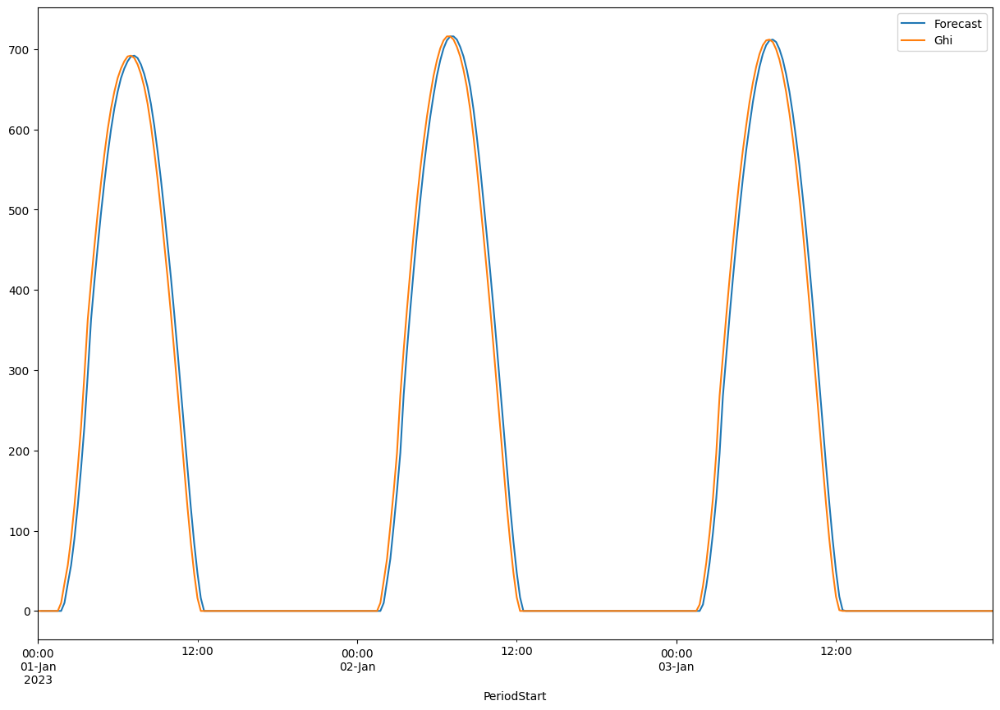

In [ ]:
df_per_man.set_index('PeriodStart')[['Forecast','Ghi']].iloc[0:96*3].plot(figsize=(15,10))

In [ ]:
df_per_man.dropna(inplace=True)

In [ ]:
print("r2_Score",r2_score(df_per_man['Forecast'],df_per_man['Ghi']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_per_man['Forecast'],df_per_man['Ghi'])))
print("Mean Absolute Error",mean_absolute_error(df_per_man['Forecast'],df_per_man['Ghi']))

r2_Score 0.9907592379461603
Root Mean Sqaured Error 28.1711373635973
Mean Absolute Error 16.847822374039282


## Transfer_Learning

### S1

#### 4

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_man_4,y_train_man_4,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S1_4.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
90/92 [============================>.] - ETA: 0s - loss: 9.0487e-04
Epoch 1: val_loss improved from inf to 0.00013, saving model to /content/drive/MyDrive/Generali

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9979847838540605
Root Mean Sqaured Error 13.286504
Mean Absolute Error 8.035355


Text(0, 0.5, 'Irradiance (W/m^2)')

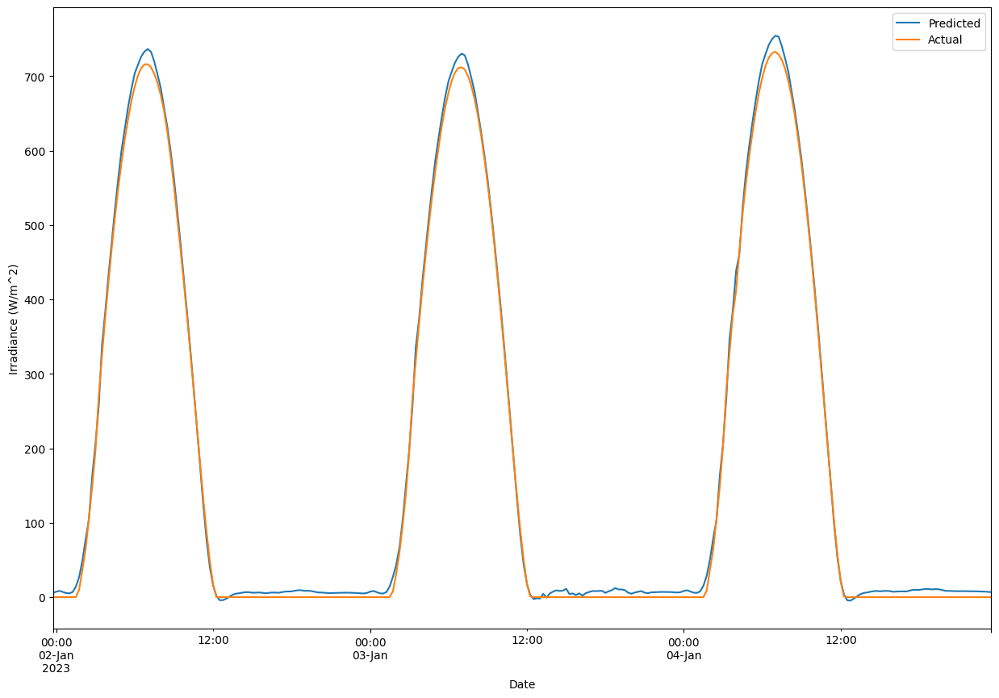

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_1.predict(X_test_man))
print("r2_Score",r2_score(p3_1.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_man_8,y_train_man_8,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S1_8.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
164/165 [============================>.] - ETA: 0s - loss: 8.4525e-04
Epoch 1: val_loss improved from inf to 0.00014, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9974570579394744
Root Mean Sqaured Error 14.748512
Mean Absolute Error 10.613074


Text(0, 0.5, 'Irradiance (W/m^2)')

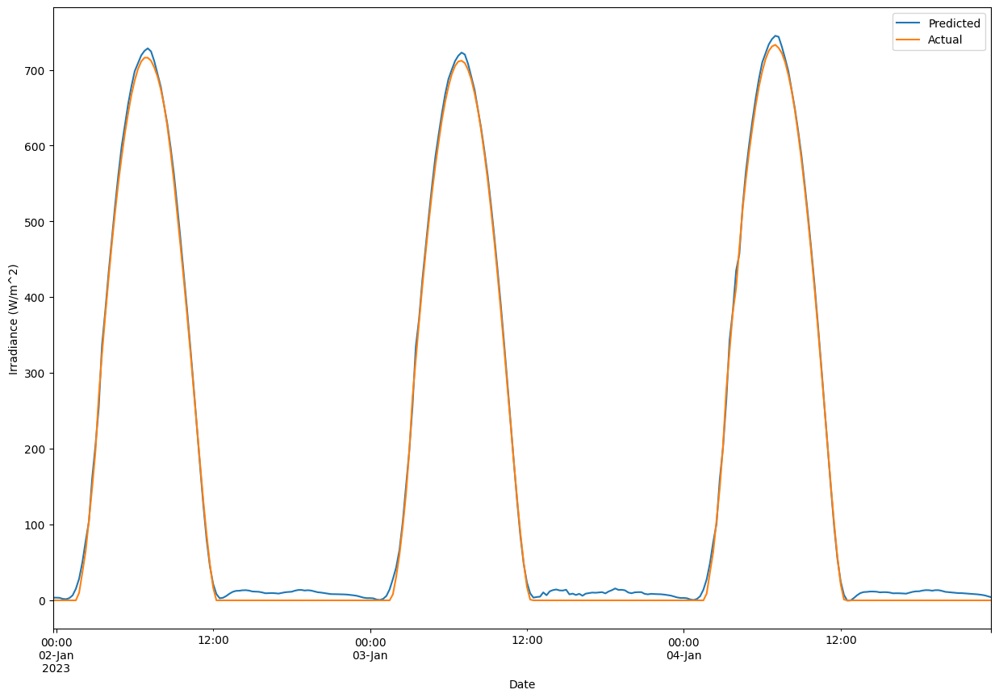

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_1.predict(X_test_man))
print("r2_Score",r2_score(p3_1.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_1=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_1.build_model_strategy_1()
p3_1.compile_model()
p3_1.fit_model(X_train_man_12,y_train_man_12,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S1_12.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 65
Non-trainable params: 1,060,608
_________________________________________________________________
Epoch 1/250
218/219 [============================>.] - ETA: 0s - loss: 7.0636e-04
Epoch 1: val_loss improved from inf to 0.00014, saving model to /content/drive/MyDrive/Genera

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9982771402873573
Root Mean Sqaured Error 12.148939
Mean Absolute Error 6.575832


Text(0, 0.5, 'Irradiance (W/m^2)')

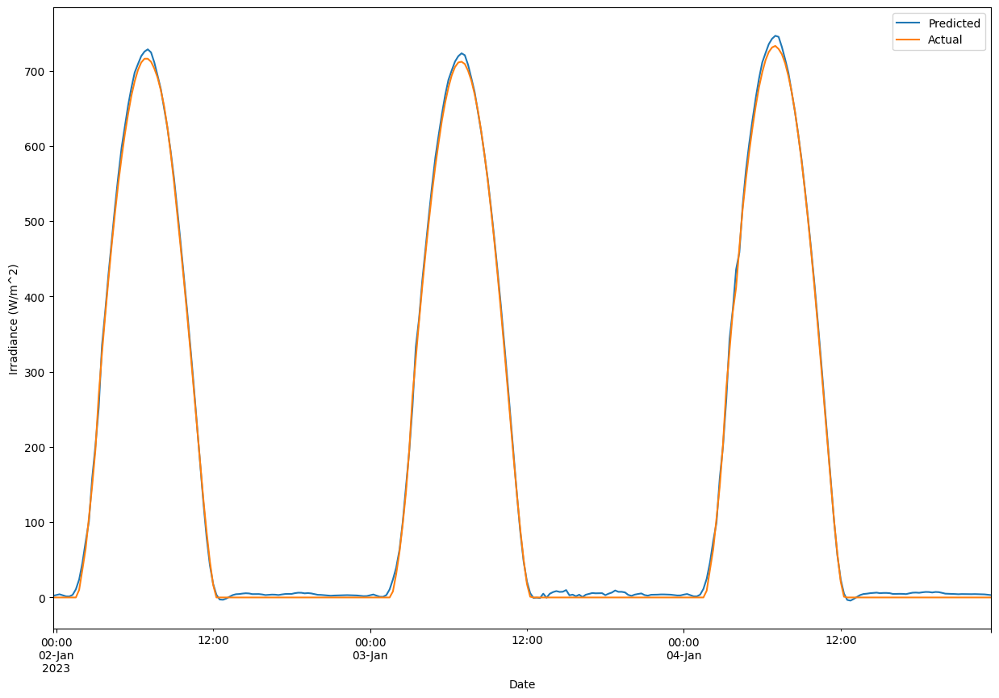

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_1.predict(X_test_man))
print("r2_Score",r2_score(p3_1.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S2

#### 4

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_man_4,y_train_man_4,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S2_4.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
91/92 [============================>.] - ETA: 0s - loss: 0.0013
Epoch 1: val_loss improved from inf to 0.00063, saving model to /content/drive/MyDrive/Generalizatio

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9972085900964295
Root Mean Sqaured Error 15.3212805
Mean Absolute Error 8.546916


Text(0, 0.5, 'Irradiance (W/m^2)')

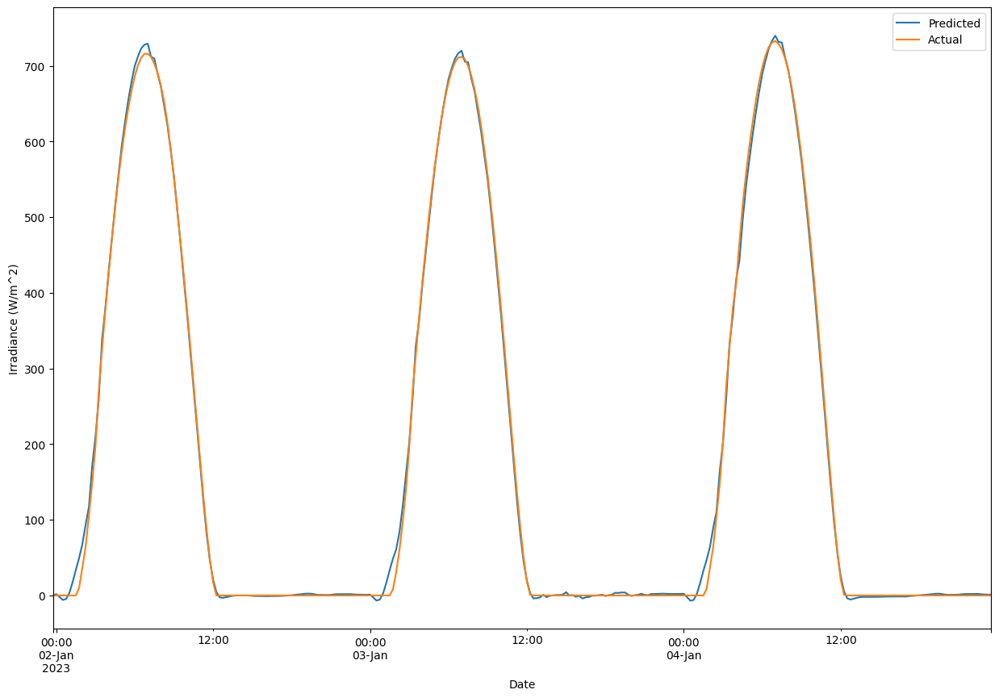

In [ ]:

df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_2.predict(X_test_man))
print("r2_Score",r2_score(p3_2.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_man_8,y_train_man_8,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S2_8.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
165/165 [==============================] - ETA: 0s - loss: 0.0010
Epoch 1: val_loss improved from inf to 0.00027, saving model to /content/drive/MyDrive/Generalizat

181/181 [==============================] - 2s 8ms/step
r2_Score 0.9978644880391873
Root Mean Sqaured Error 13.431337
Mean Absolute Error 7.697149


Text(0, 0.5, 'Irradiance (W/m^2)')

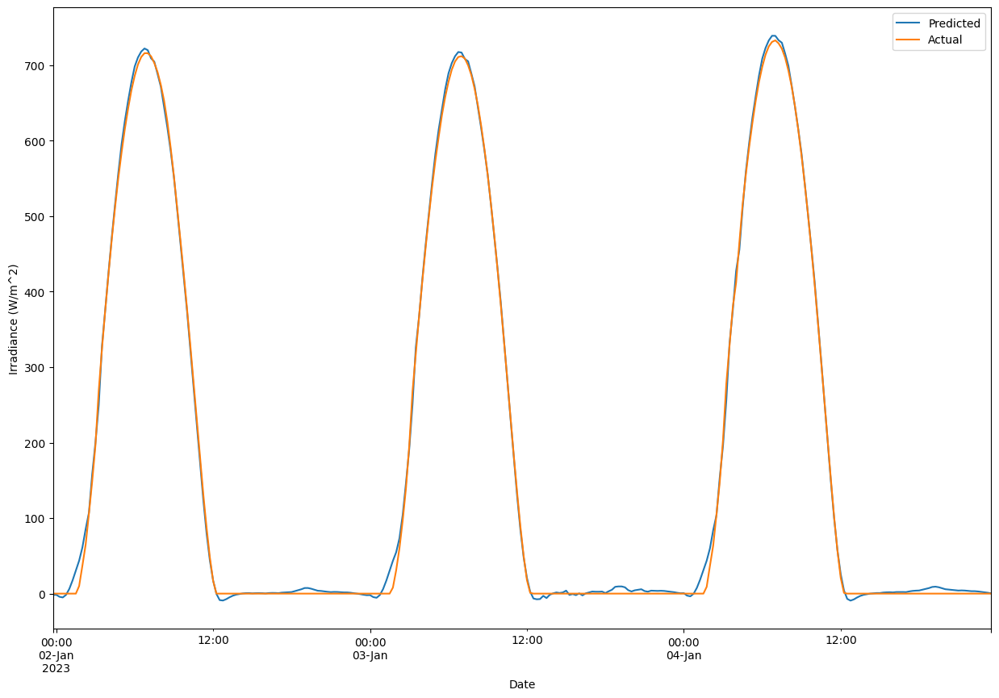

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_2.predict(X_test_man))
print("r2_Score",r2_score(p3_2.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_2=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_2.build_model_strategy_2()
p3_2.compile_model()
p3_2.fit_model(X_train_man_12,y_train_man_12,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S2_12.h5.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 1,060,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/250
218/219 [============================>.] - ETA: 0s - loss: 8.6966e-04
Epoch 1: val_loss improved from inf to 0.00012, saving model to /content/drive/MyDrive/General

181/181 [==============================] - 2s 9ms/step
r2_Score 0.9982927102433736
Root Mean Sqaured Error 12.038219
Mean Absolute Error 6.005061


Text(0, 0.5, 'Irradiance (W/m^2)')

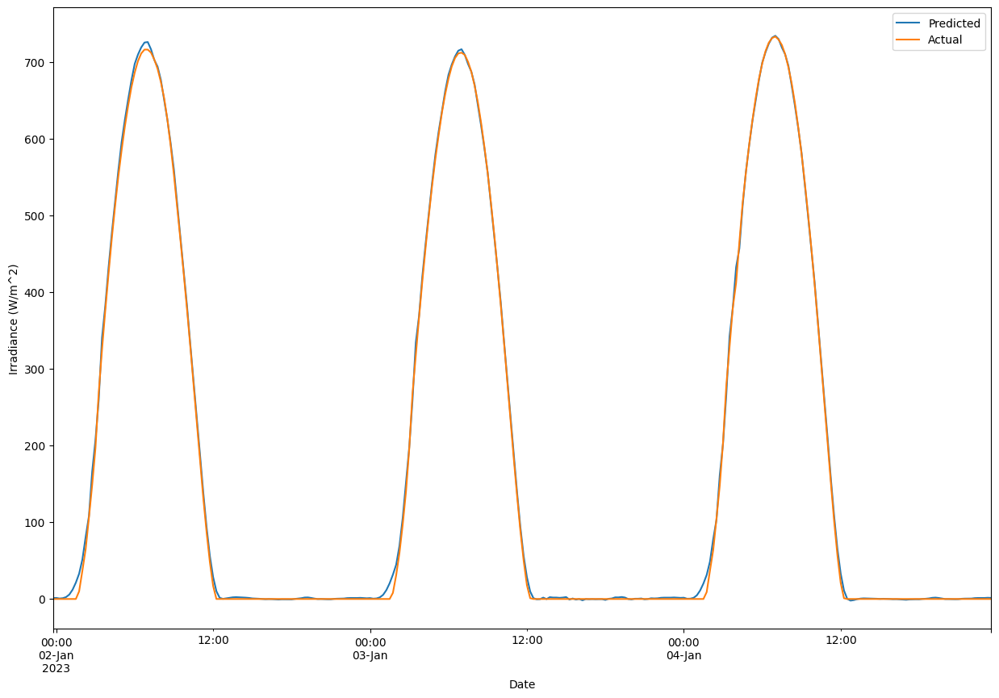

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_2.predict(X_test_man))
print("r2_Score",r2_score(p3_2.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

### S3

#### 4

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_man_4,y_train_man_4,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S3_4.h5')

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_______________________________________________

181/181 [==============================] - 2s 9ms/step
r2_Score 0.995282845161118
Root Mean Sqaured Error 19.796997
Mean Absolute Error 13.33015


Text(0, 0.5, 'Irradiance (W/m^2)')

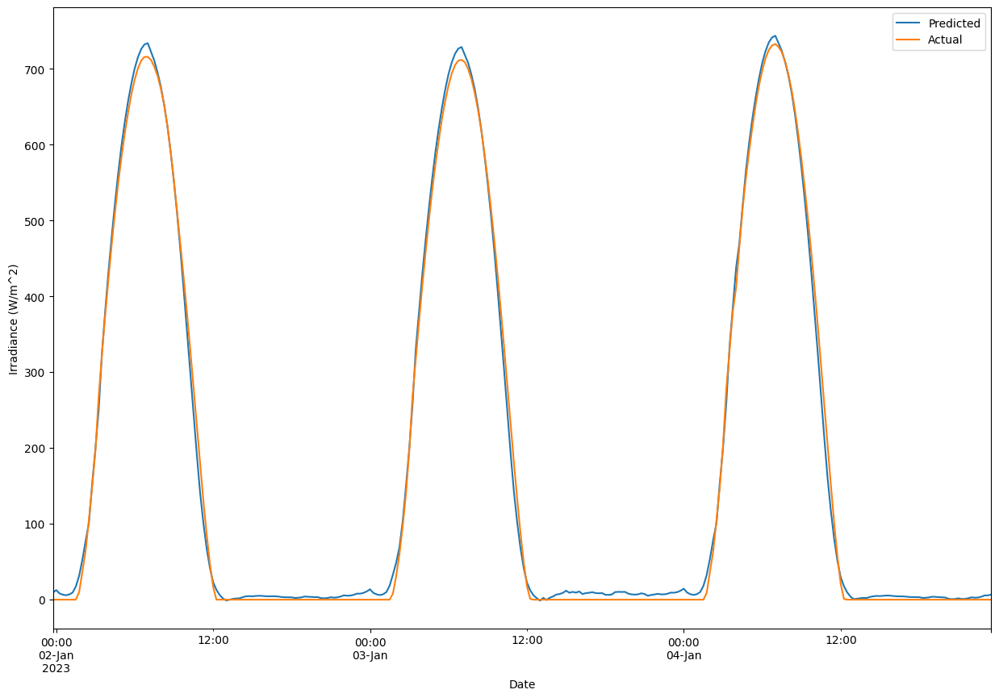

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_3.predict(X_test_man))
print("r2_Score",r2_score(p3_3.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 8

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_man_8,y_train_man_8,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S3_8.h5')

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 2s 10ms/step
r2_Score 0.9928895442745854
Root Mean Sqaured Error 23.822384
Mean Absolute Error 17.843964


Text(0, 0.5, 'Irradiance (W/m^2)')

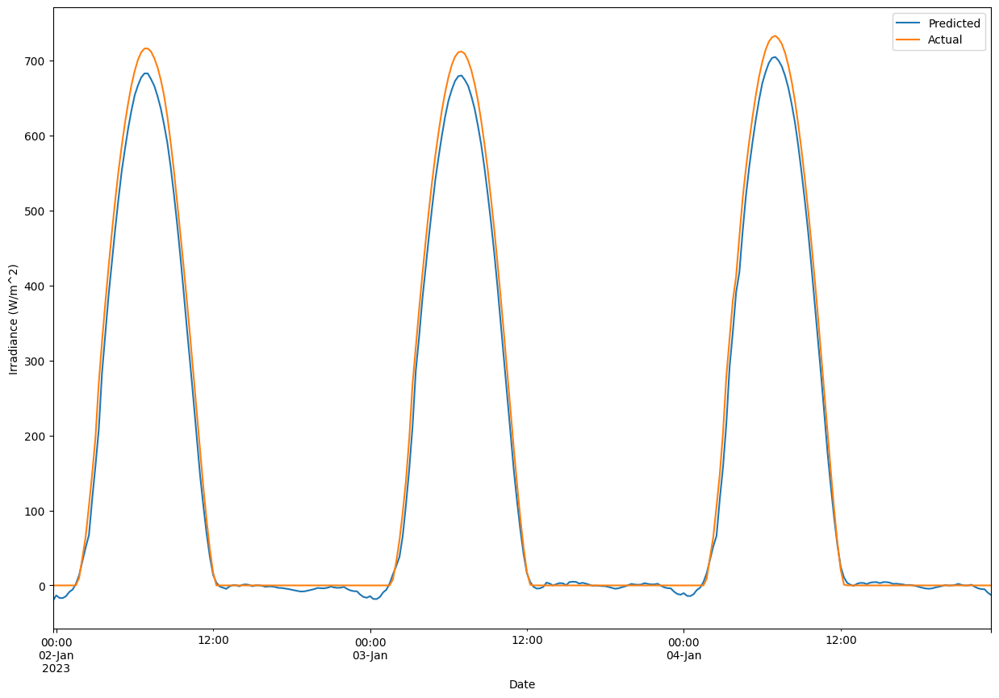

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_3.predict(X_test_man))
print("r2_Score",r2_score(p3_3.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

#### 12

In [ ]:
p3_3=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
p3_3.build_model_strategy_3()
p3_3.compile_model()
p3_3.fit_model(X_train_man_12,y_train_man_12,X_test_man,y_test_man,epochs=250,batch_size=128,checkpoint_path='/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S3_12.h5')

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2_input (Inpu  [(None, 96, 26)]         0         
 tLayer)                                                         
                                                                 
 bidirectional_2 (Bidirectio  (None, 96, 640)          888320    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               172288    
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,060,673
Trainable params: 172,353
Non-trainable params: 888,320
_____________________________________________

181/181 [==============================] - 1s 8ms/step
r2_Score 0.9983772850594779
Root Mean Sqaured Error 11.853688
Mean Absolute Error 5.958852


Text(0, 0.5, 'Irradiance (W/m^2)')

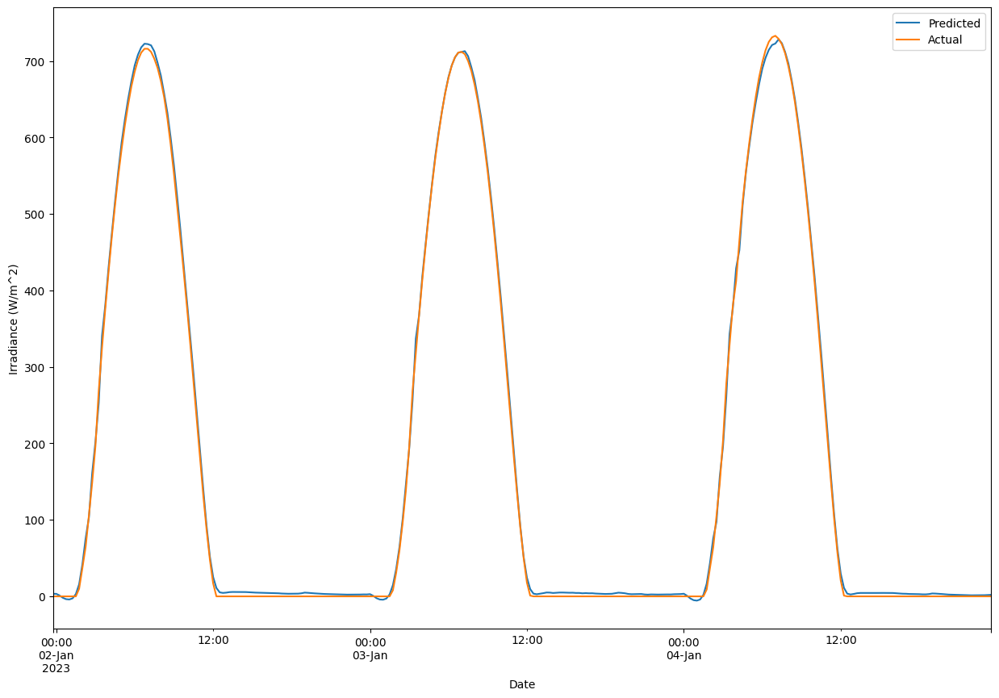

In [ ]:
df_test_date_man['Actual']=scaler_y_man.inverse_transform(y_test_man)
df_test_date_man['Predicted']=scaler_y_man.inverse_transform(p3_3.predict(X_test_man))
print("r2_Score",r2_score(p3_3.predict(X_test_man),y_test_man))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_test_date_man['Actual'],df_test_date_man['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_test_date_man['Actual'],df_test_date_man['Predicted']))
df_test_date_man.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# Models Validation

In [ ]:
kur_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/kur.csv',skiprows=[0,1])
kam_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/kam.csv',skiprows=[0,1])
man_val_ns=pd.read_csv('/content/drive/MyDrive/Generalization_India_Models/NSRDB/man.csv',skiprows=[0,1])

In [ ]:
def combine_date(year, month, day, hour, minute):
    return datetime(year, month, day, hour, minute)


In [ ]:
kur_val_ns['Date'] = kur_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)
kam_val_ns['Date'] = kam_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)
man_val_ns['Date'] = man_val_ns.apply(lambda row: combine_date(row['Year'], row['Month'], row['Day'], row['Hour'], row['Minute']), axis=1)

In [ ]:
cols = kur_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
kur_val_ns = kur_val_ns[cols]
kur_val_ns = kur_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


cols = kam_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
kam_val_ns = kam_val_ns[cols]
kam_val_ns = kam_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


cols = man_val_ns.columns.tolist()
cols = ['Date'] + [col for col in cols if col != 'Date']
man_val_ns = man_val_ns[cols]
man_val_ns = man_val_ns.drop(columns=['Year', 'Month', 'Day', 'Hour', 'Minute'])


In [ ]:
n_timesteps=96
n_features=26
n_outputs=1

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

class SplitData:

    def __init__(self,data,n_timesteps, n_outputs, only_production=False):
        # Read data from csv
        self.df=data
        # self.train=train
        # self.test=test

        self.train = None
        self.test = None

        self.x_train = None
        self.y_train = None

        self.x_test = None
        self.y_test = None

        self.only_production = only_production
        self.lag = n_timesteps

        self.n_features = None
        self.num_of_outputs = n_outputs
        
        self.cols = self.df.columns


    def split_sequences(self, sequences):
        X, y = list(), list()
        for i in range(len(sequences)):
            # find the end of this pattern 
            end_ix = i + self.lag
            # check if we are beyond the dataset
            if end_ix > len(sequences):
                break
            # gather input and output parts of the pattern
            if self.only_production:
                seq_x, seq_y = sequences[i:end_ix, -1], sequences[end_ix:(end_ix+self.num_of_outputs), -1]
            else:
                seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:(end_ix+self.num_of_outputs),-1]
            X.append(seq_x)
            y.append(seq_y)
        return (np.array(X), np.array(y))

    def unique_shapes(self,x, y, lag_, n_features_, num_of_outputs_, only_production):
        uniuqe_shapes = []
        for k in range(len(x)):
            if only_production==True:
                if (x[k].shape == (lag_,)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)
            else:
                if (x[k].shape == (lag_, n_features_)) & (y[k].shape == (num_of_outputs_,)):
                    uniuqe_shapes.append(k)       
        x = x[uniuqe_shapes]
        y = y[uniuqe_shapes]
        x = np.stack(x)
        y = np.stack(y)
        return (x, y)
    def preprocess_data(self):
        # Select non-correlated variables and perform One-Hot-Encoding to Months and Sin-Cos Similarities to Hours
        self.n_features = len(self.cols)

        feature_index = self.df.columns.get_loc('Ghi')

        # Pop the feature from its current position
        df_feature = self.df.pop('Ghi')

        # Insert the feature at the last index
        self.df.insert(len(self.df.columns), 'Ghi', df_feature)

        # Set the training data range

        train_start = "2018-12-31T00:00:00Z"
        train_end = "2019-12-31T23:45:00Z"

        # Convert the 'PeriodStart' column to a datetime format
        self.df['PeriodStart'] = pd.to_datetime(self.df['PeriodStart'])

        # Split the data into train and test sets based on the date and time range
        self.train = self.df[(self.df['PeriodStart'] >= train_start) & (self.df['PeriodStart'] <= train_end)]

        self.x, self.y = self.split_sequences(self.train.values)

        self.x, self.y = self.unique_shapes(self.x, self.y, self.lag, self.n_features, self.num_of_outputs, self.only_production)


        return (self.x[:, :, 1:],self.y)

In [ ]:
sd3=SplitData(kur_val,n_timesteps,n_outputs,only_production=False)
kur_val_x,kur_val_y=sd3.preprocess_data()

df_kur_val=kur_val.copy()

df_date_kur_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_kur_val['PeriodStart'] = pd.to_datetime(df_kur_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_kur_val['Date'] = df_kur_val[(df_kur_val['PeriodStart'] >= train_start) & (df_kur_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_kur_val=df_date_kur_val.iloc[-len(kur_val_x):]

<ipython-input-20-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
sd3=SplitData(kam_val,n_timesteps,n_outputs,only_production=False)
kam_val_x,kam_val_y=sd3.preprocess_data()

df_kam_val=kam_val.copy()

df_date_kam_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_kam_val['PeriodStart'] = pd.to_datetime(df_kam_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_kam_val['Date'] = df_kam_val[(df_kam_val['PeriodStart'] >= train_start) & (df_kam_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_kam_val=df_date_kam_val.iloc[-len(kam_val_x):]

<ipython-input-20-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
sd3=SplitData(man_val,n_timesteps,n_outputs,only_production=False)
man_val_x,man_val_y=sd3.preprocess_data()

df_man_val=man_val.copy()

df_date_man_val=pd.DataFrame()

train_start = "2018-12-31T00:00:00Z"
train_end = "2019-12-31T23:45:00Z"


# Convert the 'PeriodStart' column to a datetime format
df_man_val['PeriodStart'] = pd.to_datetime(df_man_val['PeriodStart'])

# Split the data into train and test sets based on the date and time range
df_date_man_val['Date'] = df_man_val[(df_man_val['PeriodStart'] >= train_start) & (df_man_val['PeriodStart'] <= train_end)]['PeriodStart']

df_date_man_val=df_date_man_val.iloc[-len(man_val_x):]

<ipython-input-20-8a4883104105>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return (np.array(X), np.array(y))


In [ ]:
kur_val_x = kur_val_x.astype('float32')
kur_val_y = kur_val_y.astype('float32')


kam_val_x = kam_val_x.astype('float32')
kam_val_y = kam_val_y.astype('float32')


man_val_x = man_val_x.astype('float32')
man_val_y = man_val_y.astype('float32')


In [ ]:
# Flatten X_train and X_test to 2 dimensions
kur_val_x_flat = kur_val_x.reshape(kur_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
kur_val_x_scaled= scaler.fit_transform(kur_val_x_flat)


# Reshape back to original shape
kur_val_x= kur_val_x_scaled.reshape(kur_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
kur_val_y = scaler_y.fit_transform(kur_val_y)


In [ ]:
# Flatten X_train and X_test to 2 dimensions
kam_val_x_flat = kam_val_x.reshape(kam_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
kam_val_x_scaled= scaler.fit_transform(kam_val_x_flat)


# Reshape back to original shape
kam_val_x= kam_val_x_scaled.reshape(kam_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
kam_val_y = scaler_y.fit_transform(kam_val_y)


In [ ]:
# Flatten X_train and X_test to 2 dimensions
man_val_x_flat = man_val_x.reshape(man_val_x.shape[0], -1)

# Apply MinMaxScaler to flattened arrays
scaler = MinMaxScaler(feature_range=(0,1))
man_val_x_scaled= scaler.fit_transform(man_val_x_flat)


# Reshape back to original shape
man_val_x= man_val_x_scaled.reshape(man_val_x.shape)



scaler_y = MinMaxScaler(feature_range=(0,1))
man_val_y = scaler_y.fit_transform(man_val_y)



# KUR

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S1_4.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9928377388271866
Root Mean Sqaured Error 25.7053
Mean Absolute Error 16.268347


Text(0, 0.5, 'Irradiance (W/m^2)')

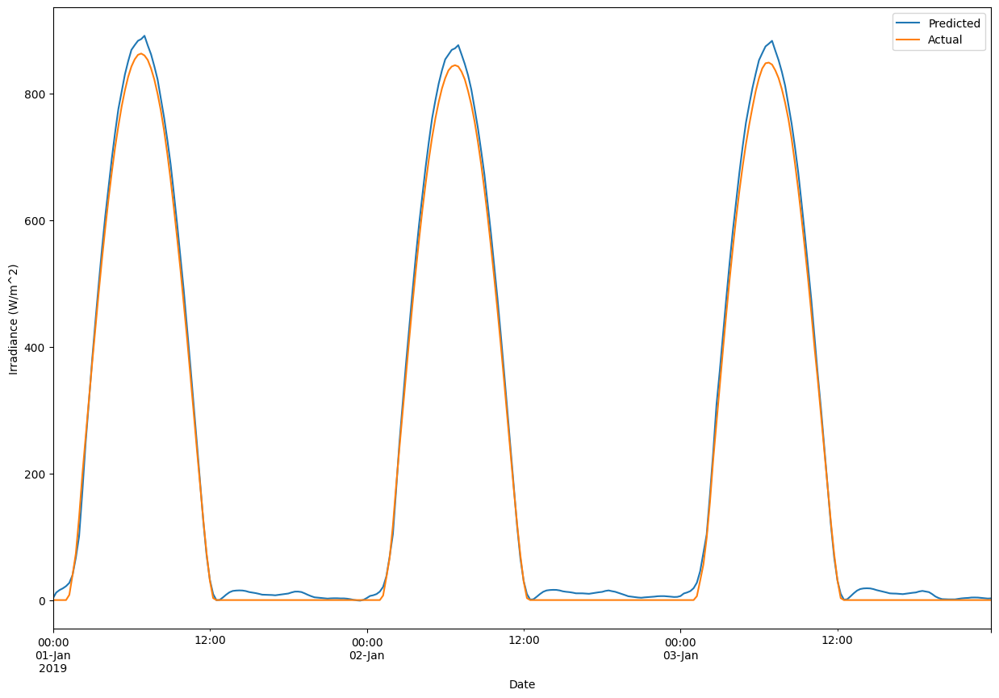

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(kur_val_x))
print("r2_Score",r2_score(s1_4.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

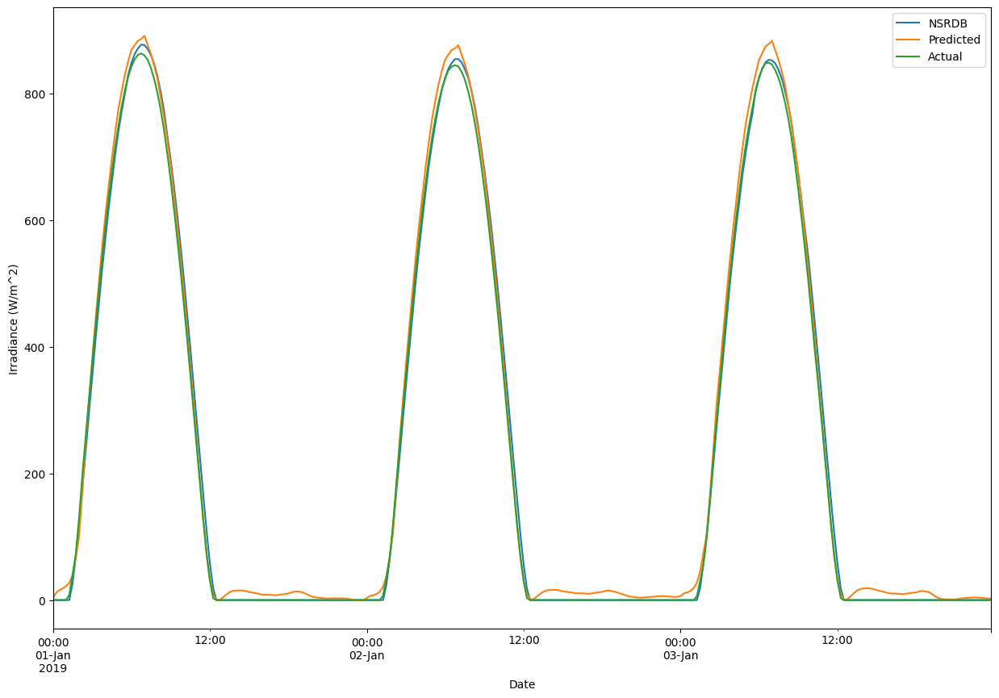

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.9927847123144297
Root Mean Sqaured Error 25.70529794423878
Mean Absolute Error 16.26834662633832


Text(0, 0.5, 'Irradiance (W/m^2)')

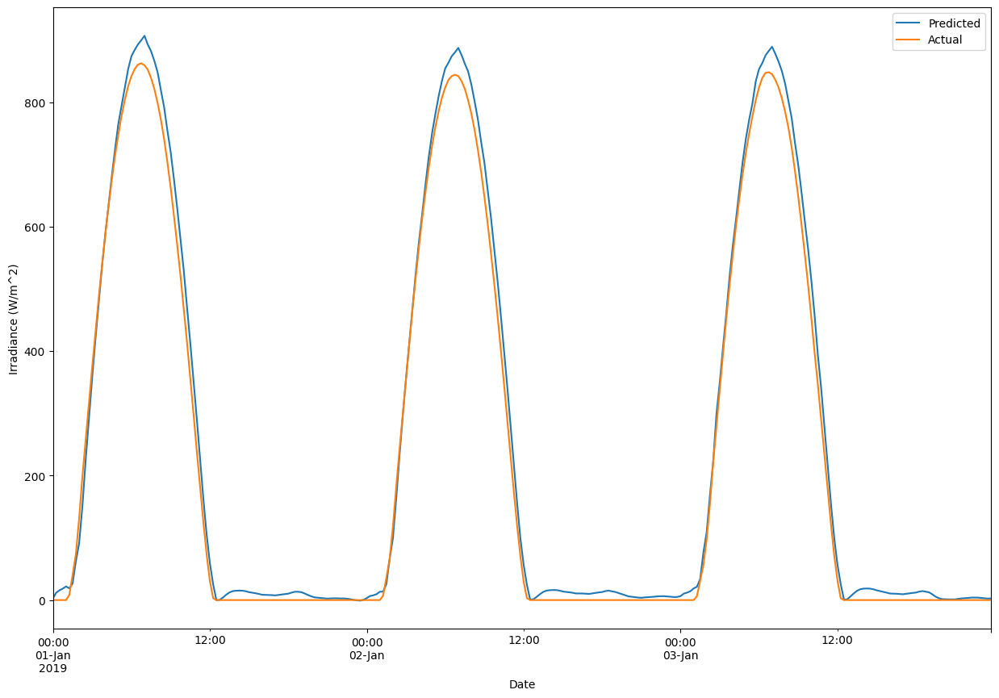

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

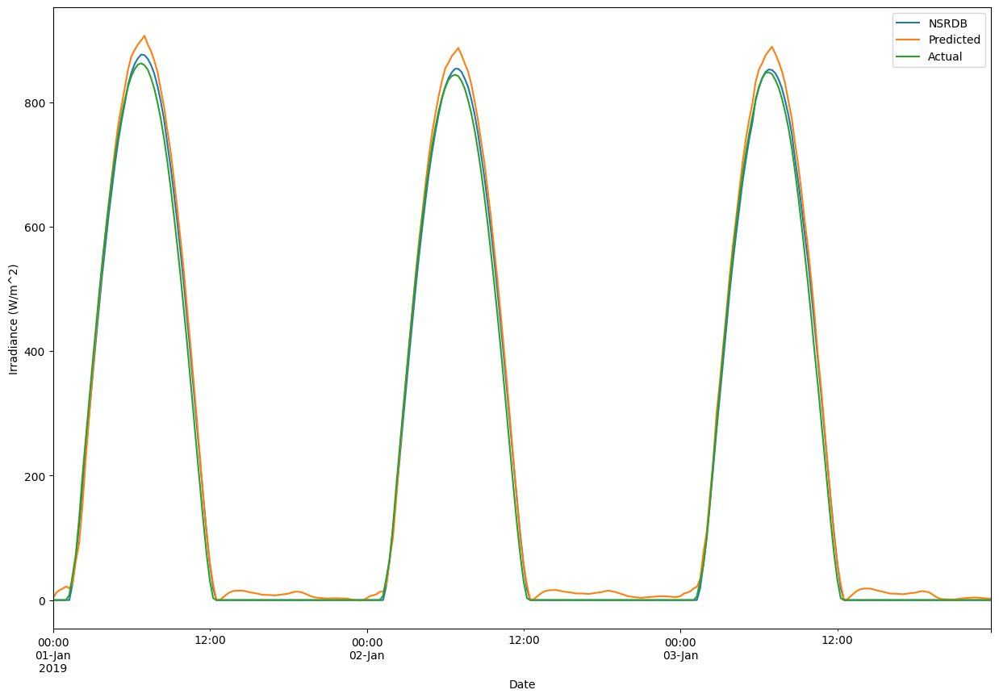

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S1_8.h5')

1095/1095 [==============================] - 9s 9ms/step
r2_Score 0.9941108322493016
Root Mean Sqaured Error 23.190796
Mean Absolute Error 13.1315565


Text(0, 0.5, 'Irradiance (W/m^2)')

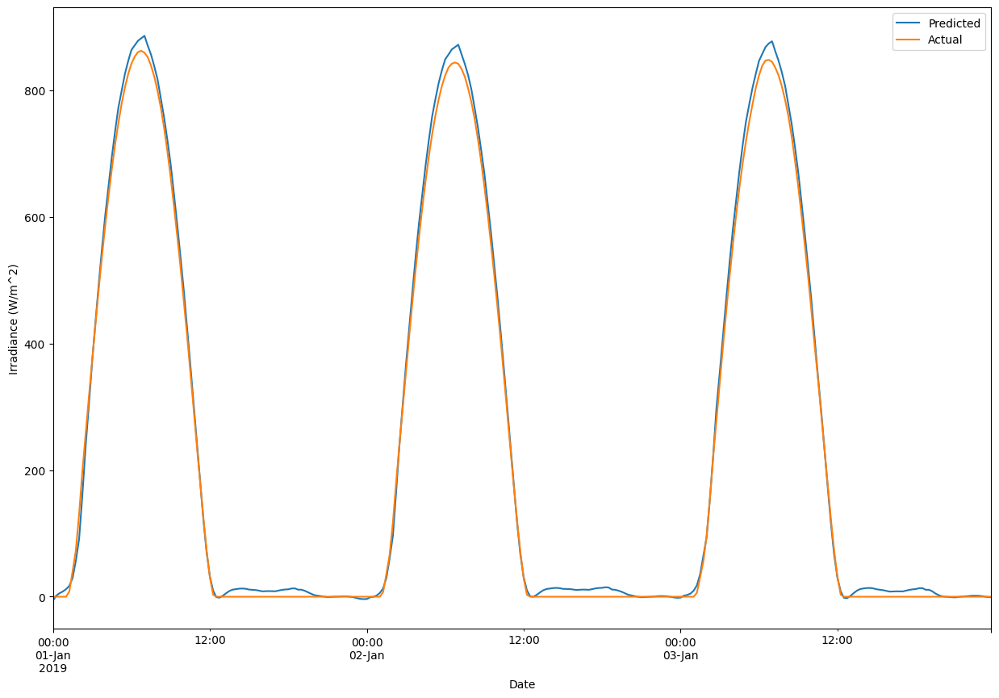

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(kur_val_x))
print("r2_Score",r2_score(s1_4.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

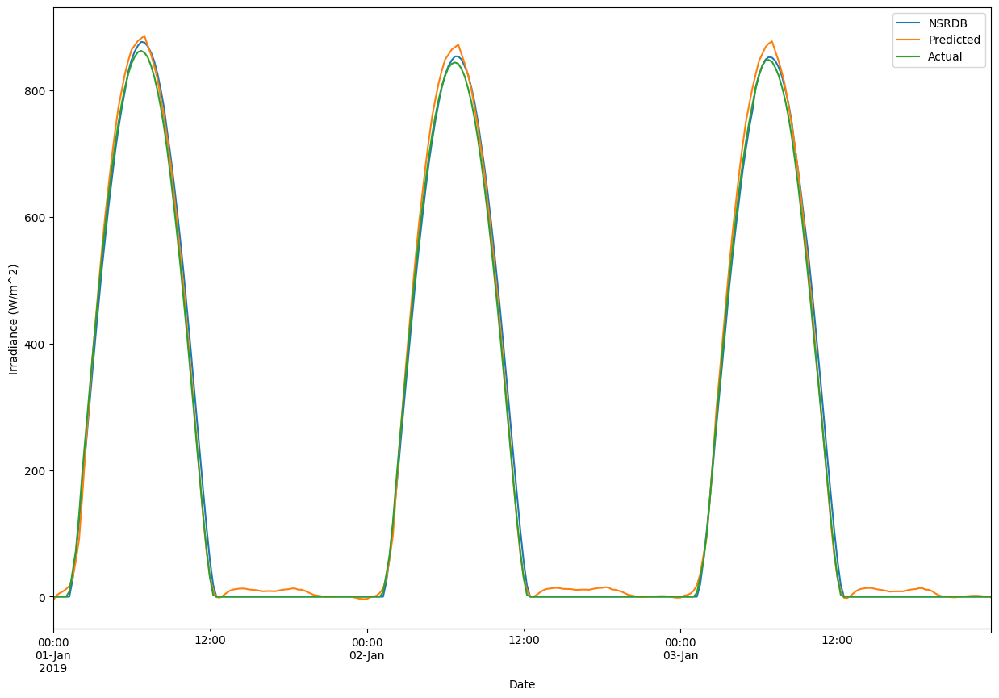

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.9941272740461965
Root Mean Sqaured Error 23.19079750473932
Mean Absolute Error 13.131557387845659


Text(0, 0.5, 'Irradiance (W/m^2)')

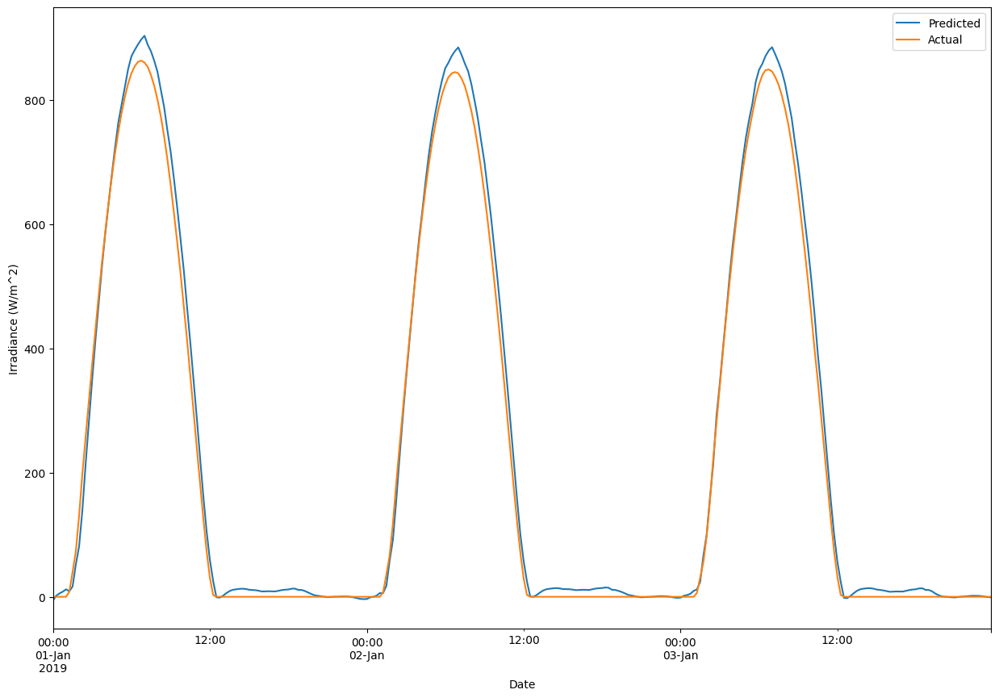

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

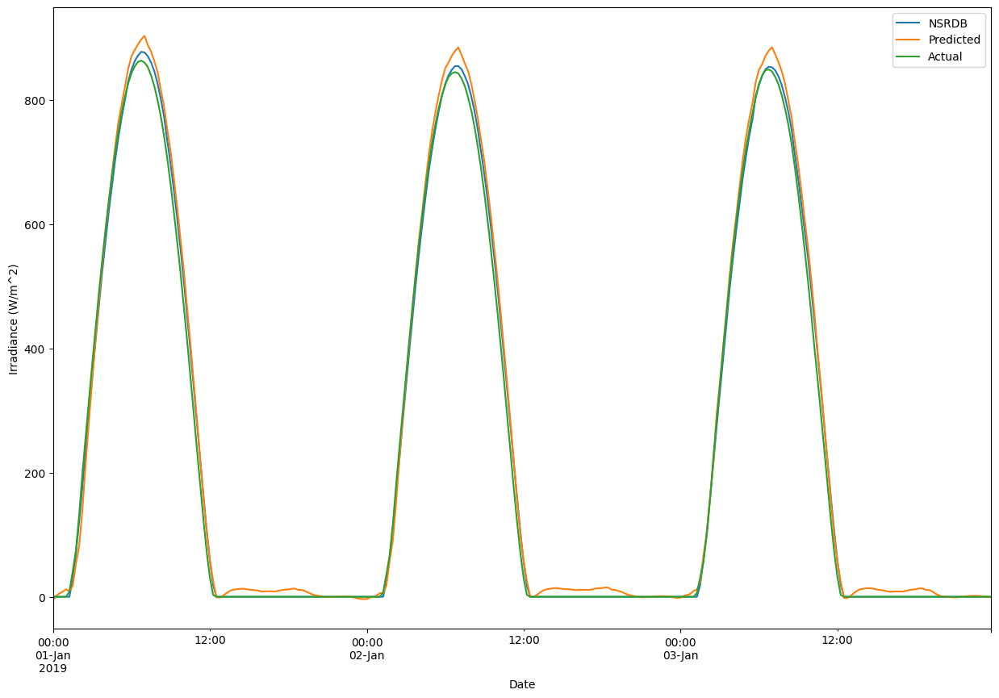

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S1_12.h5')

1095/1095 [==============================] - 9s 9ms/step
r2_Score 0.9937832236135492
Root Mean Sqaured Error 23.584845
Mean Absolute Error 13.1544075


Text(0, 0.5, 'Irradiance (W/m^2)')

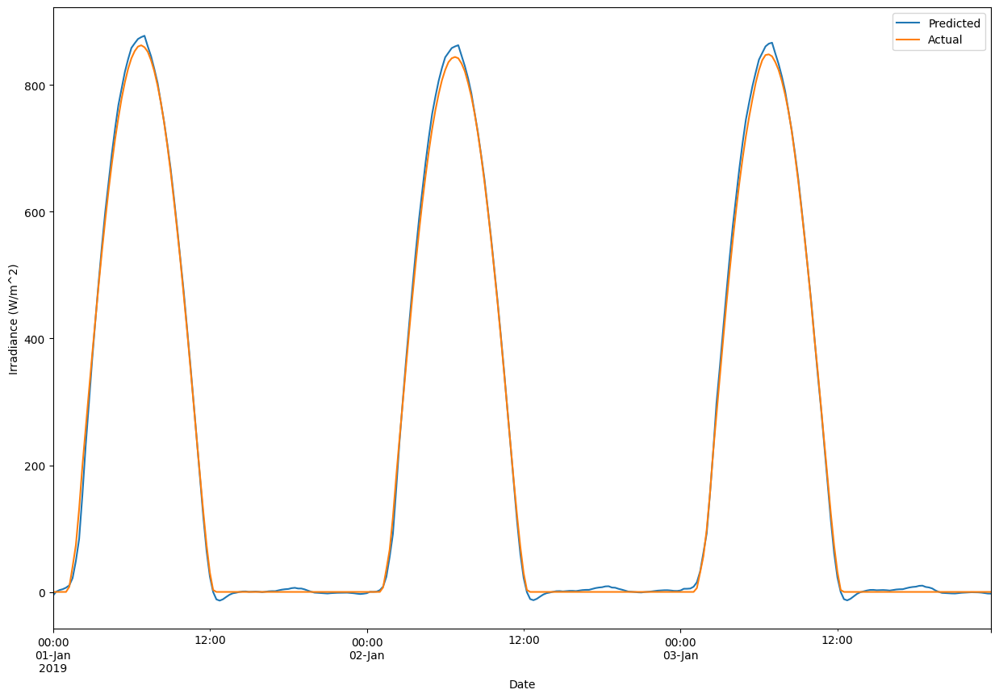

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(kur_val_x))
print("r2_Score",r2_score(s1_12.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

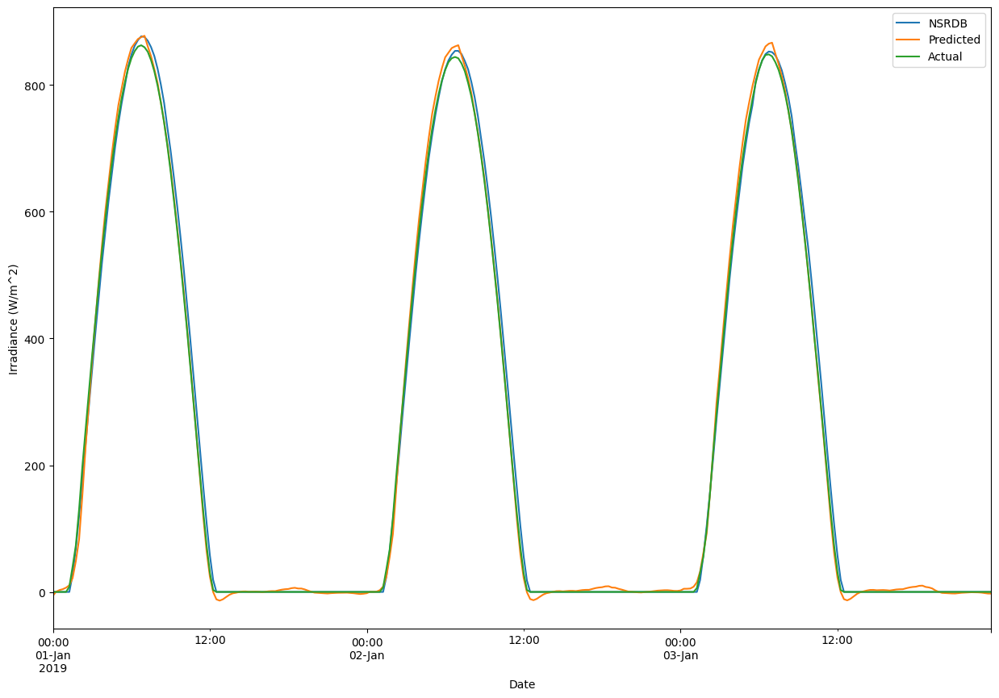

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.993926005680913
Root Mean Sqaured Error 23.584843937023557
Mean Absolute Error 13.154407948437498


Text(0, 0.5, 'Irradiance (W/m^2)')

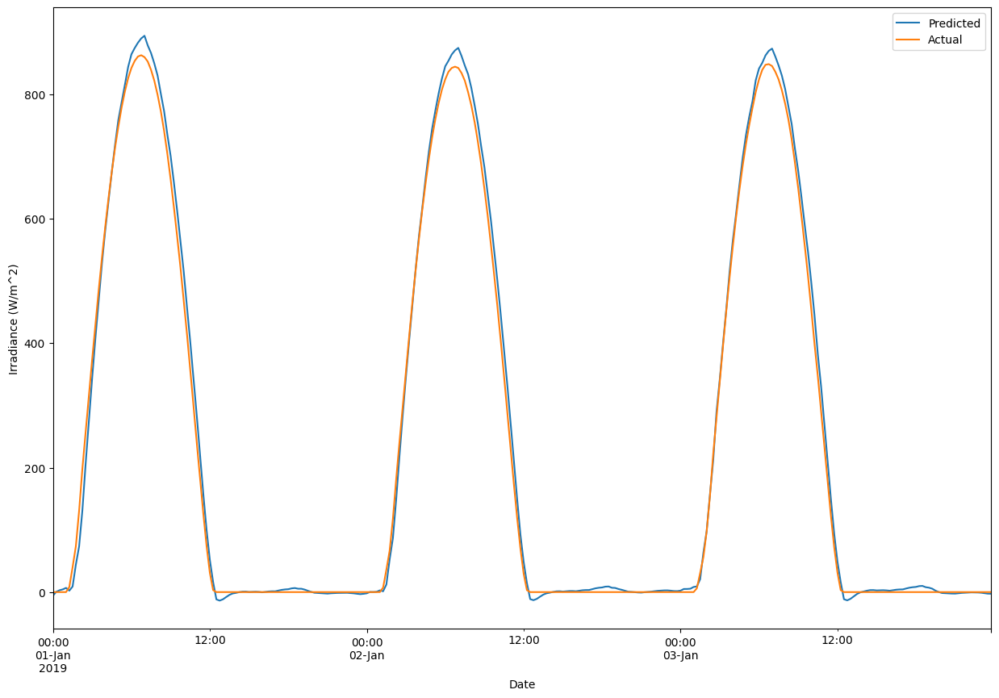

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

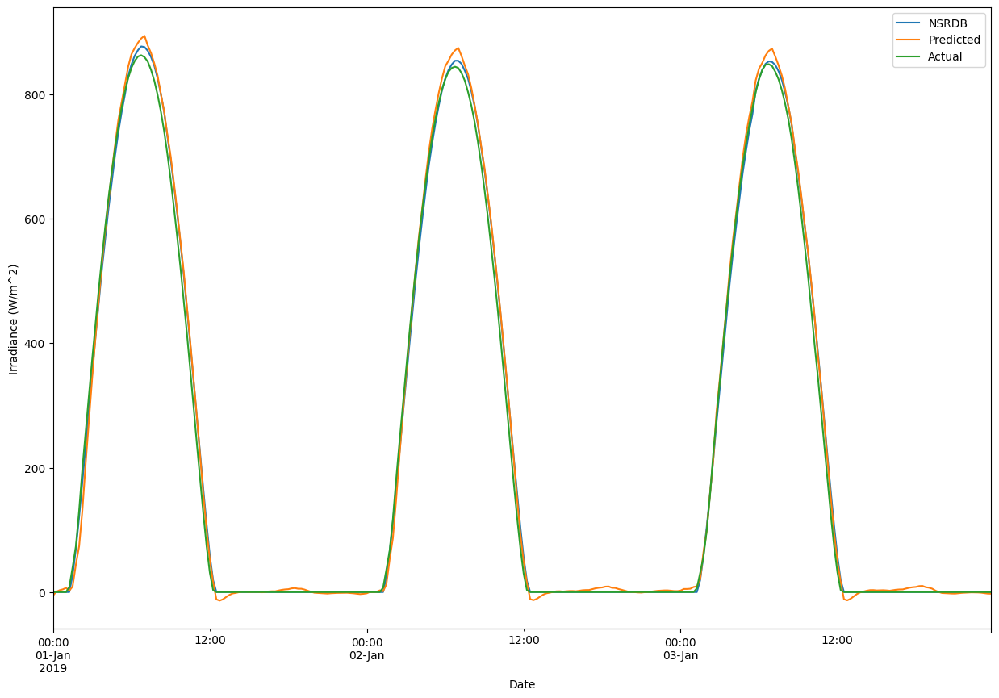

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S3_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S2_4.h5.h5')

1095/1095 [==============================] - 15s 13ms/step
r2_Score 0.9940380995084908
Root Mean Sqaured Error 23.618843
Mean Absolute Error 12.648789


Text(0, 0.5, 'Irradiance (W/m^2)')

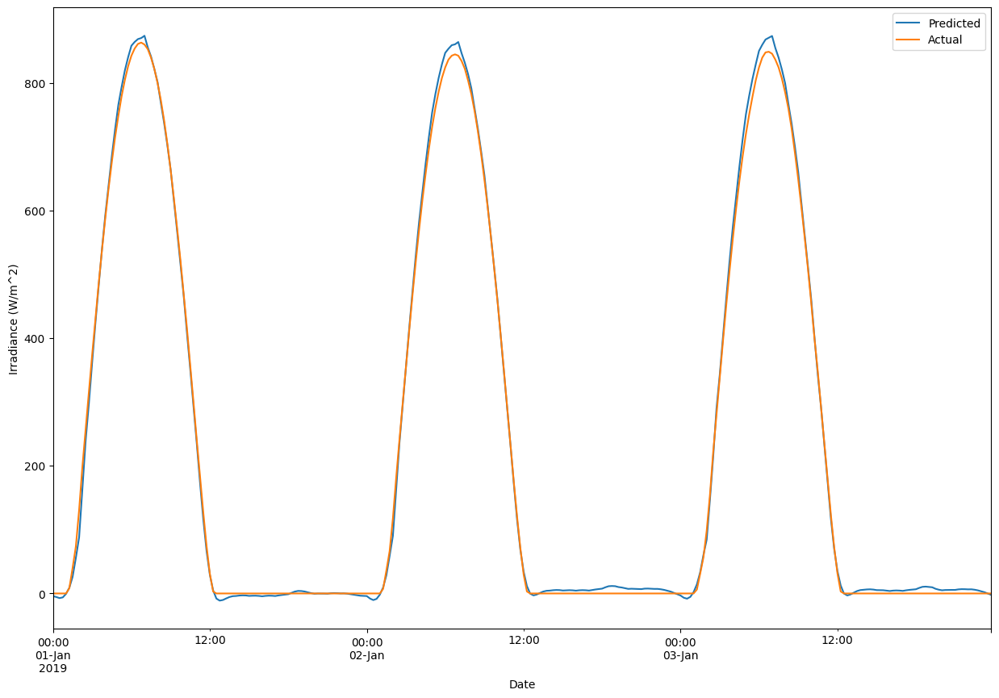

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(kur_val_x))
print("r2_Score",r2_score(s2_4.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

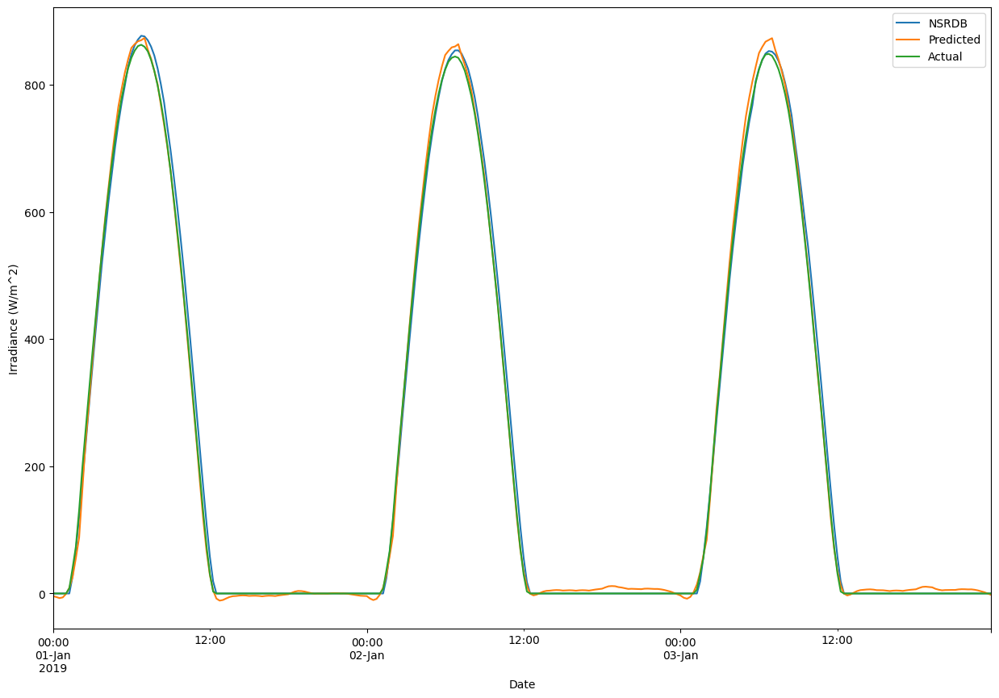

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.9939084808717215
Root Mean Sqaured Error 23.618843161235148
Mean Absolute Error 12.648789134195827


Text(0, 0.5, 'Irradiance (W/m^2)')

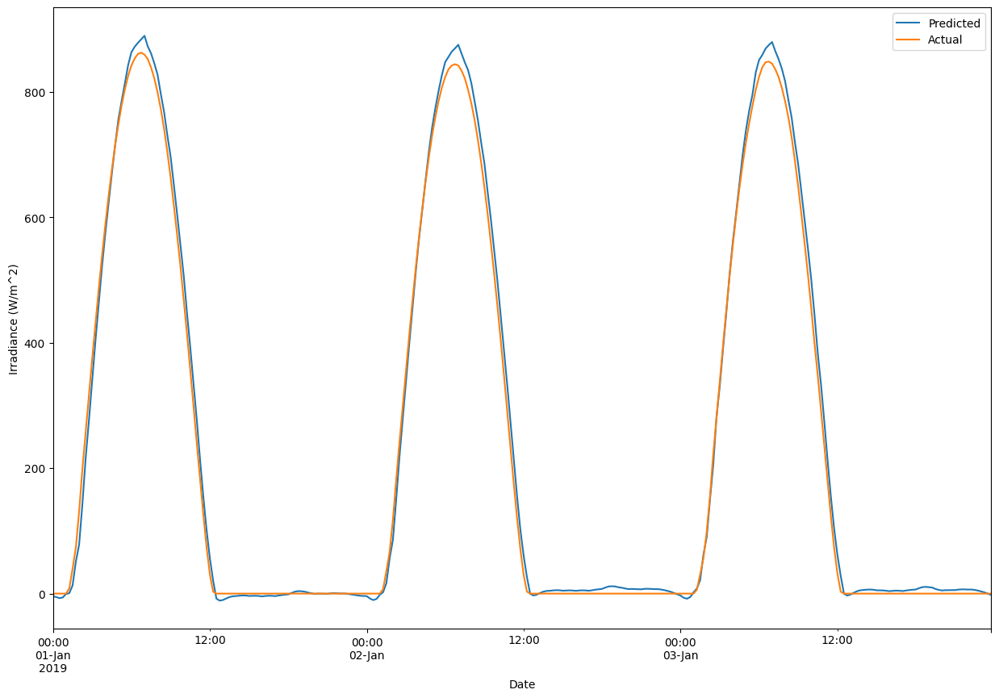

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

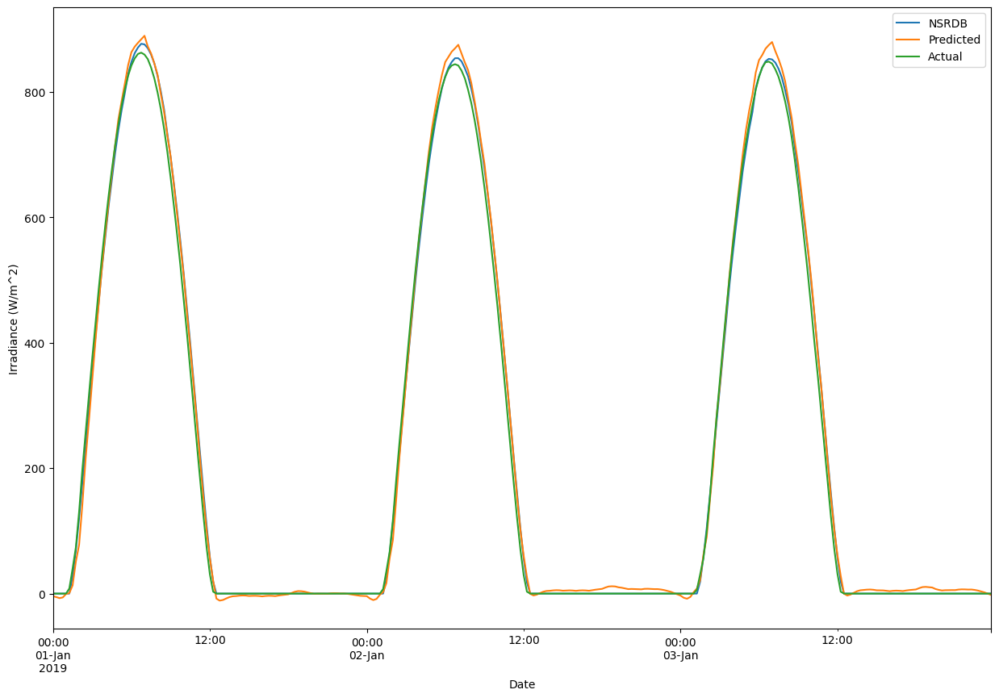

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S2_8.h5.h5')

1095/1095 [==============================] - 13s 12ms/step
r2_Score 0.9939877789137743
Root Mean Sqaured Error 23.192942
Mean Absolute Error 13.069674


Text(0, 0.5, 'Irradiance (W/m^2)')

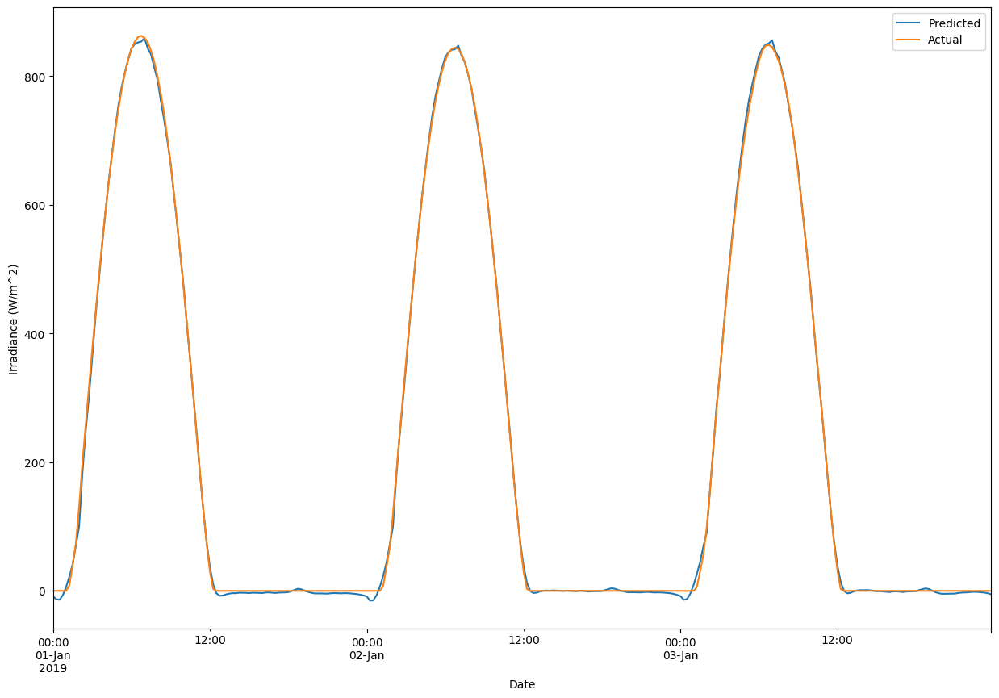

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(kur_val_x))
print("r2_Score",r2_score(s2_8.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

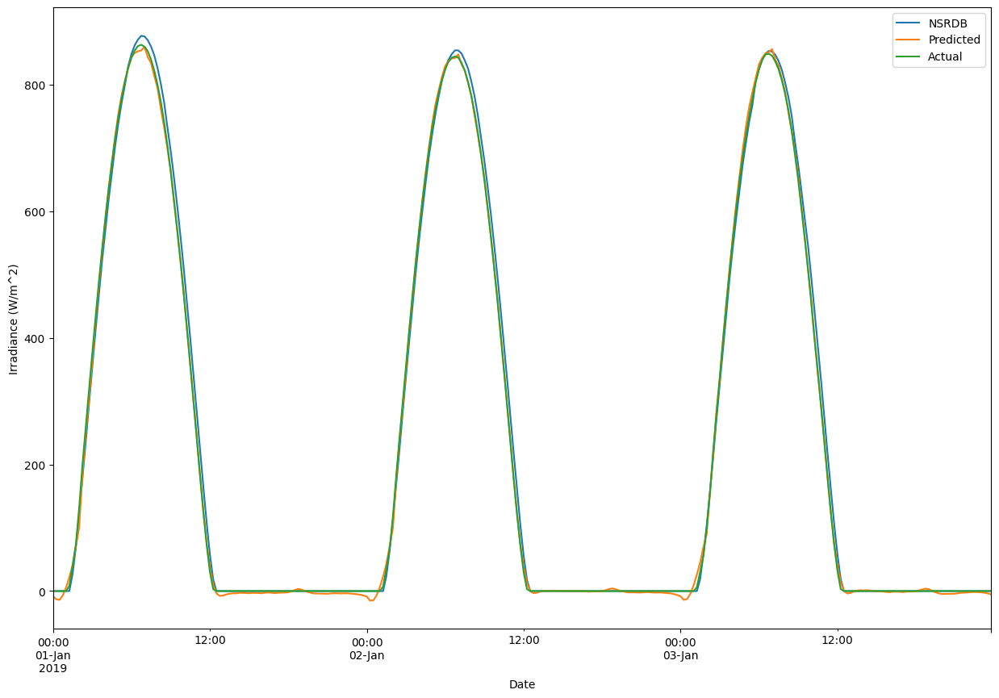

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.9941261877322155
Root Mean Sqaured Error 23.192942277274675
Mean Absolute Error 13.069674334506457


Text(0, 0.5, 'Irradiance (W/m^2)')

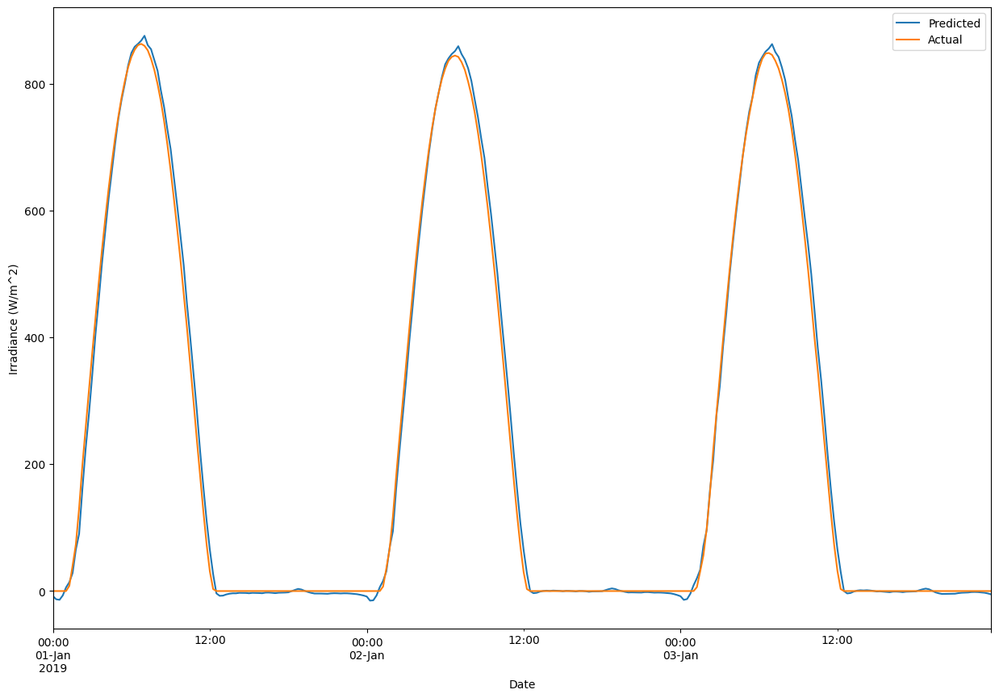

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

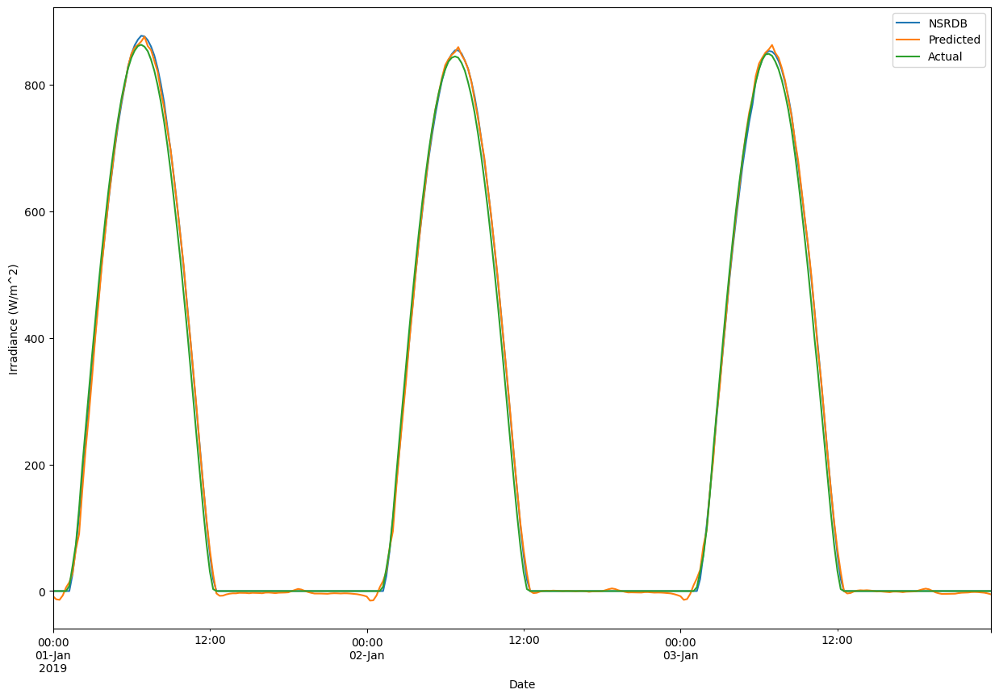

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S2_12.h5.h5')

1095/1095 [==============================] - 11s 10ms/step
r2_Score 0.9942297993724578
Root Mean Sqaured Error 22.712154
Mean Absolute Error 11.36664


Text(0, 0.5, 'Irradiance (W/m^2)')

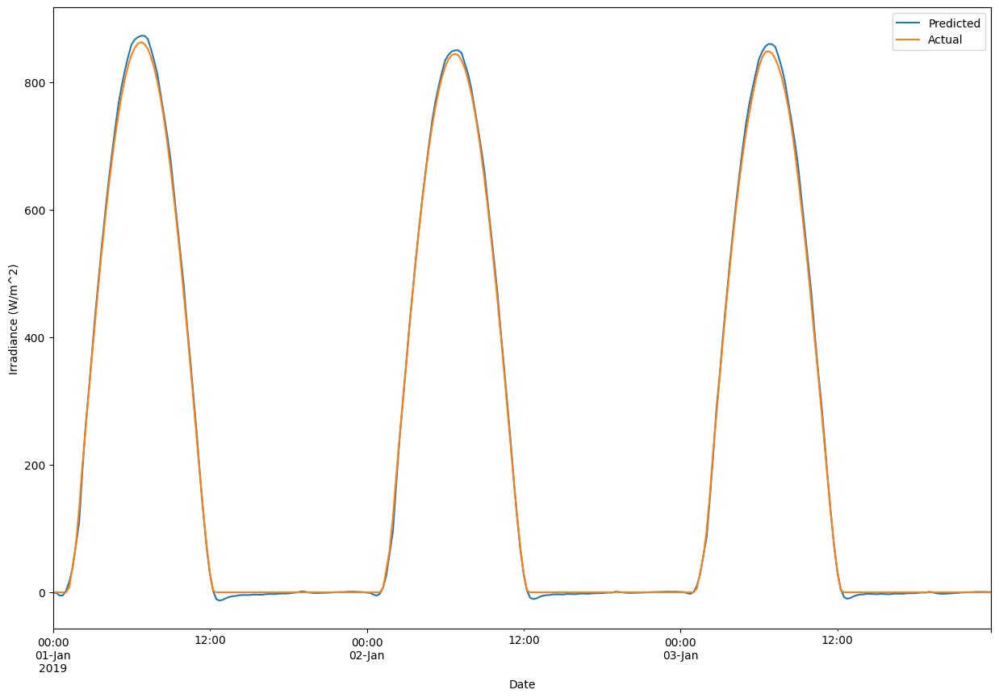

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(kur_val_x))
print("r2_Score",r2_score(s1_12.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

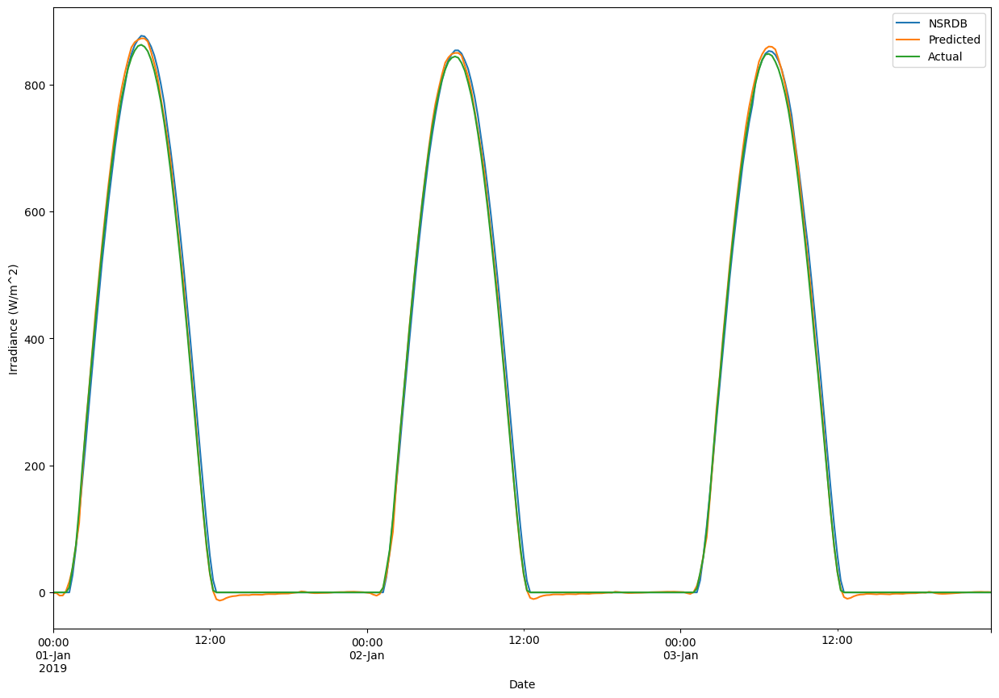

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.9943671908167255
Root Mean Sqaured Error 22.712154603418888
Mean Absolute Error 11.366639994156385


Text(0, 0.5, 'Irradiance (W/m^2)')

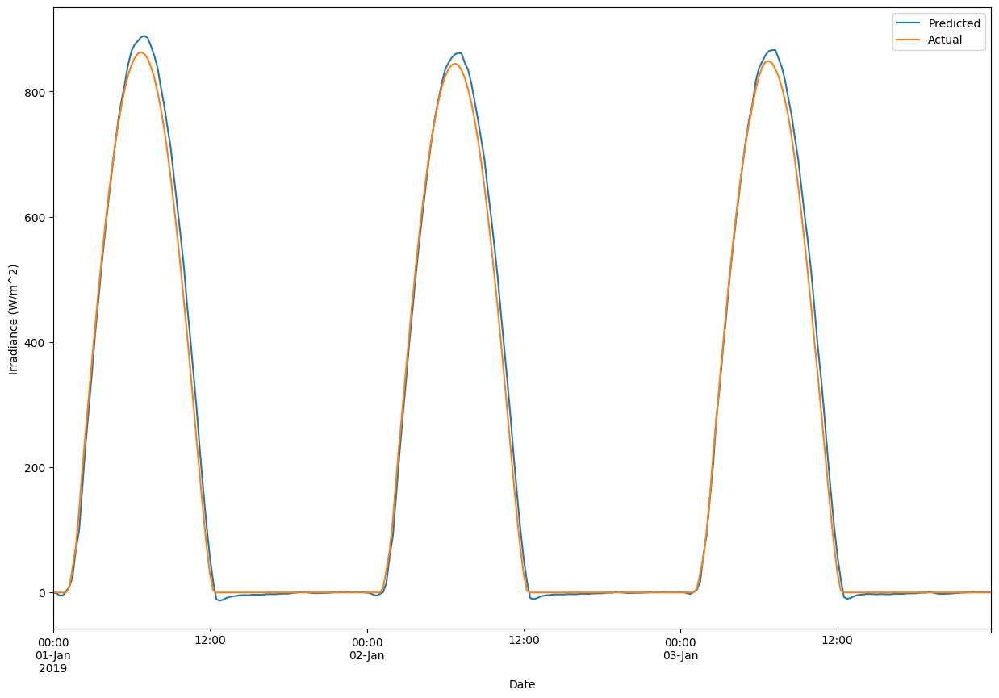

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

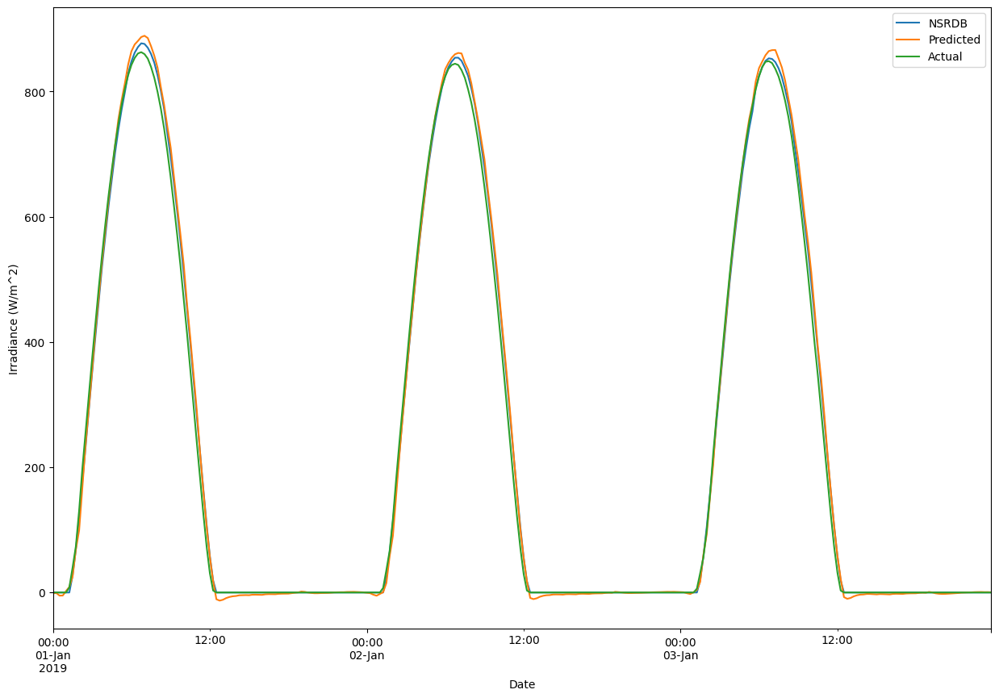

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S3_4.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9922826385480045
Root Mean Sqaured Error 26.769968
Mean Absolute Error 17.891565


Text(0, 0.5, 'Irradiance (W/m^2)')

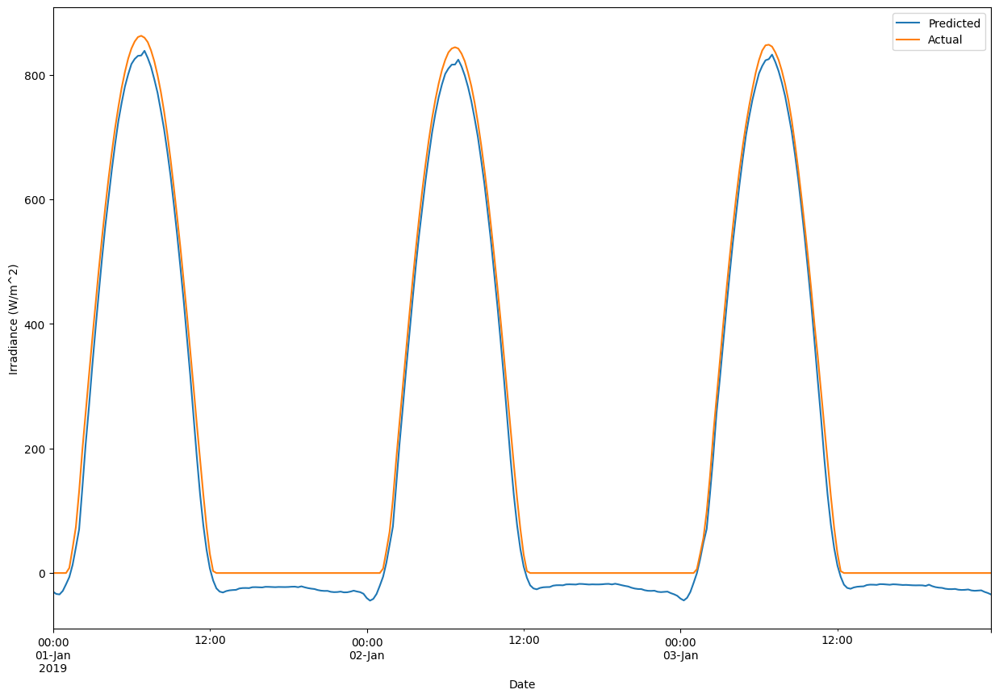

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(kur_val_x))
print("r2_Score",r2_score(s3_4.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

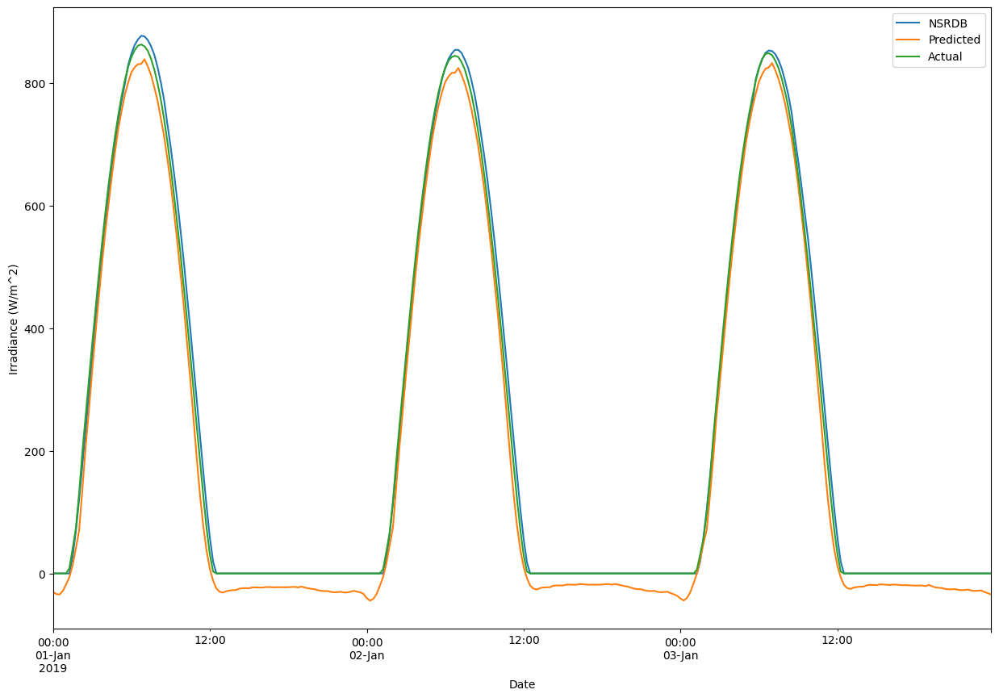

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.9921746443526396
Root Mean Sqaured Error 26.769968390973595
Mean Absolute Error 17.891564830042185


Text(0, 0.5, 'Irradiance (W/m^2)')

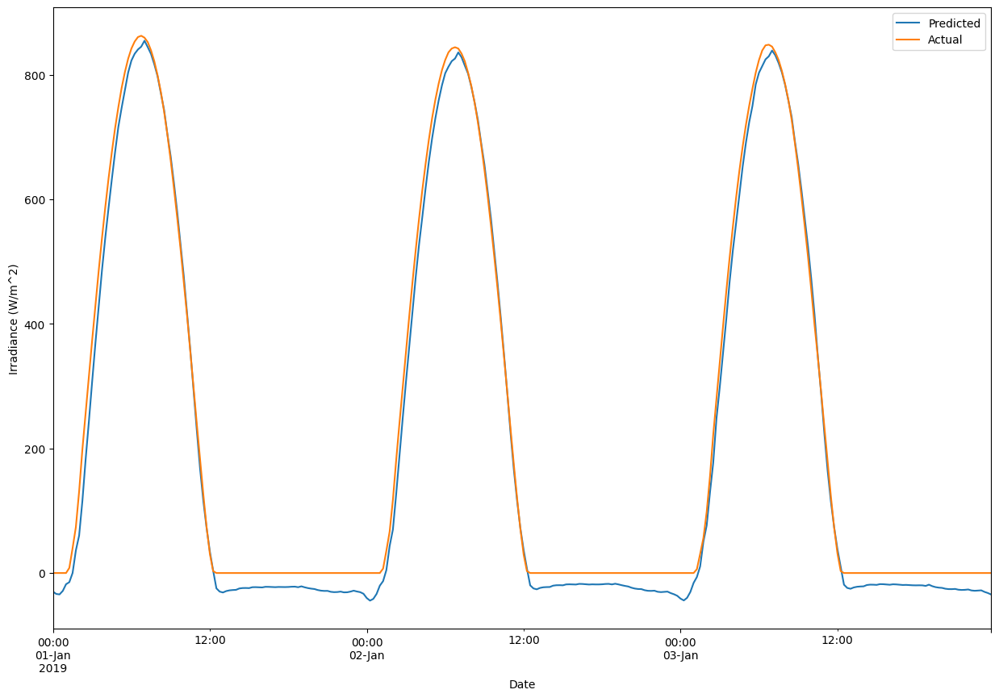

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

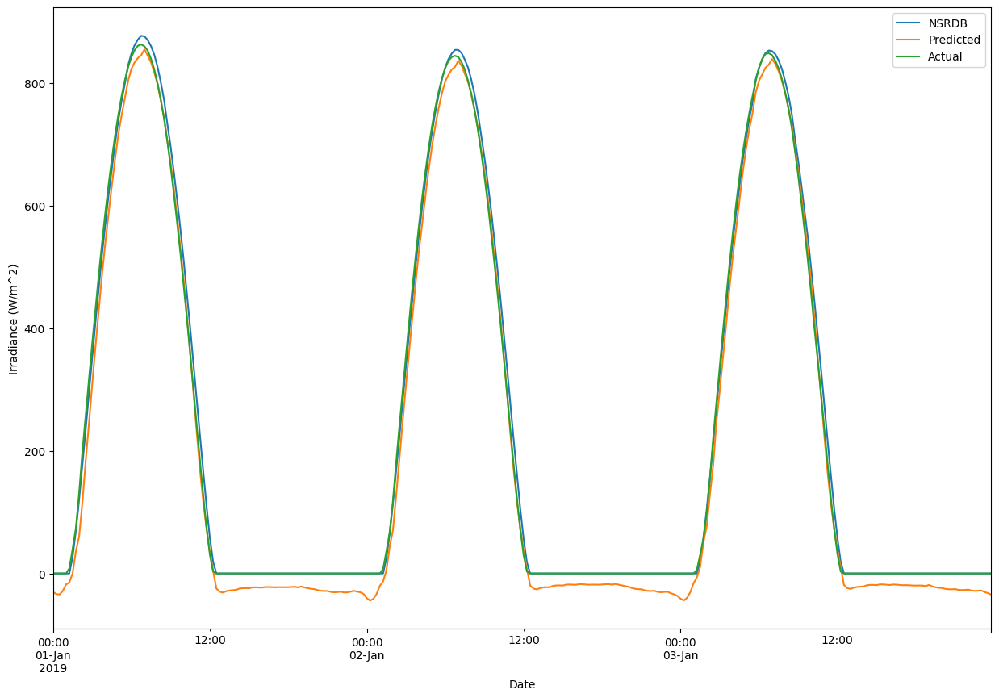

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S3_8.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9933706534406666
Root Mean Sqaured Error 24.648846
Mean Absolute Error 14.52957


Text(0, 0.5, 'Irradiance (W/m^2)')

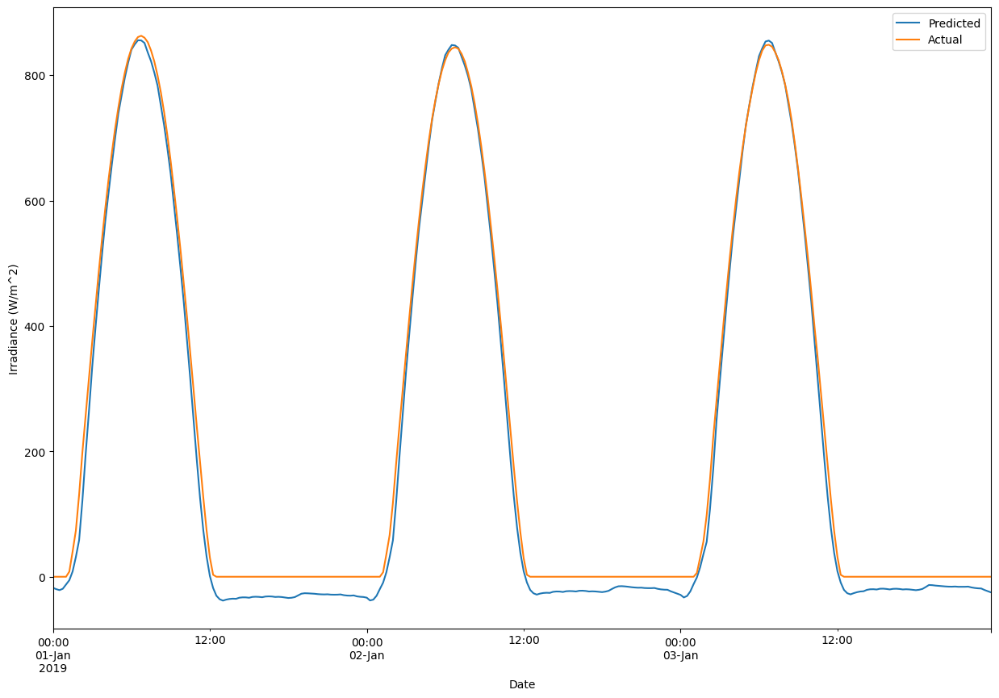

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(kur_val_x))
print("r2_Score",r2_score(s3_8.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

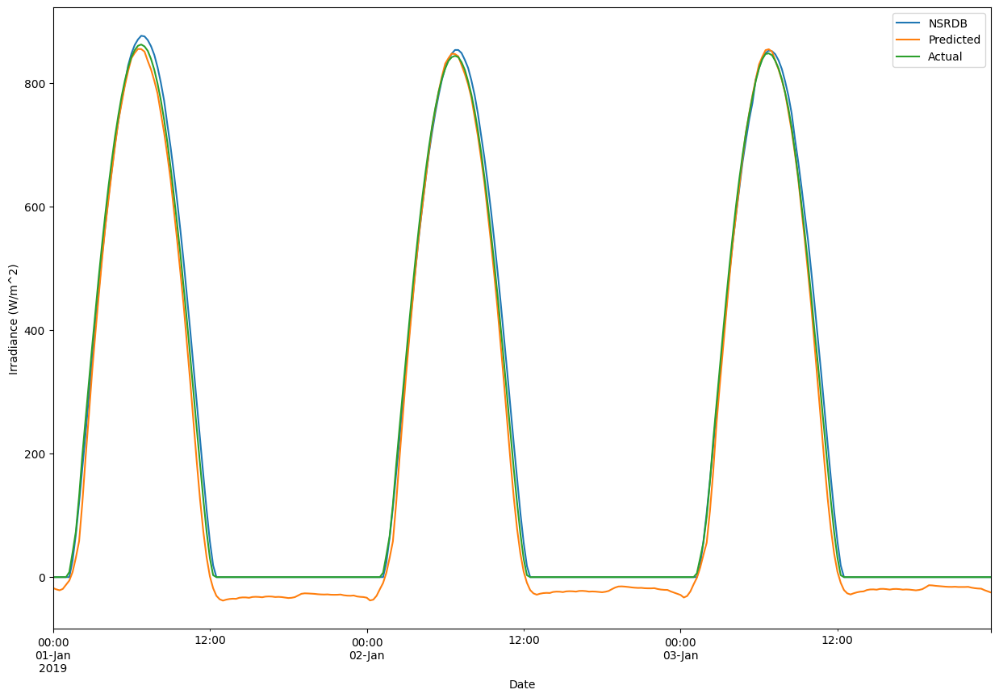

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.9933656018887946
Root Mean Sqaured Error 24.648845377683827
Mean Absolute Error 14.529570807658493


Text(0, 0.5, 'Irradiance (W/m^2)')

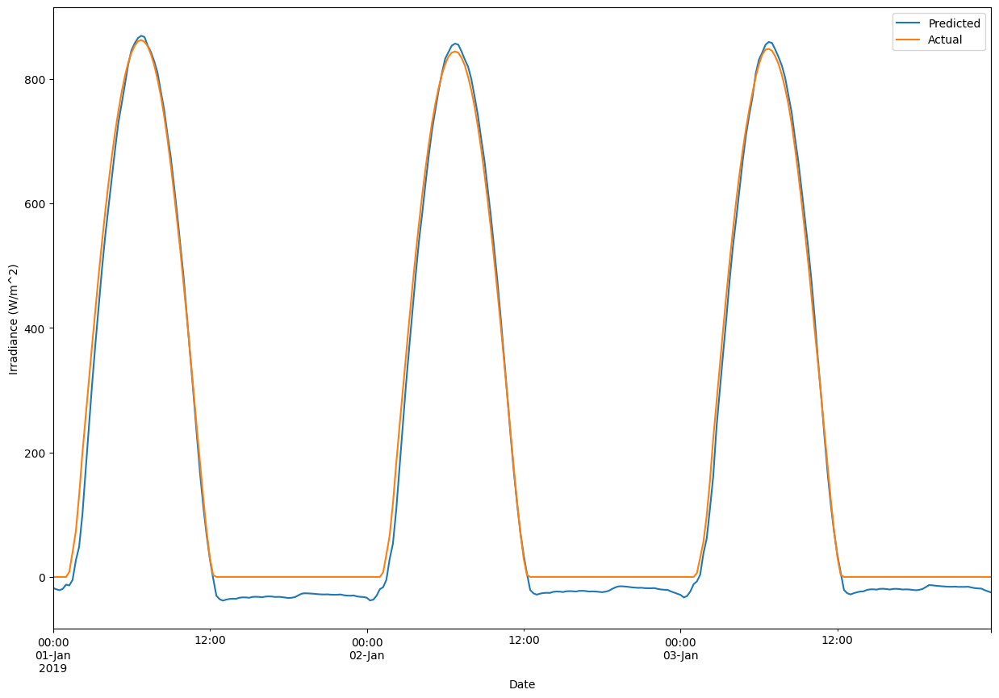

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

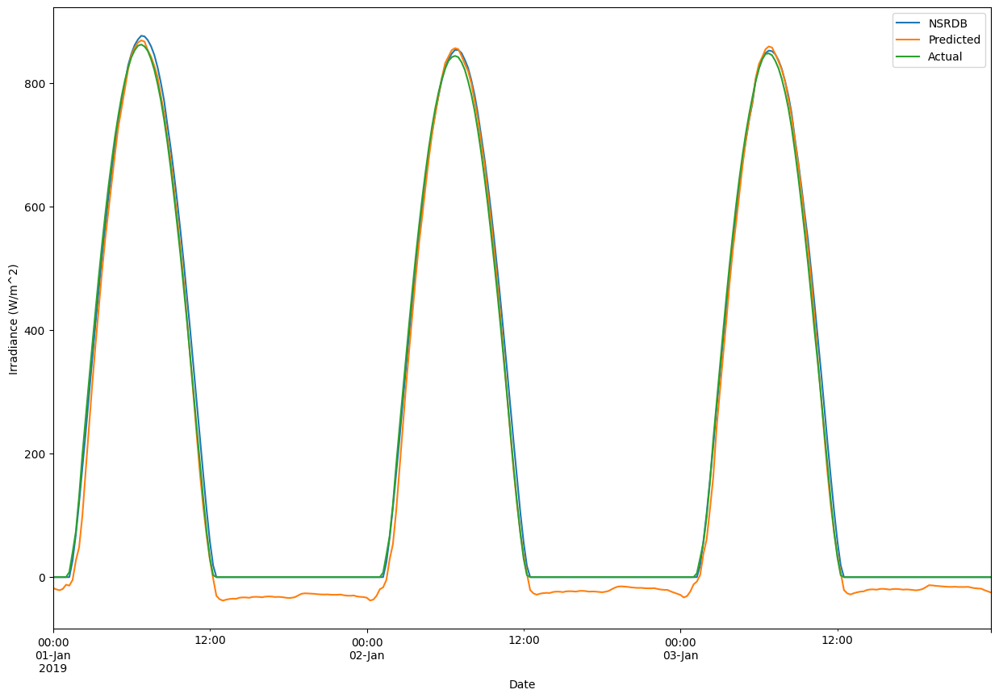

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kurnool/S3_8.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9933706534406666
Root Mean Sqaured Error 24.648846
Mean Absolute Error 14.52957


Text(0, 0.5, 'Irradiance (W/m^2)')

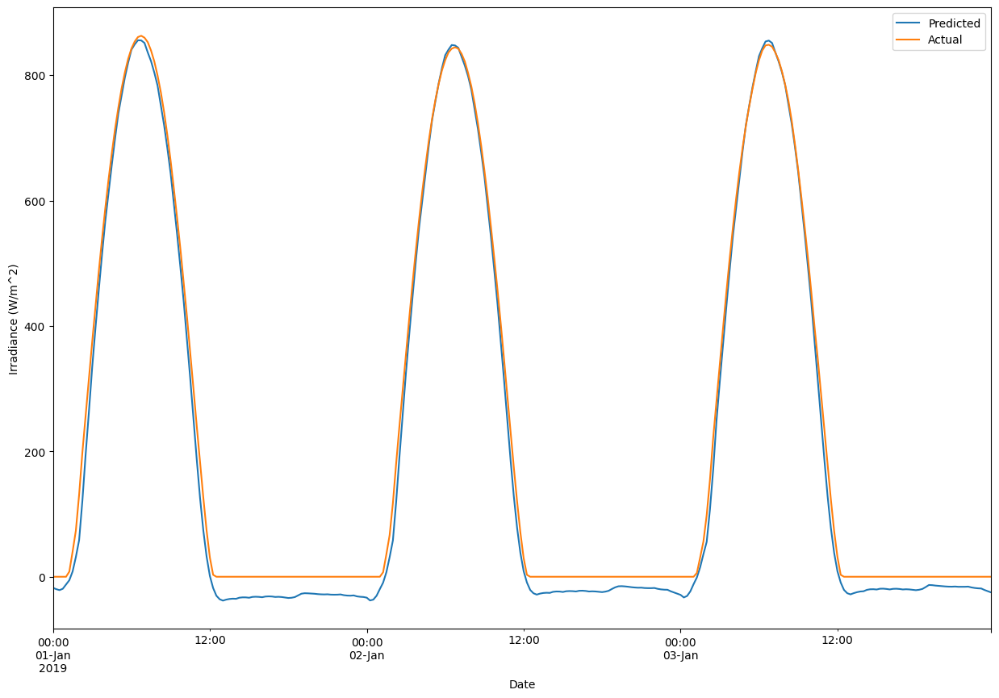

In [ ]:
df_date_kur_val['Actual']=scaler_y.inverse_transform(kur_val_y)
df_date_kur_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(kur_val_x))
print("r2_Score",r2_score(s3_12.predict(kur_val_x),kur_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['Actual'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['NSRDB']=kur_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

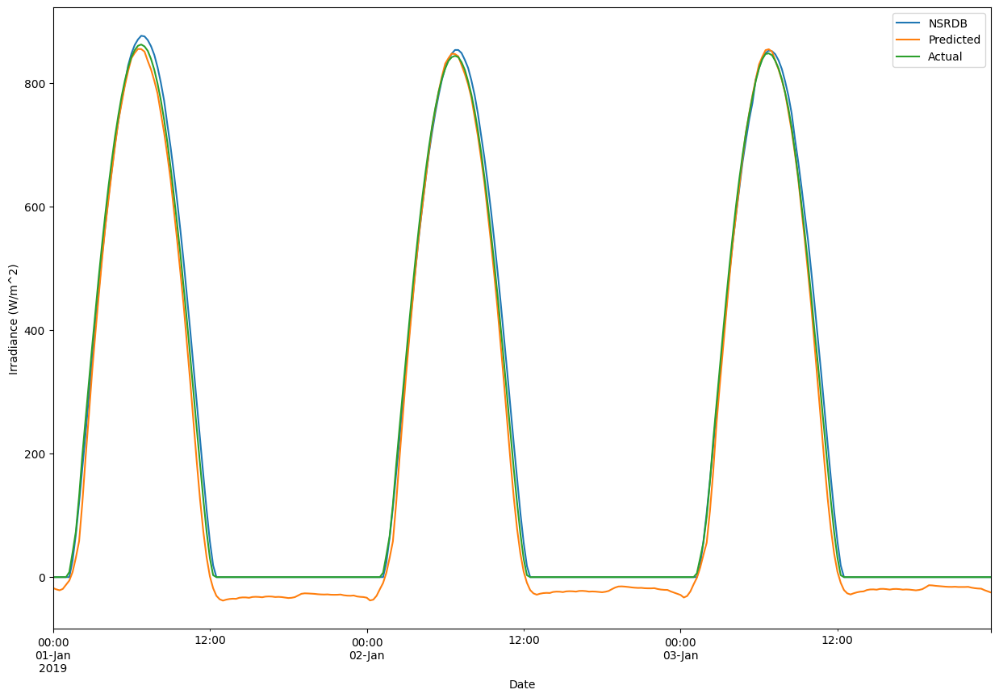

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kur_val['Error']=df_date_kur_val['Actual']-df_date_kur_val['NSRDB']

In [ ]:
df_date_kur_val['Predicted']=df_date_kur_val['Predicted']- df_date_kur_val['Error']

r2_Score 0.9933656018887946
Root Mean Sqaured Error 24.648845377683827
Mean Absolute Error 14.529570807658493


Text(0, 0.5, 'Irradiance (W/m^2)')

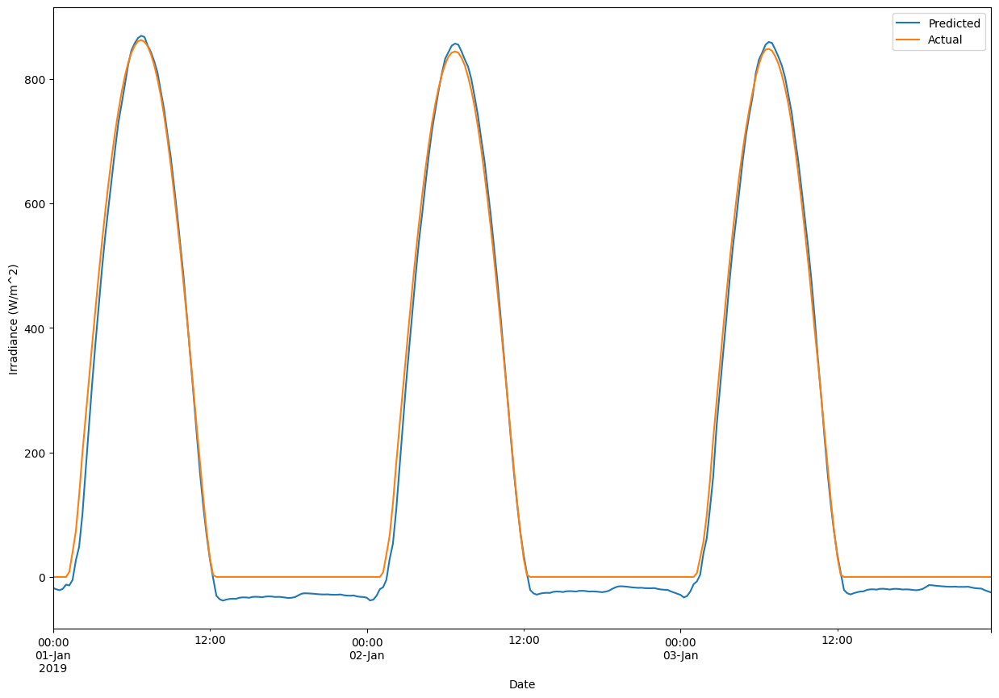

In [ ]:
print("r2_Score",r2_score(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kur_val['NSRDB'],df_date_kur_val['Predicted']))
df_date_kur_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

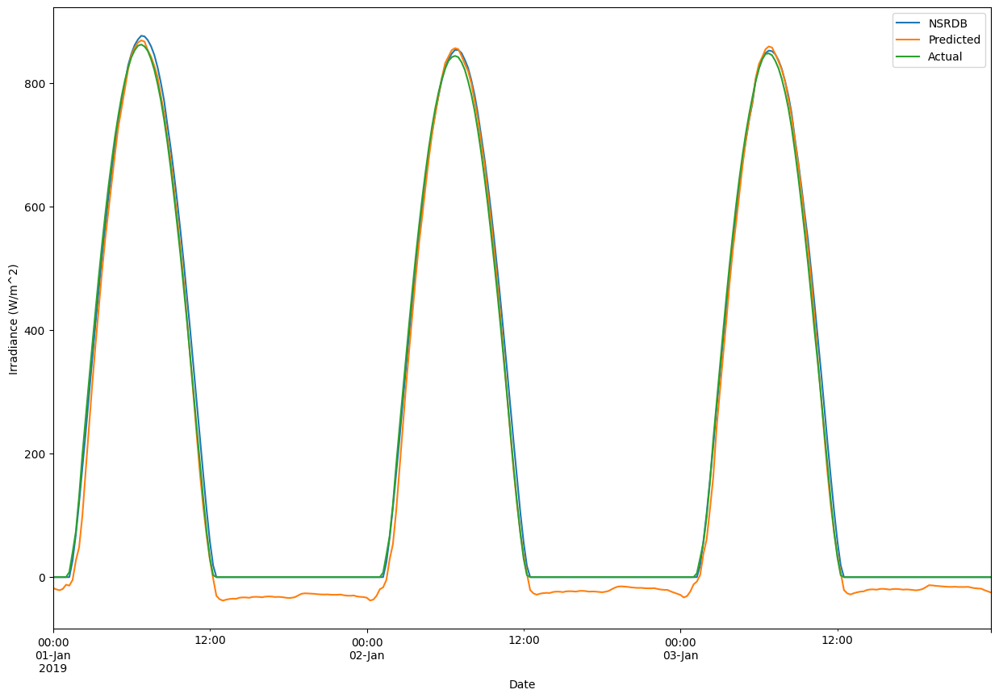

In [ ]:
df_date_kur_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# KAM

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S1_4.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9863836915214038
Root Mean Sqaured Error 35.77365
Mean Absolute Error 22.292925


Text(0, 0.5, 'Irradiance (W/m^2)')

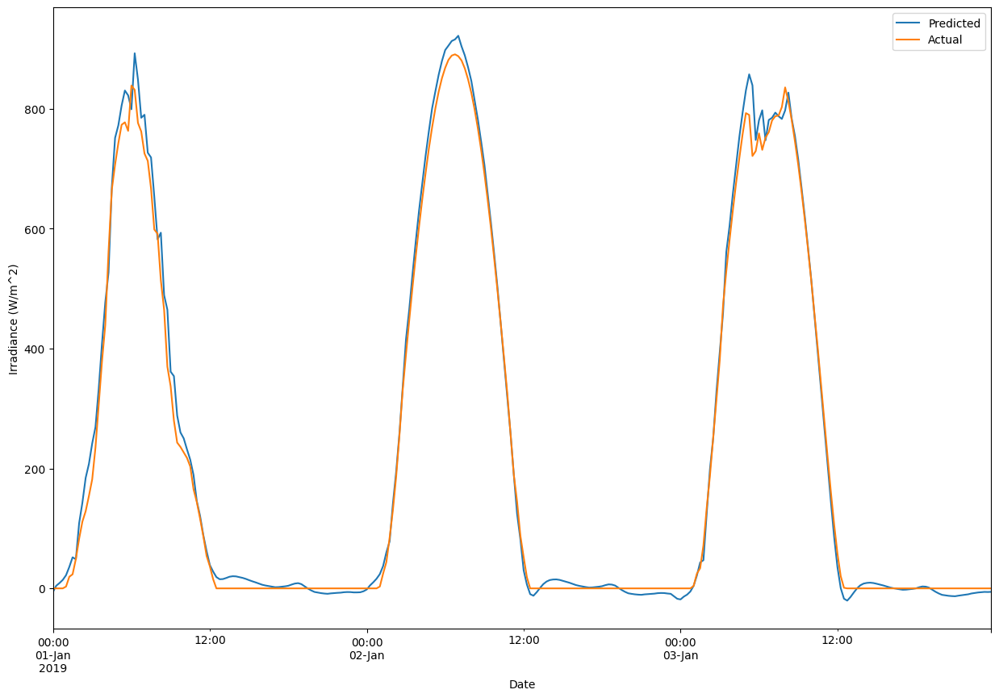

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(kam_val_x))
print("r2_Score",r2_score(s1_4.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

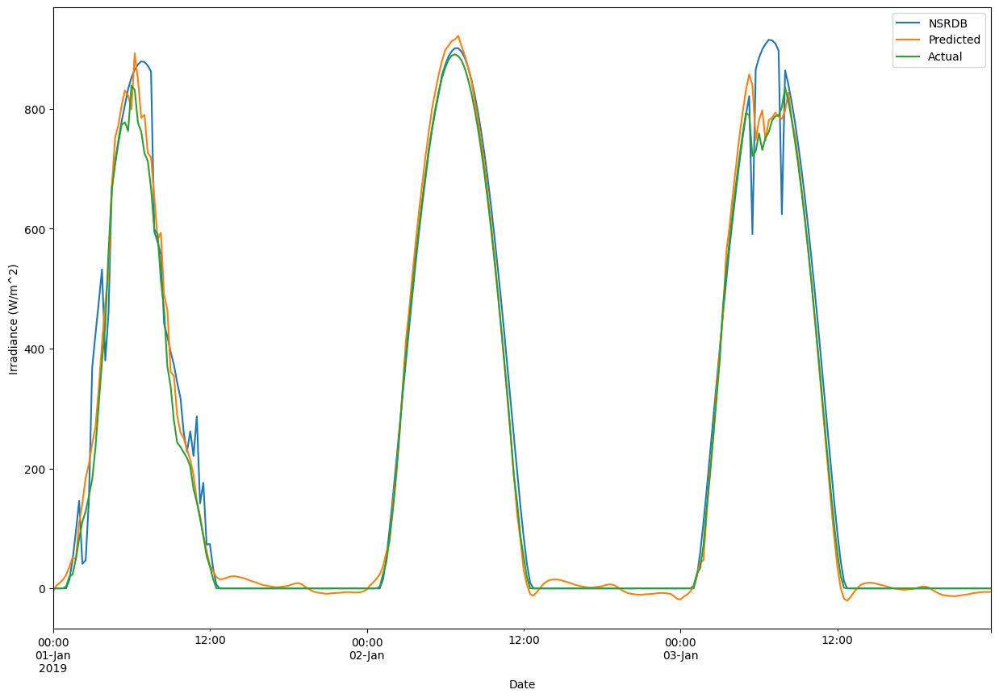

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.9848662301763362
Root Mean Sqaured Error 35.77365011959725
Mean Absolute Error 22.292922972744655


Text(0, 0.5, 'Irradiance (W/m^2)')

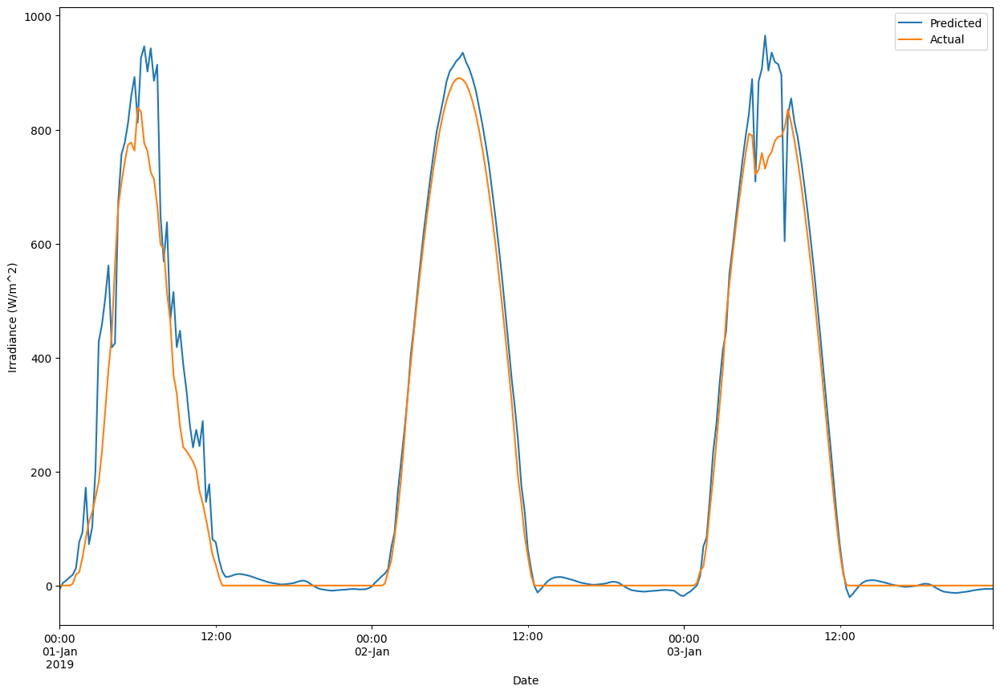

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

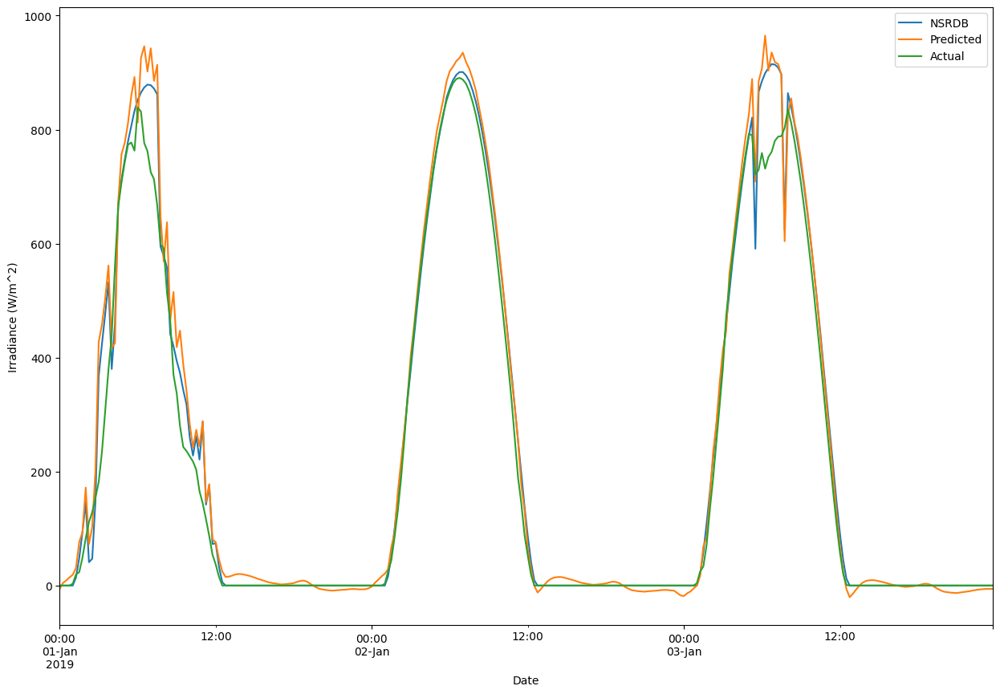

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S1_8.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9882707802226074
Root Mean Sqaured Error 32.997097
Mean Absolute Error 18.443985


Text(0, 0.5, 'Irradiance (W/m^2)')

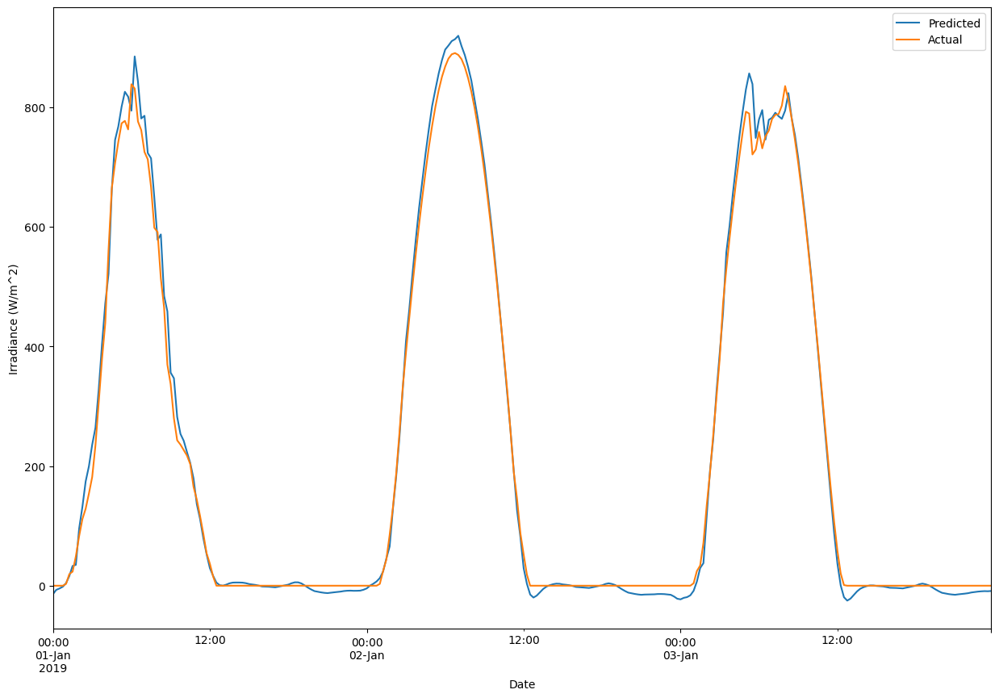

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(kam_val_x))
print("r2_Score",r2_score(s1_4.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

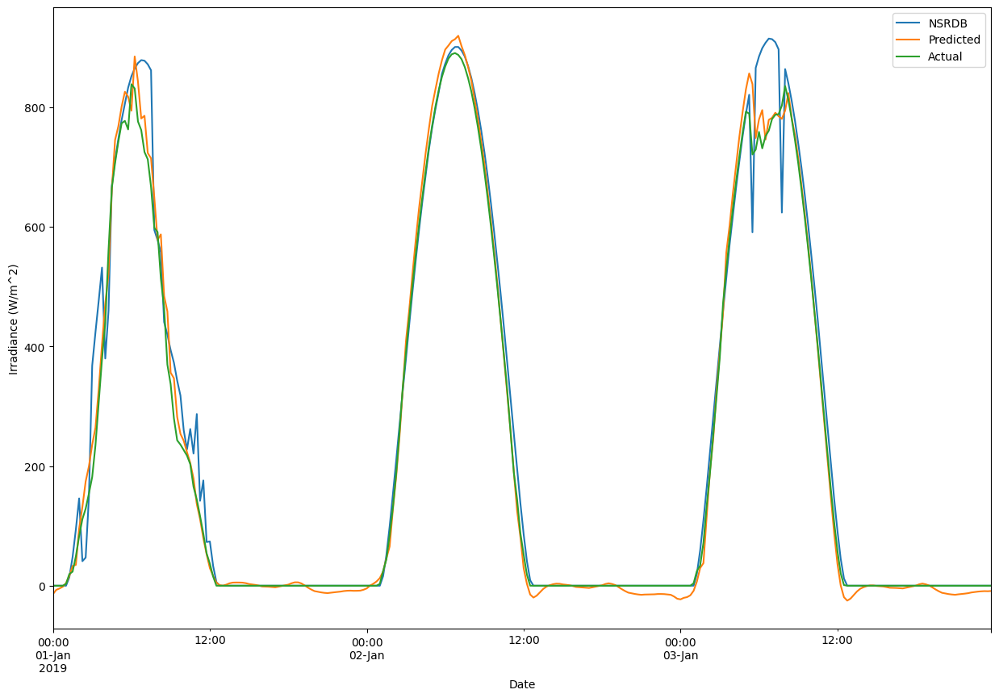

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.9871242618183625
Root Mean Sqaured Error 32.99709913021097
Mean Absolute Error 18.443984924605942


Text(0, 0.5, 'Irradiance (W/m^2)')

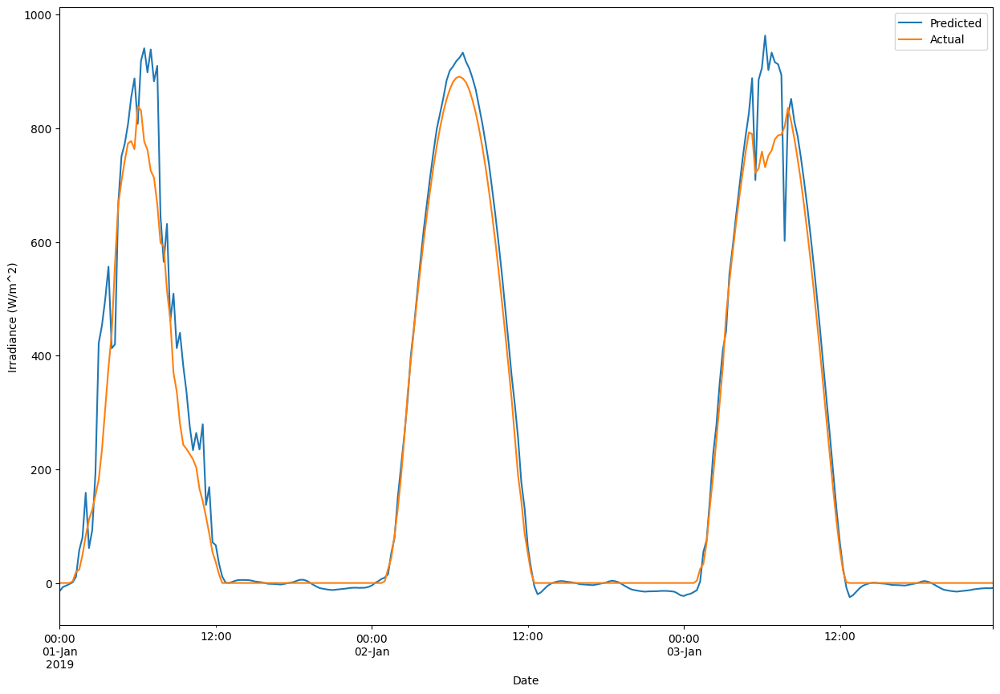

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

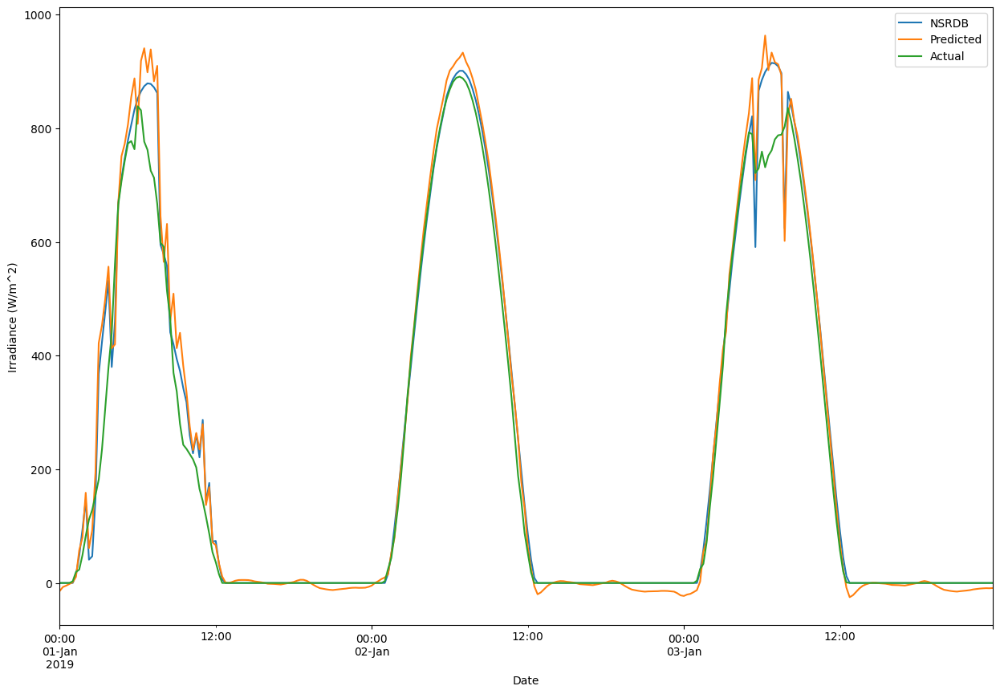

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S1_12.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9882487975034933
Root Mean Sqaured Error 32.52567
Mean Absolute Error 17.551008


Text(0, 0.5, 'Irradiance (W/m^2)')

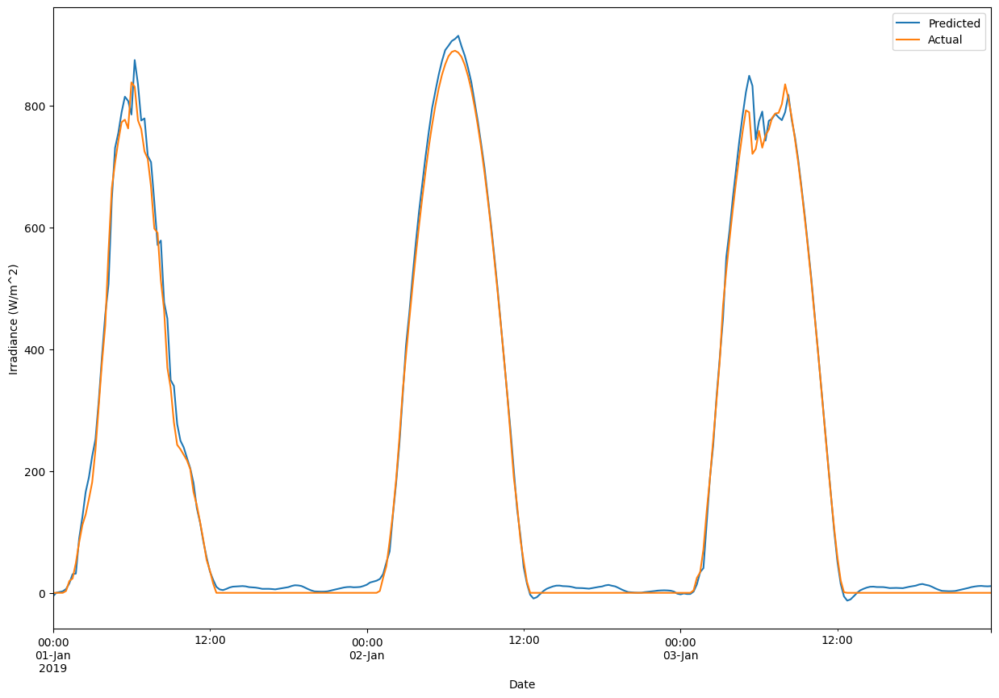

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(kam_val_x))
print("r2_Score",r2_score(s1_12.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

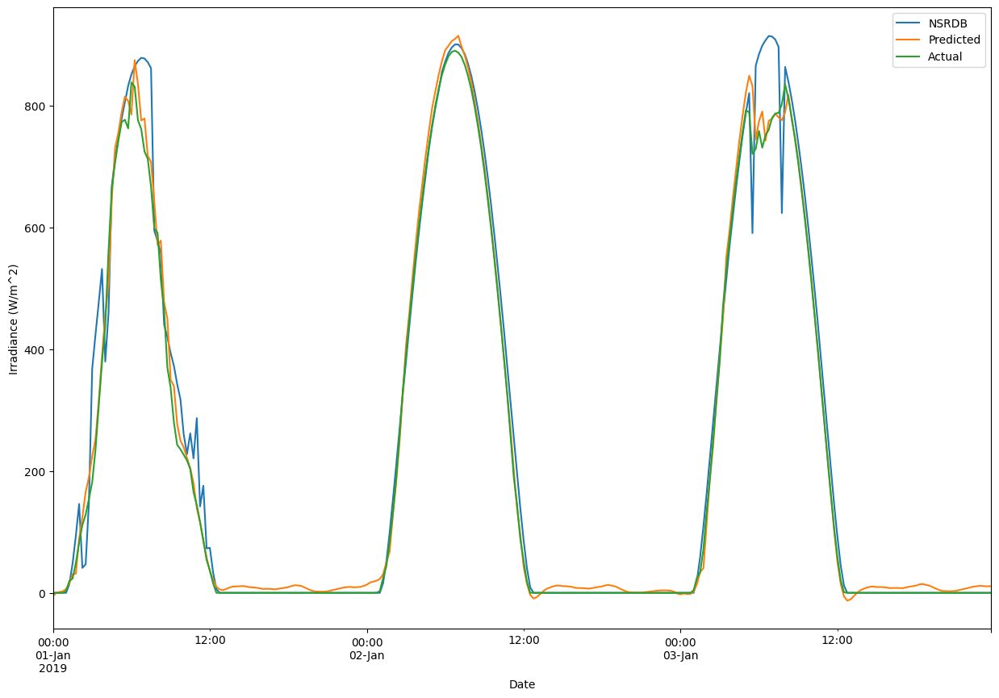

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.9874895446760347
Root Mean Sqaured Error 32.525669978507445
Mean Absolute Error 17.551008572202754


Text(0, 0.5, 'Irradiance (W/m^2)')

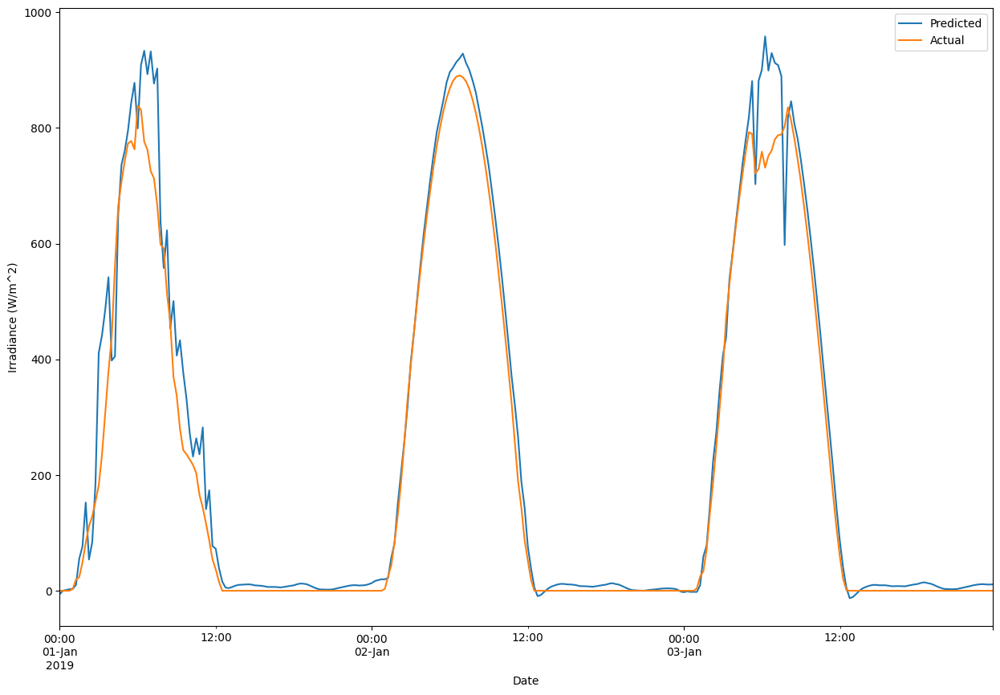

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

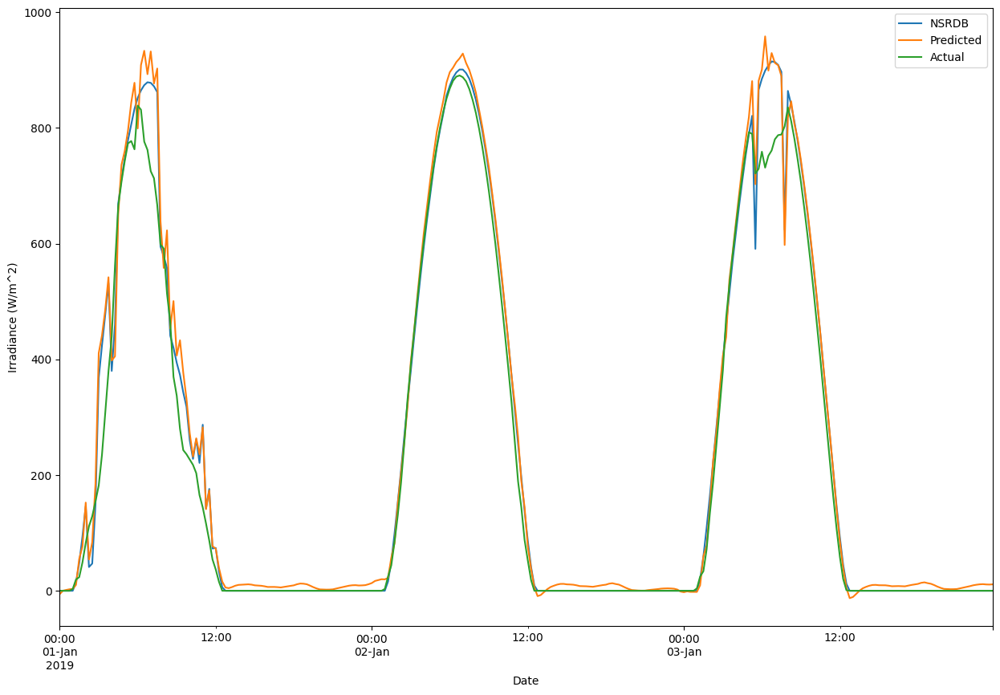

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S2_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S2_4.h5.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9876213848181946
Root Mean Sqaured Error 34.326878
Mean Absolute Error 18.497087


Text(0, 0.5, 'Irradiance (W/m^2)')

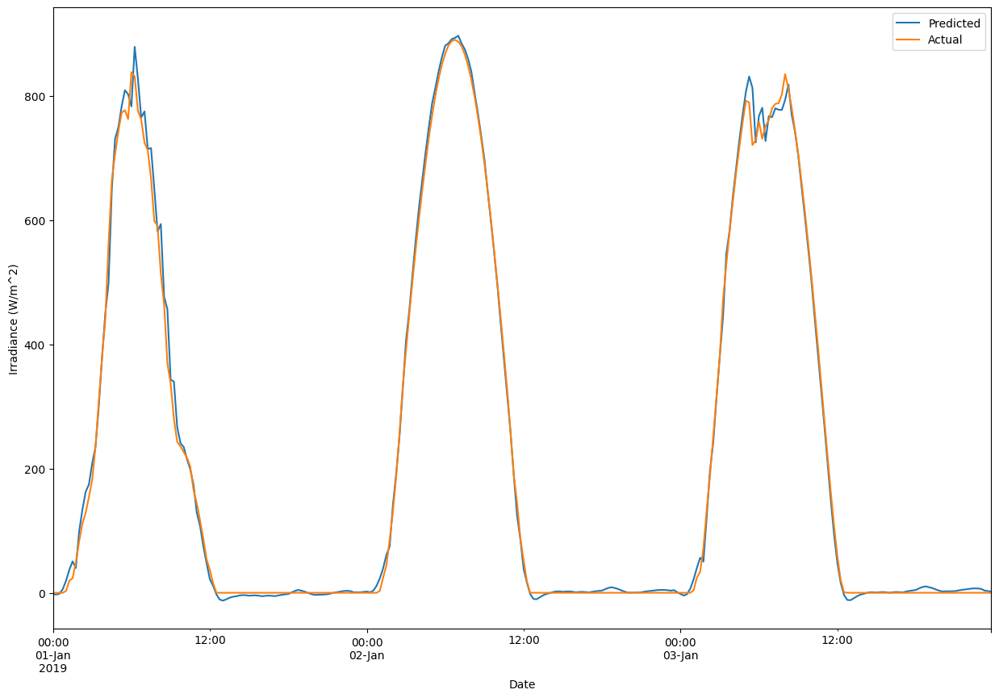

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(kam_val_x))
print("r2_Score",r2_score(s2_4.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

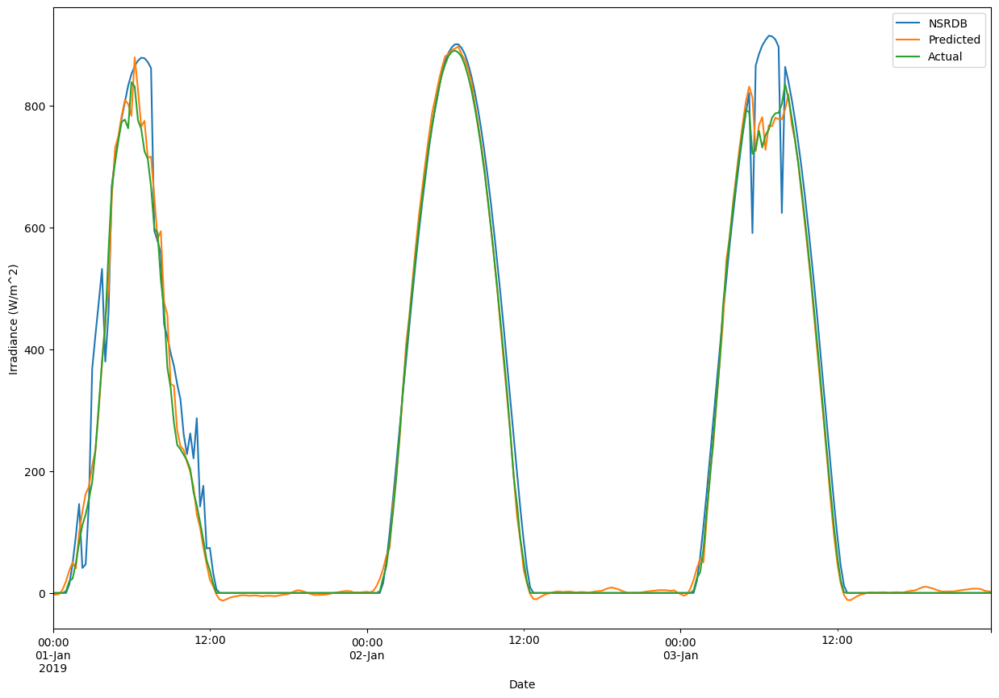

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.9860655709887374
Root Mean Sqaured Error 34.32687603518193
Mean Absolute Error 18.497086819937902


Text(0, 0.5, 'Irradiance (W/m^2)')

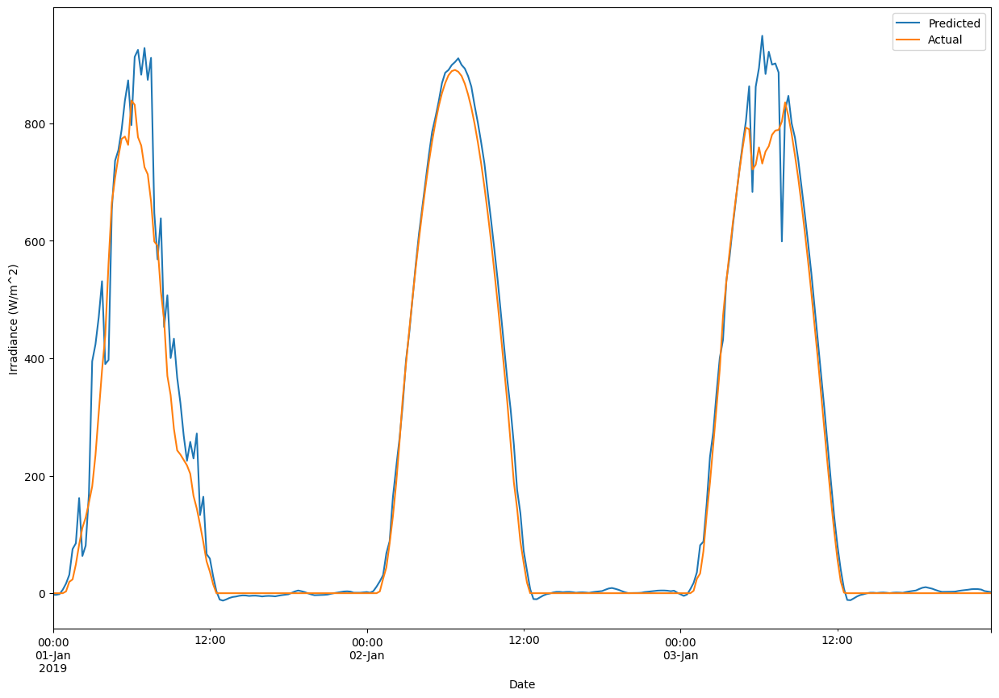

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

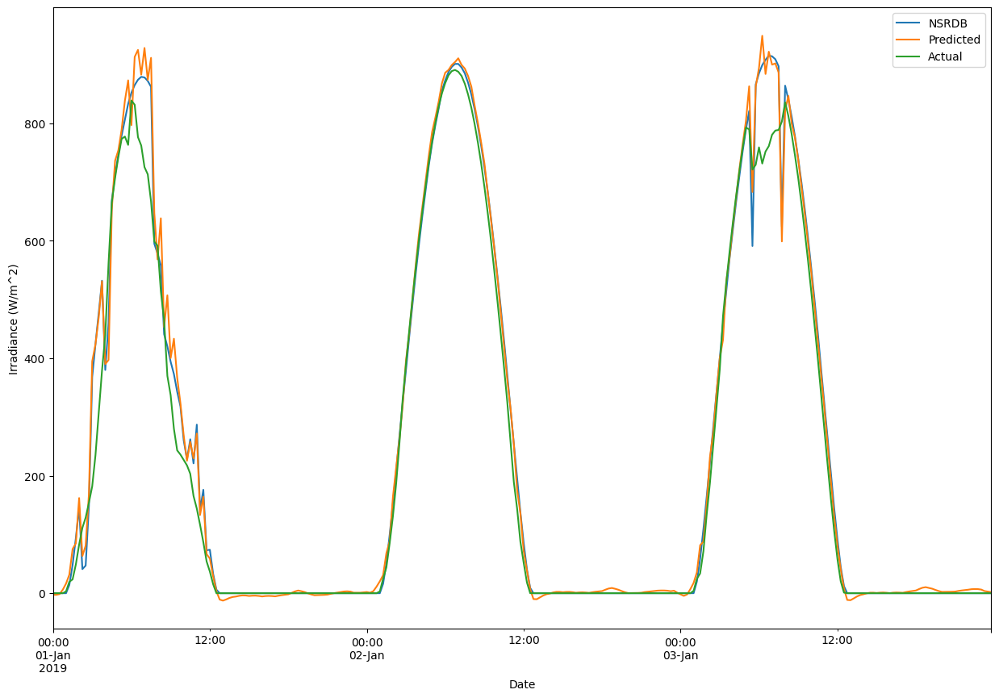

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_8 

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S2_8.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9876447418981441
Root Mean Sqaured Error 33.574795
Mean Absolute Error 17.90111


Text(0, 0.5, 'Irradiance (W/m^2)')

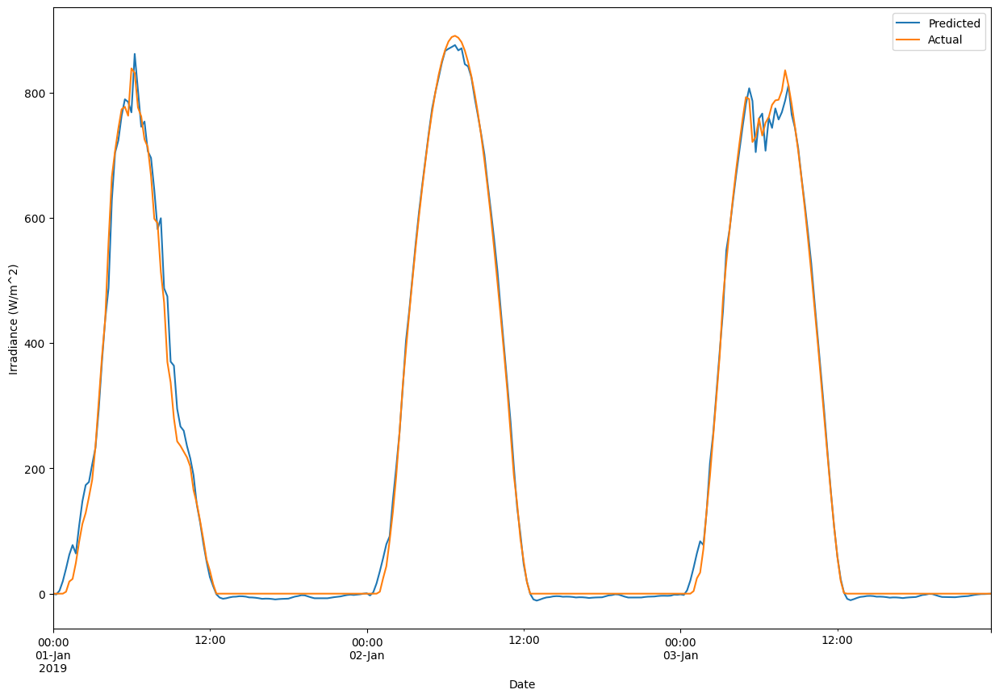

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(kam_val_x))
print("r2_Score",r2_score(s2_8.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

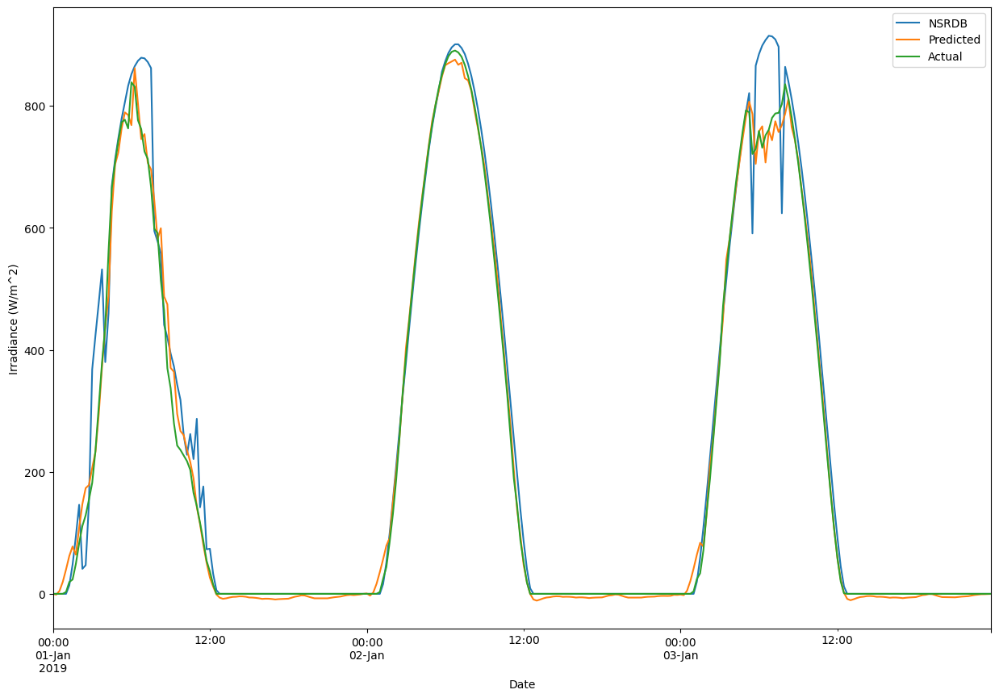

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.9866694727445154
Root Mean Sqaured Error 33.57479398698756
Mean Absolute Error 17.901108061877604


Text(0, 0.5, 'Irradiance (W/m^2)')

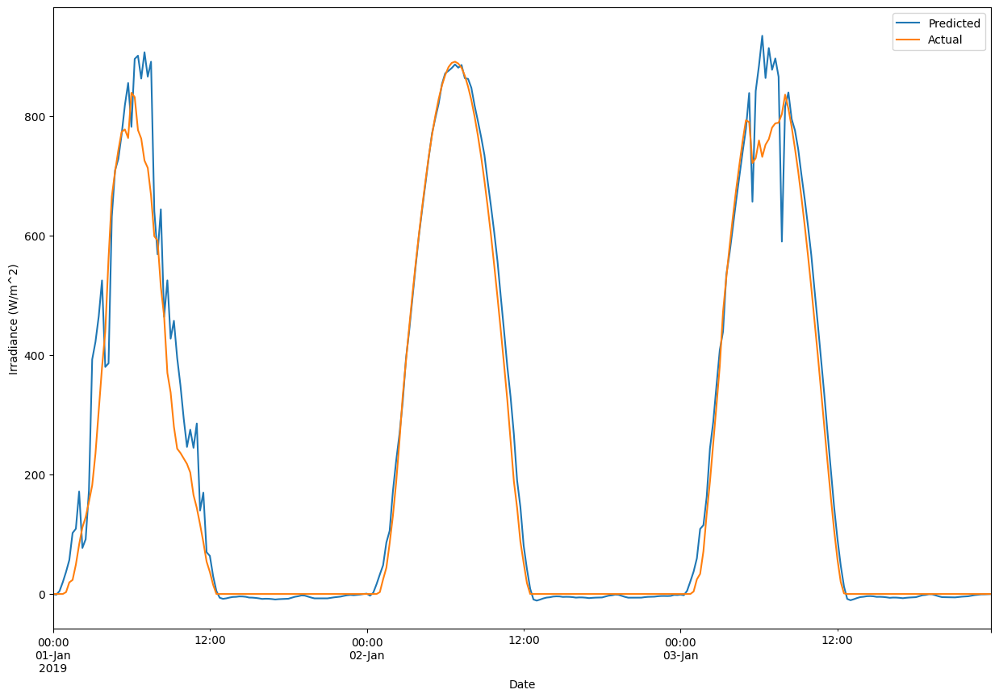

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

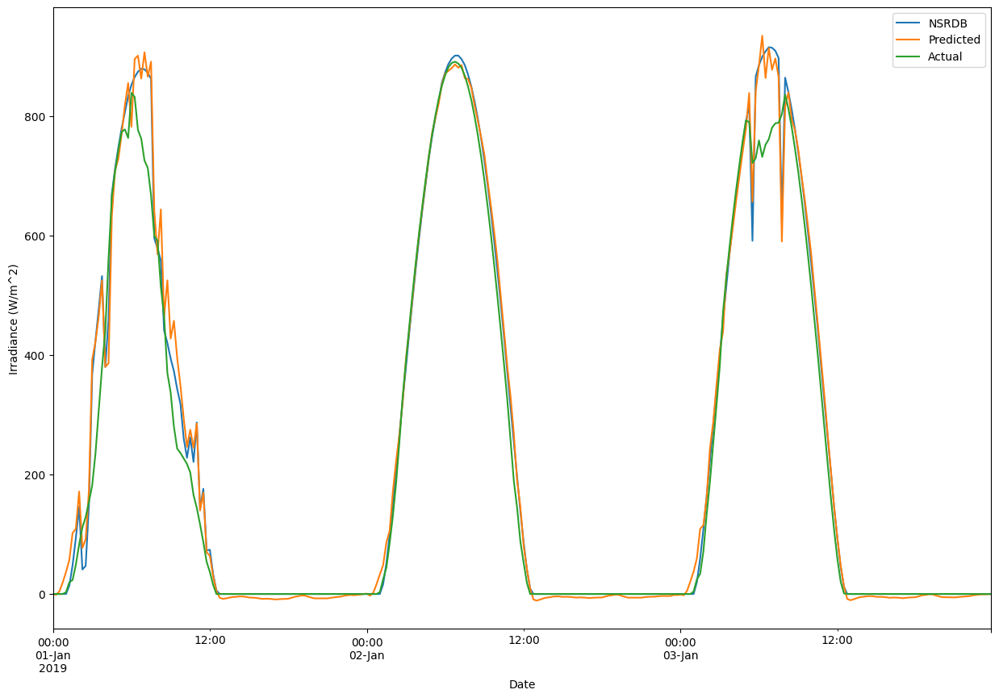

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_12

In [ ]:
s2_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S2_12.h5.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9893156866844508
Root Mean Sqaured Error 31.153238
Mean Absolute Error 14.754779


Text(0, 0.5, 'Irradiance (W/m^2)')

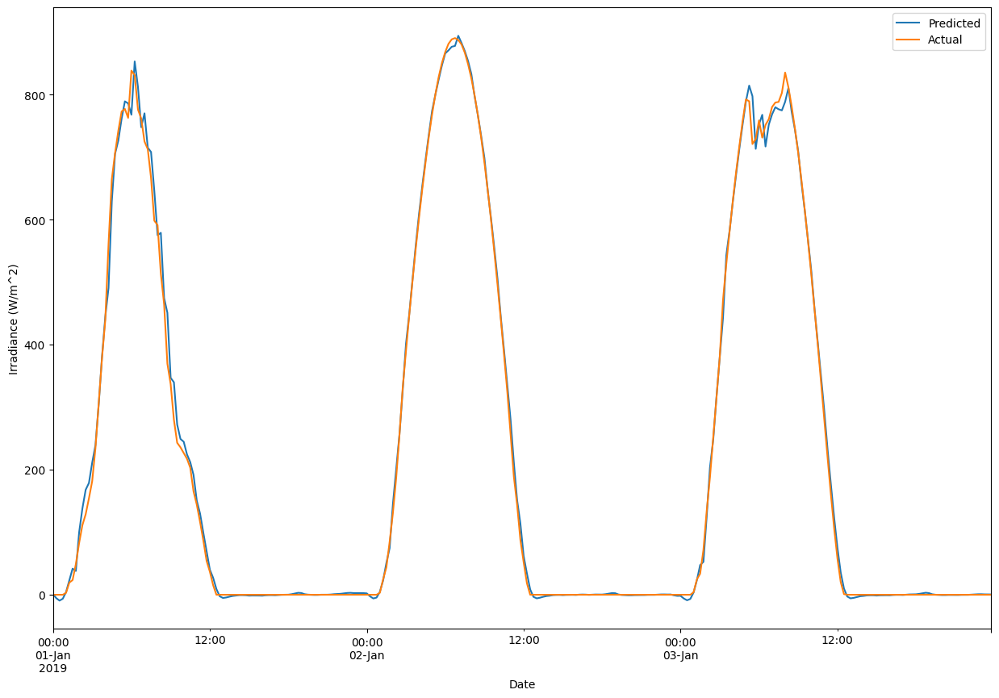

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s2_12.predict(kam_val_x))
print("r2_Score",r2_score(s2_12.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

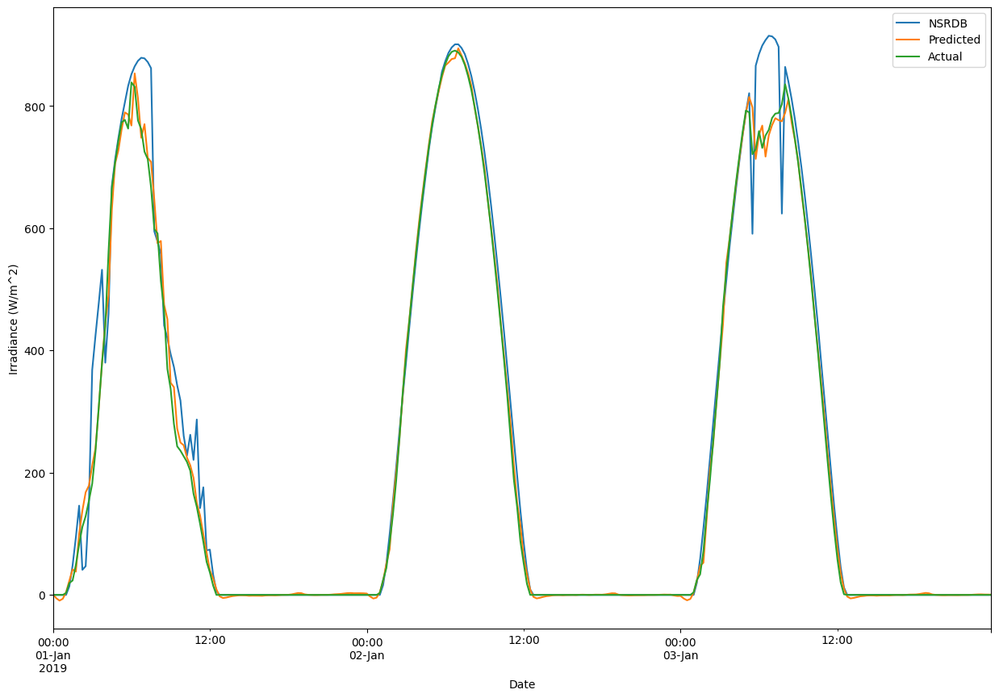

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.9885230354357911
Root Mean Sqaured Error 31.15323945991089
Mean Absolute Error 14.75477815504036


Text(0, 0.5, 'Irradiance (W/m^2)')

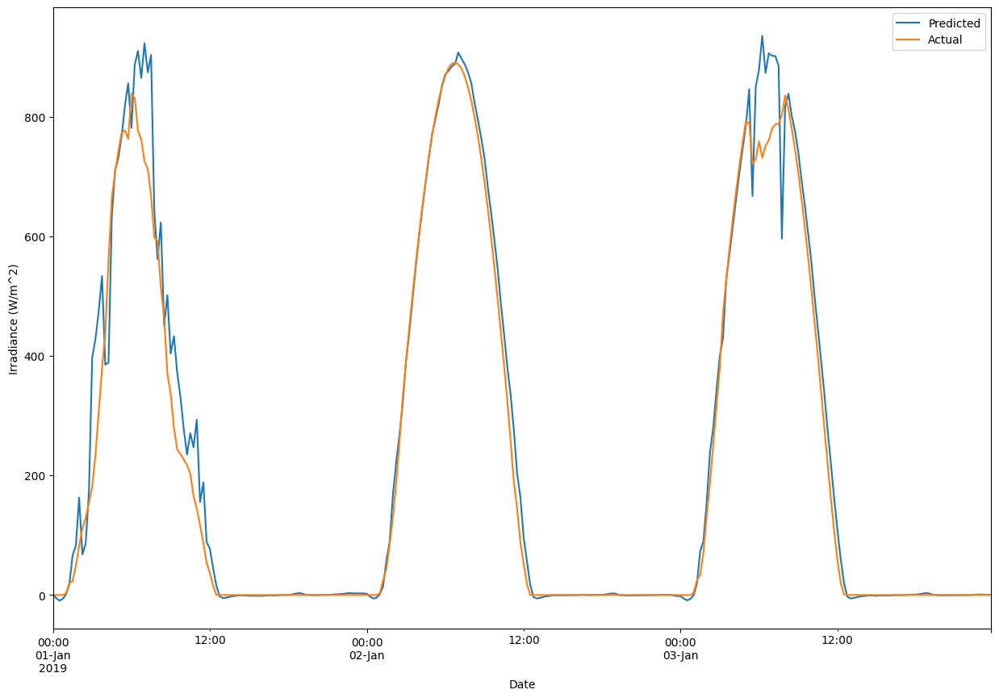

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

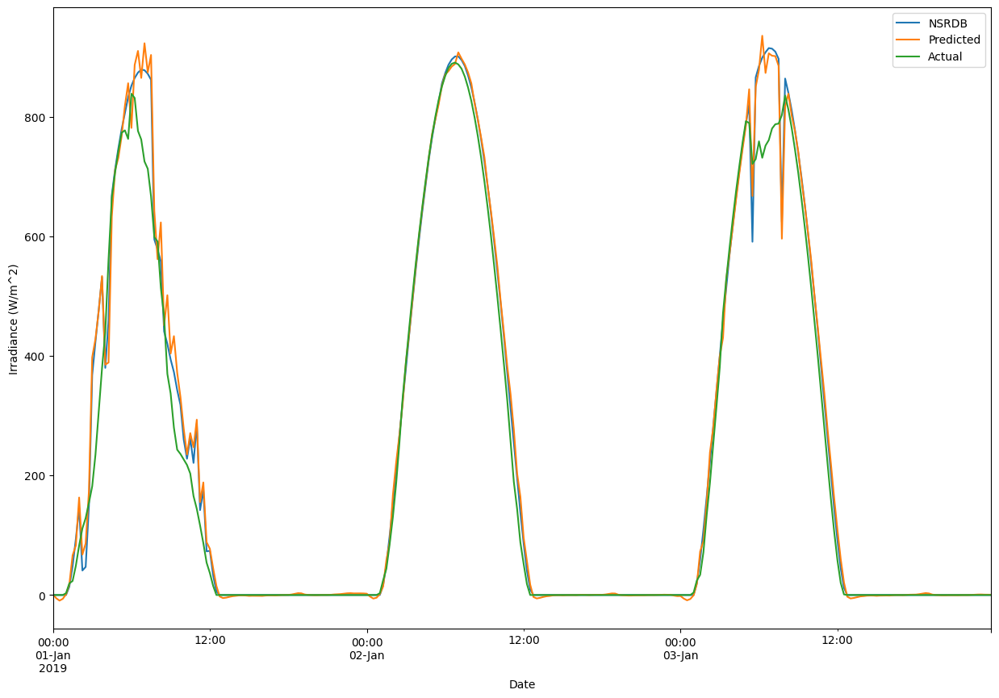

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S3_4.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9866471326694524
Root Mean Sqaured Error 35.97352
Mean Absolute Error 23.884155


Text(0, 0.5, 'Irradiance (W/m^2)')

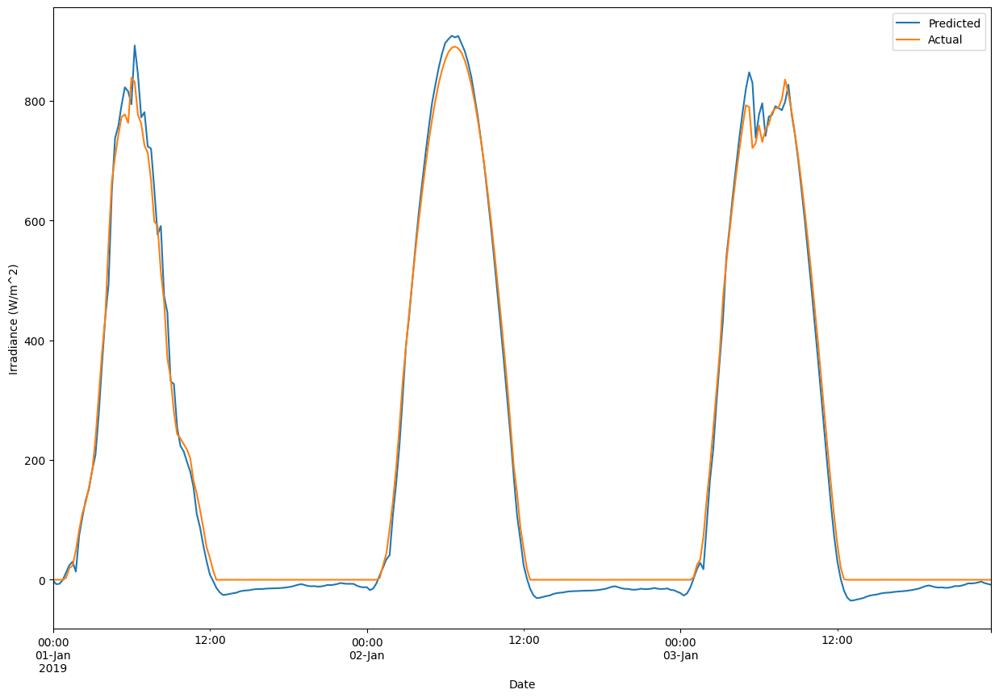

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(kam_val_x))
print("r2_Score",r2_score(s3_4.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

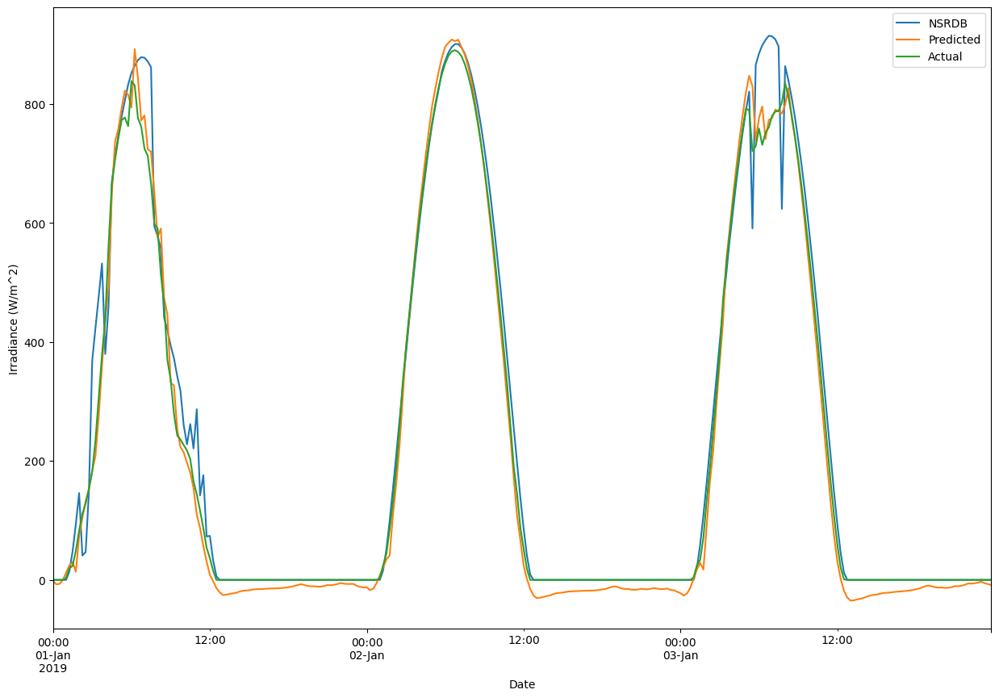

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.9846966516725398
Root Mean Sqaured Error 35.973519107969885
Mean Absolute Error 23.88415431078315


Text(0, 0.5, 'Irradiance (W/m^2)')

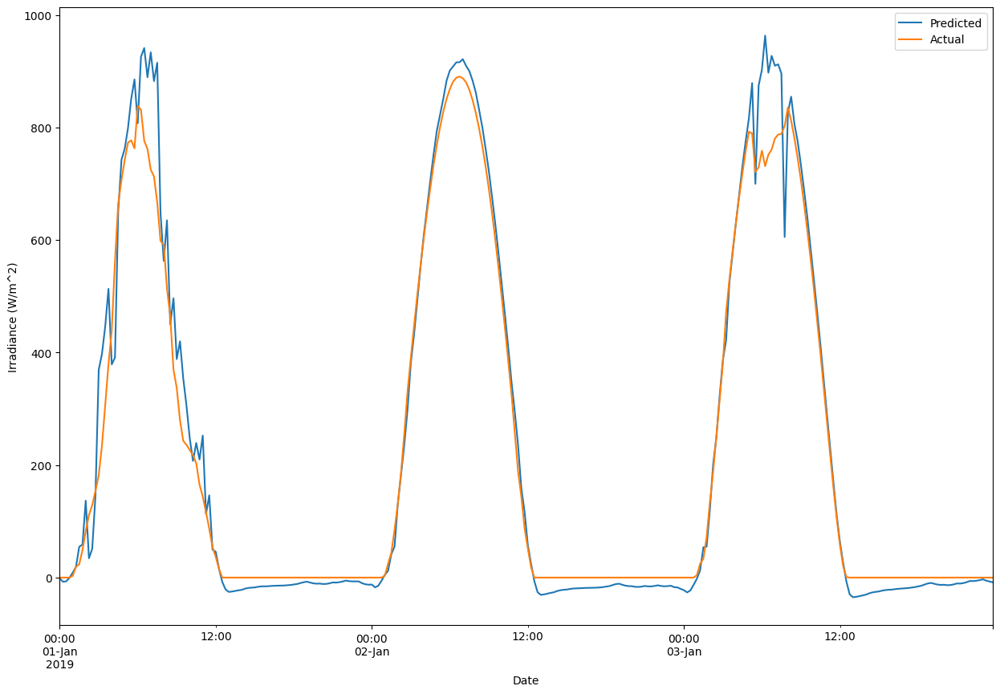

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

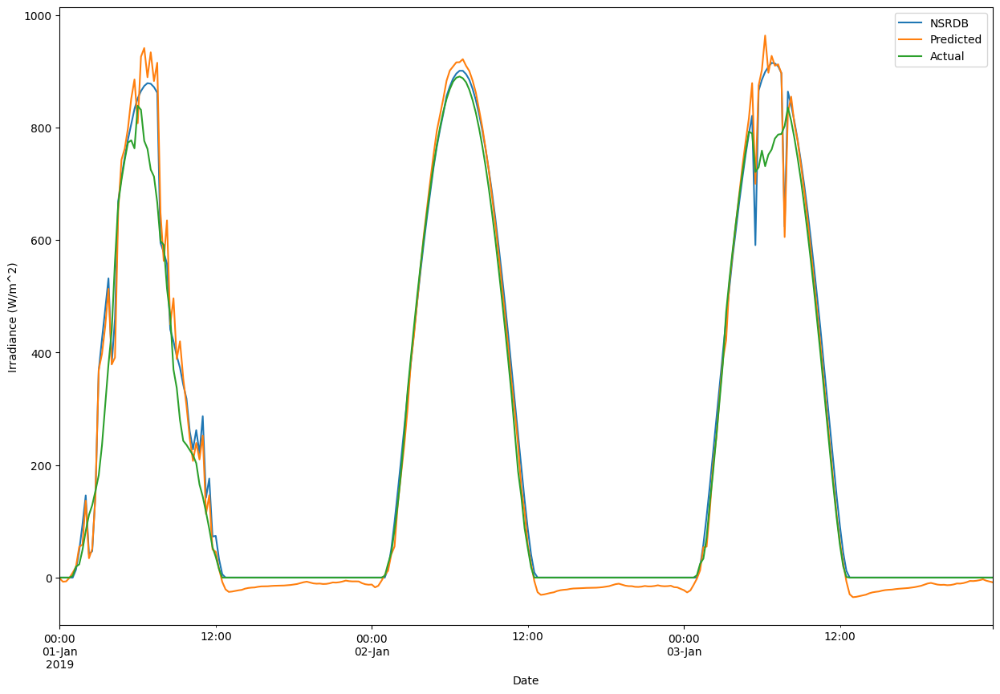

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S3_8.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9874491424630323
Root Mean Sqaured Error 33.32287
Mean Absolute Error 18.092712


Text(0, 0.5, 'Irradiance (W/m^2)')

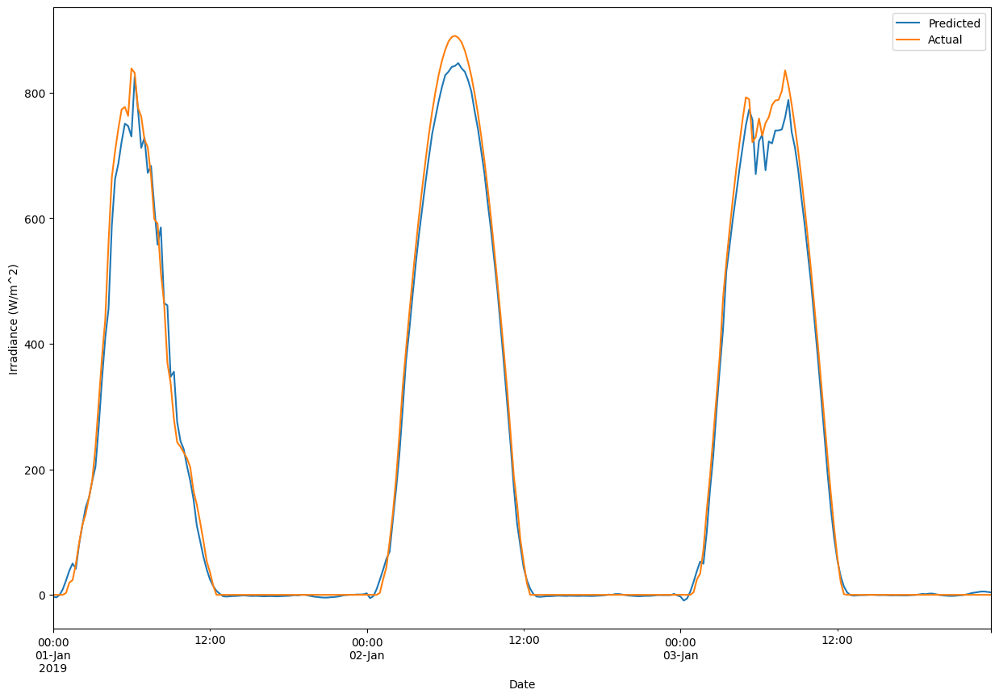

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(kam_val_x))
print("r2_Score",r2_score(s3_8.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

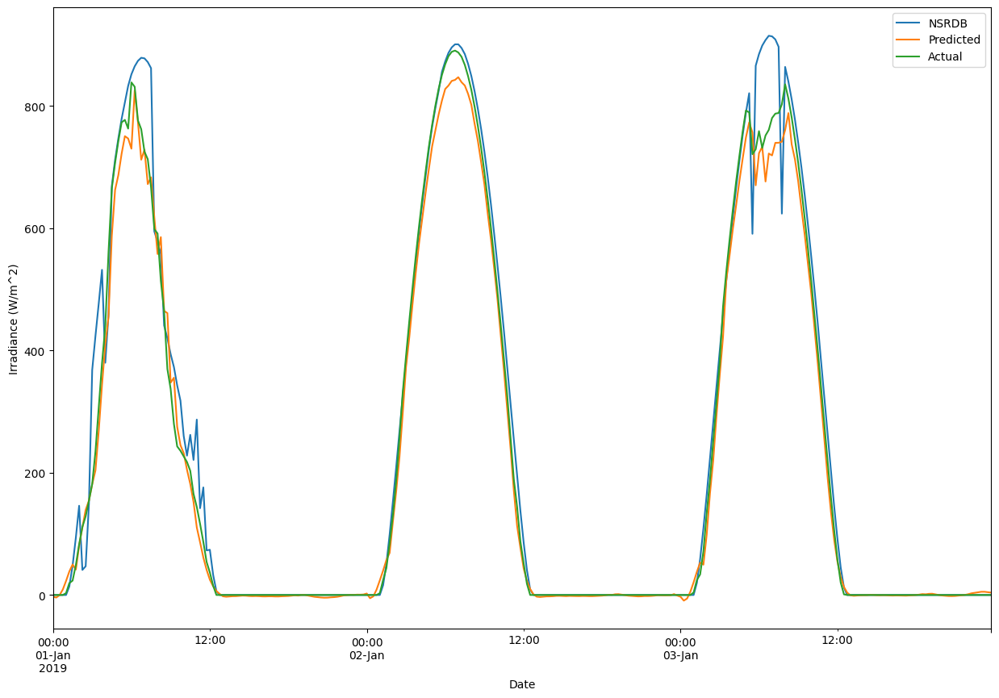

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.986868771651866
Root Mean Sqaured Error 33.3228677699583
Mean Absolute Error 18.092712646549714


Text(0, 0.5, 'Irradiance (W/m^2)')

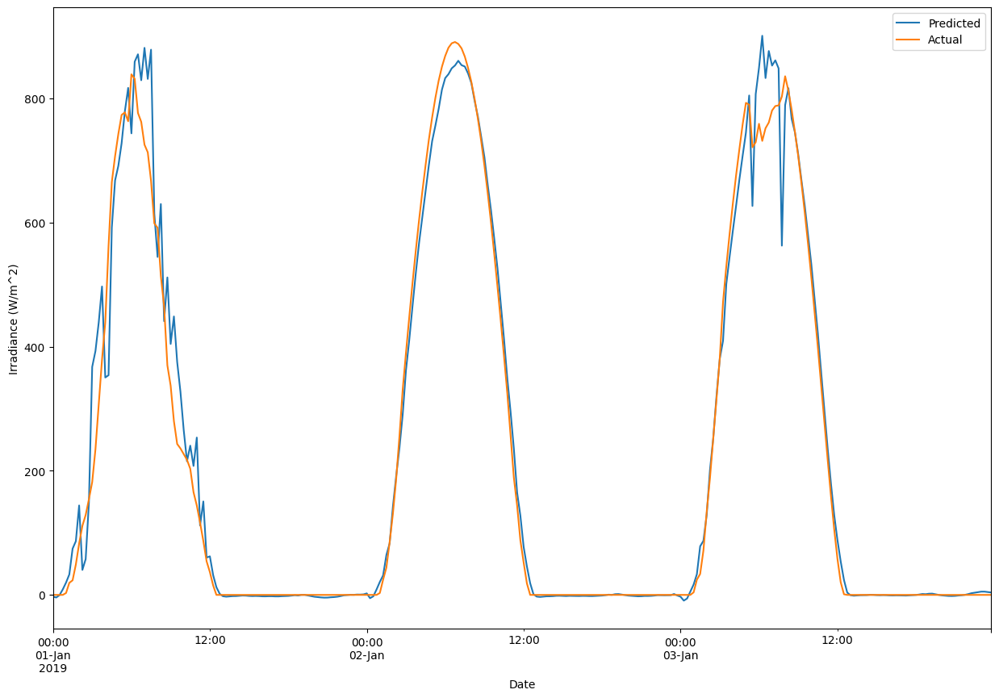

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

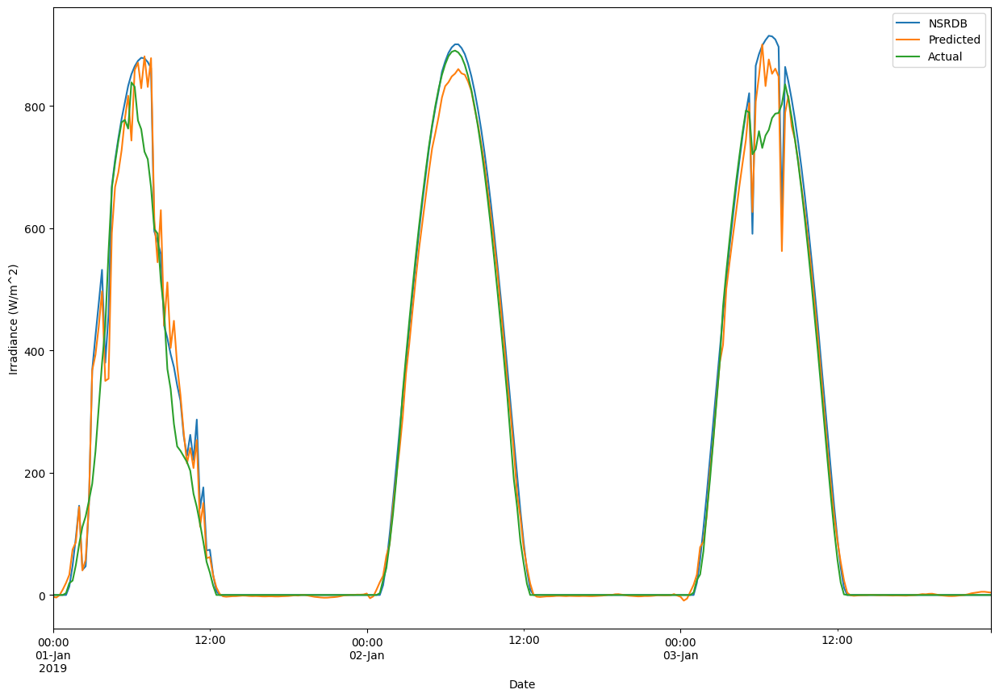

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Kamuthi Solar Park/S3_12.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9891630946799255
Root Mean Sqaured Error 31.331984
Mean Absolute Error 15.694237


Text(0, 0.5, 'Irradiance (W/m^2)')

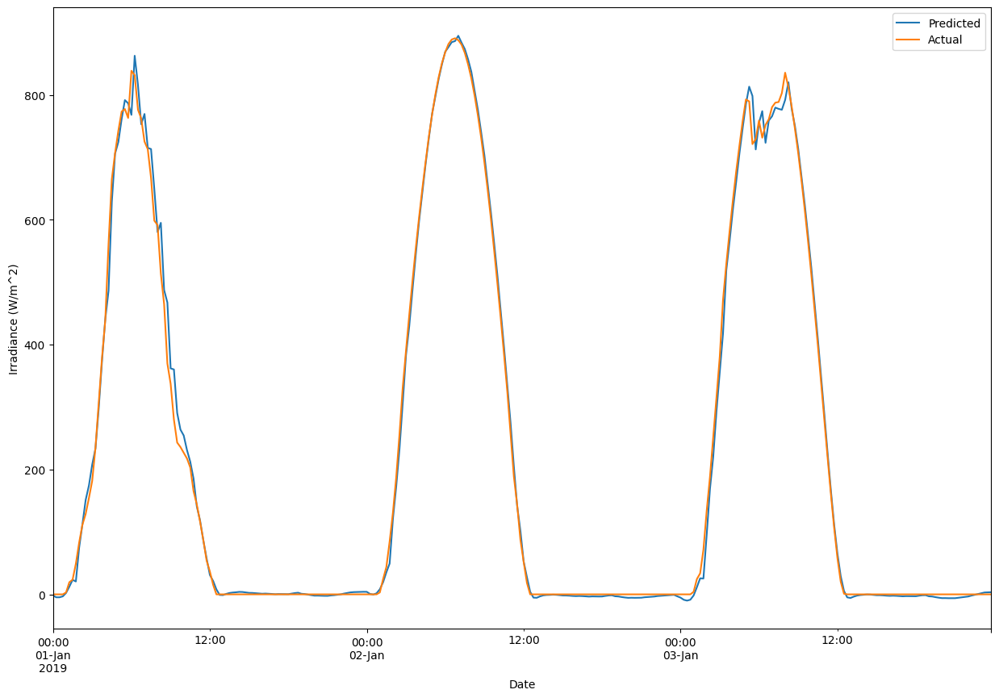

In [ ]:
df_date_kam_val['Actual']=scaler_y.inverse_transform(kam_val_y)
df_date_kam_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(kam_val_x))
print("r2_Score",r2_score(s3_12.predict(kam_val_x),kam_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['Actual'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['NSRDB']=kam_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

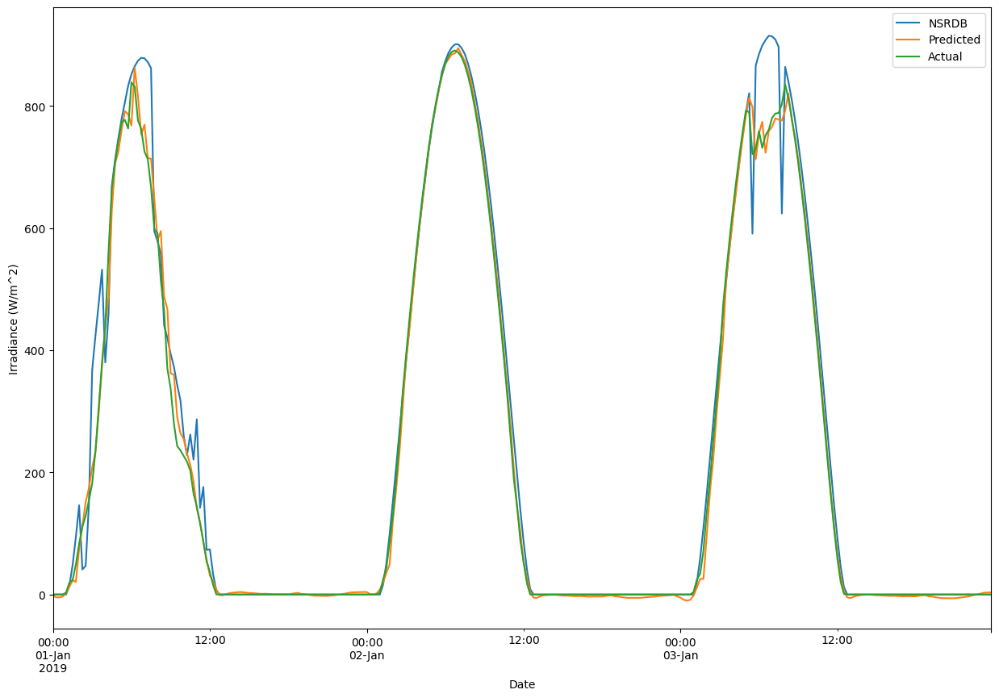

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_kam_val['Error']=df_date_kam_val['Actual']-df_date_kam_val['NSRDB']

In [ ]:
df_date_kam_val['Predicted']=df_date_kam_val['Predicted']- df_date_kam_val['Error']

r2_Score 0.9883909581244238
Root Mean Sqaured Error 31.33198297132597
Mean Absolute Error 15.694235494378773


Text(0, 0.5, 'Irradiance (W/m^2)')

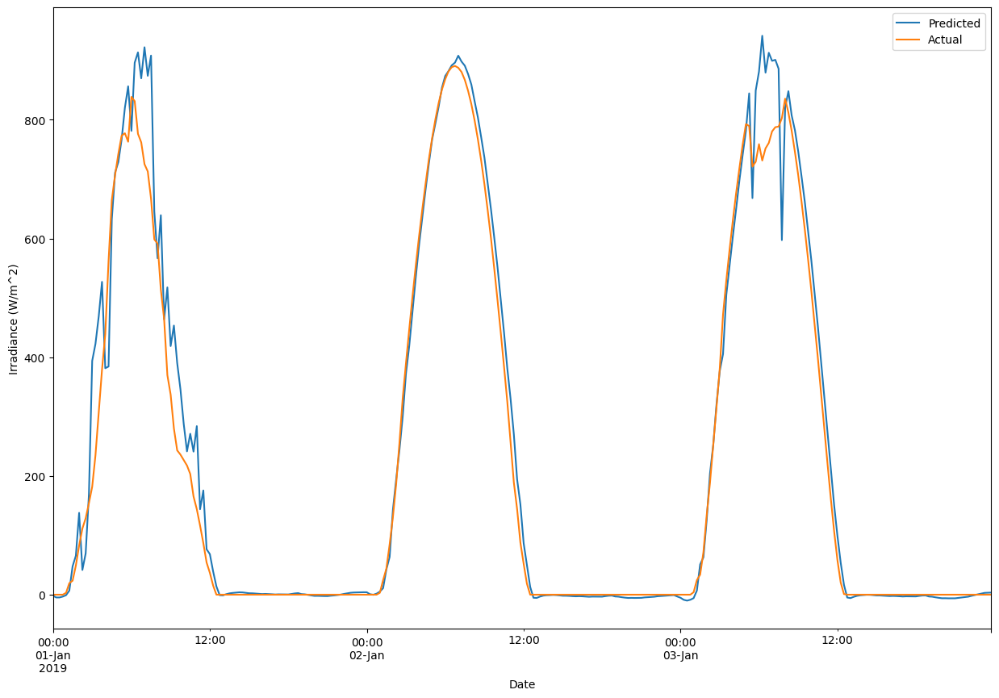

In [ ]:
print("r2_Score",r2_score(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_kam_val['NSRDB'],df_date_kam_val['Predicted']))
df_date_kam_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

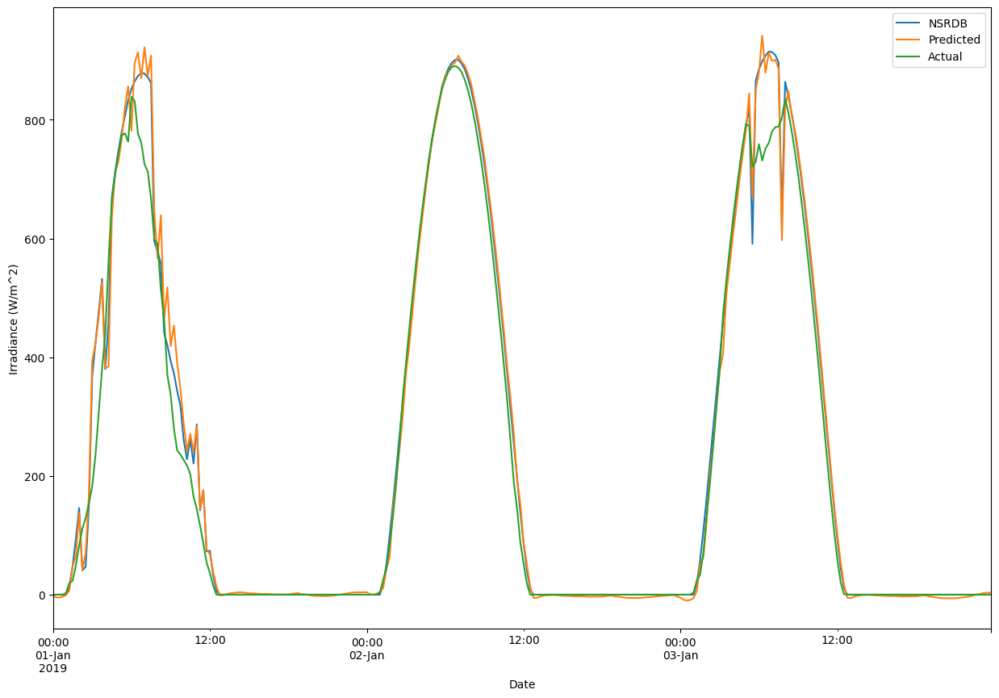

In [ ]:
df_date_kam_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# MAN

# S1 validation

## s1_4

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S1_4.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9920113567380817
Root Mean Sqaured Error 26.333466
Mean Absolute Error 13.570116


Text(0, 0.5, 'Irradiance (W/m^2)')

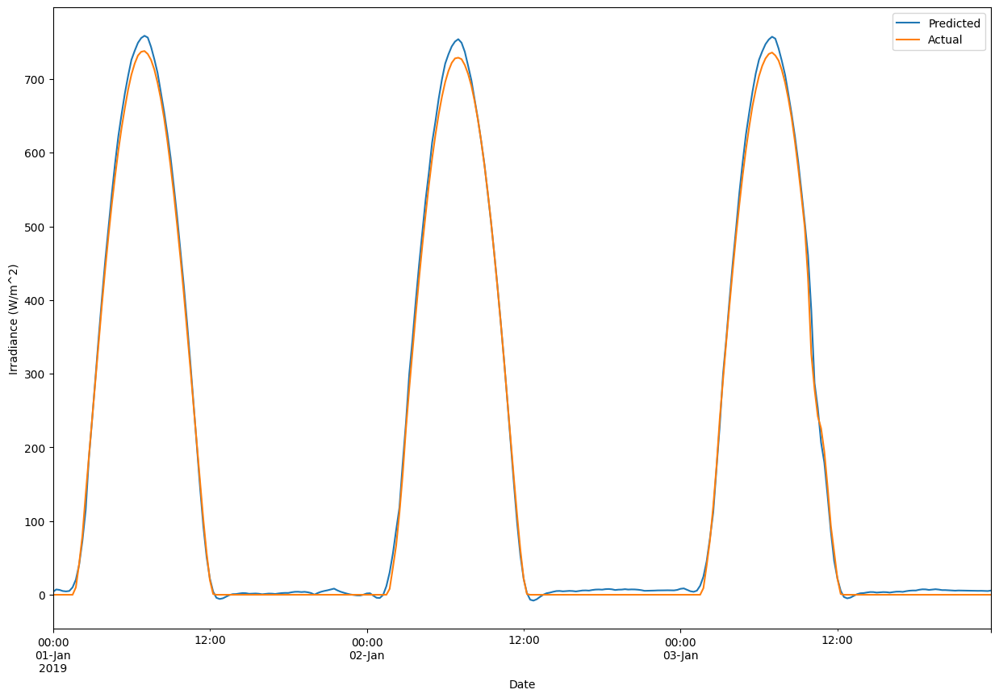

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(man_val_x))
print("r2_Score",r2_score(s1_4.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

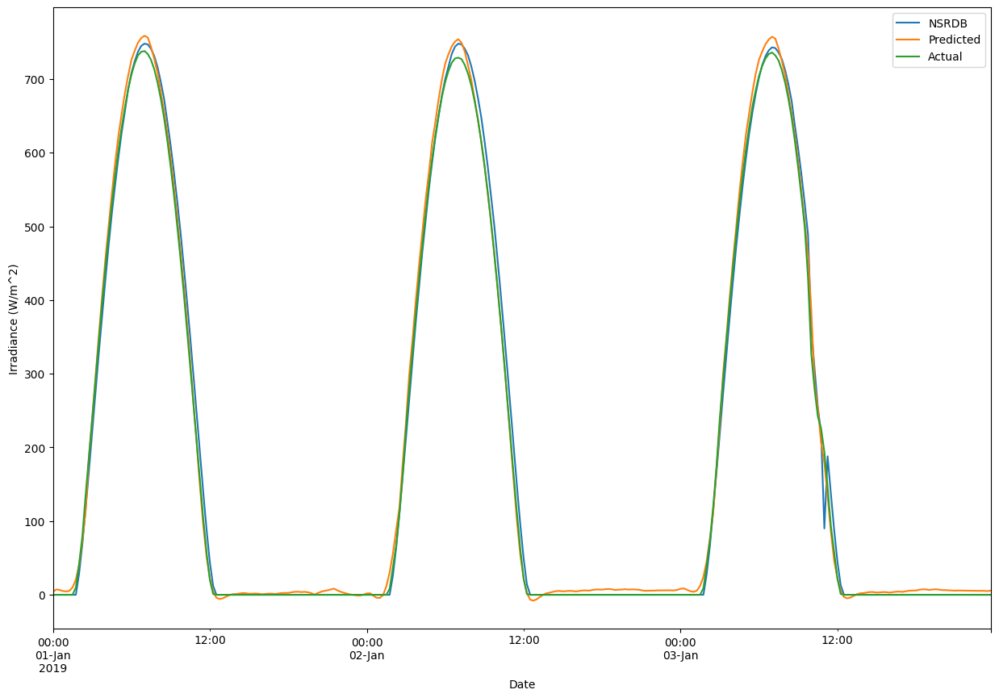

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.9922175343269183
Root Mean Sqaured Error 26.333466359847474
Mean Absolute Error 13.570115995085606


Text(0, 0.5, 'Irradiance (W/m^2)')

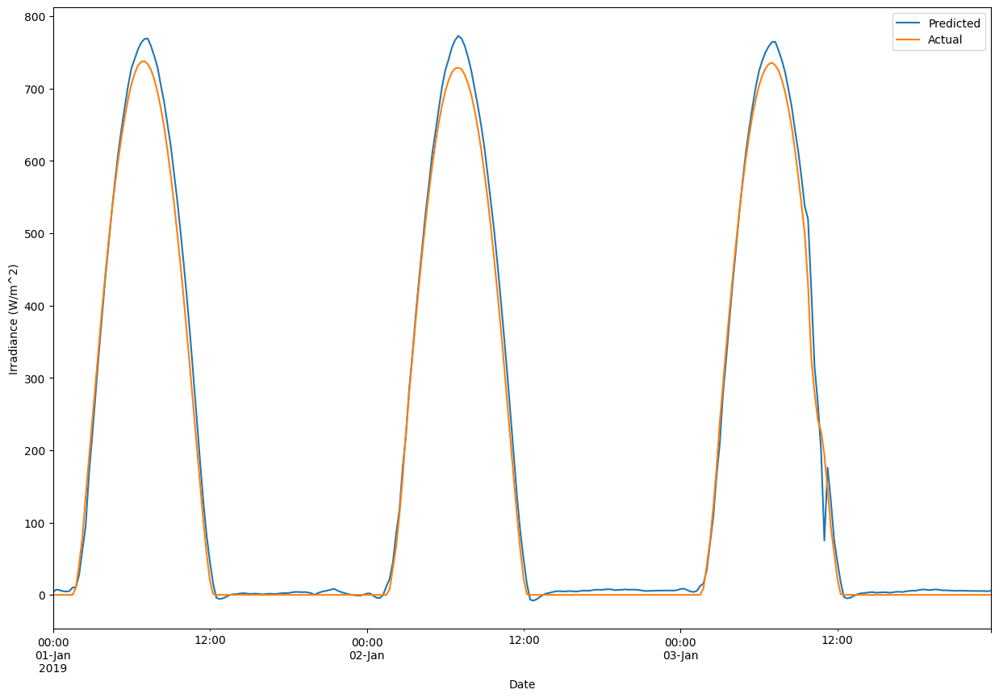

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

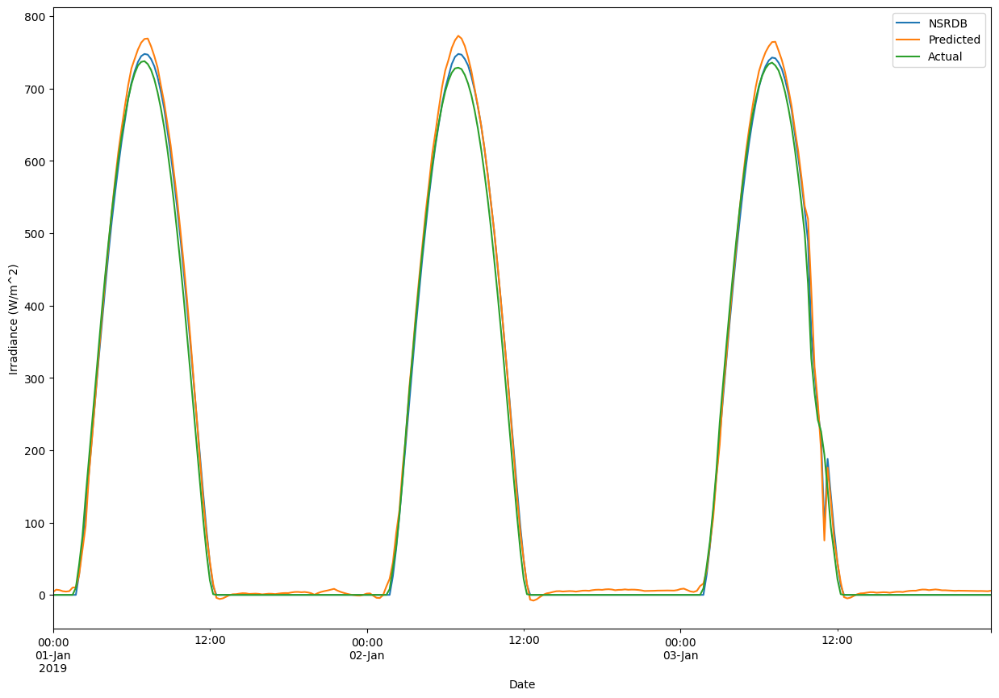

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_8 

In [ ]:
s1_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S1_8.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9923821095400989
Root Mean Sqaured Error 25.454437
Mean Absolute Error 12.7569


Text(0, 0.5, 'Irradiance (W/m^2)')

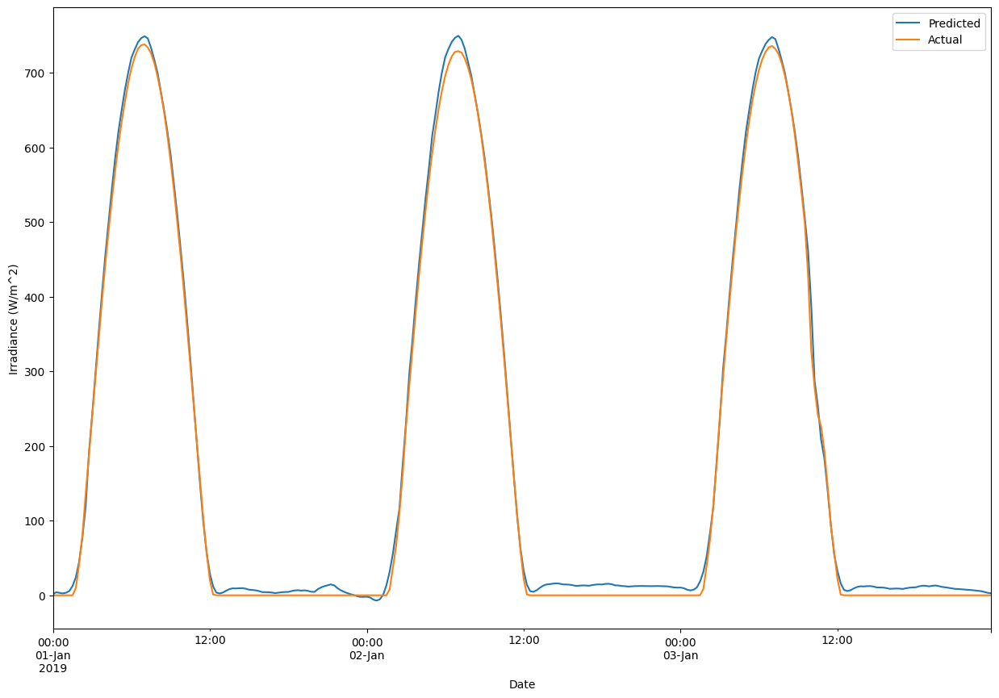

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s1_4.predict(man_val_x))
print("r2_Score",r2_score(s1_4.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

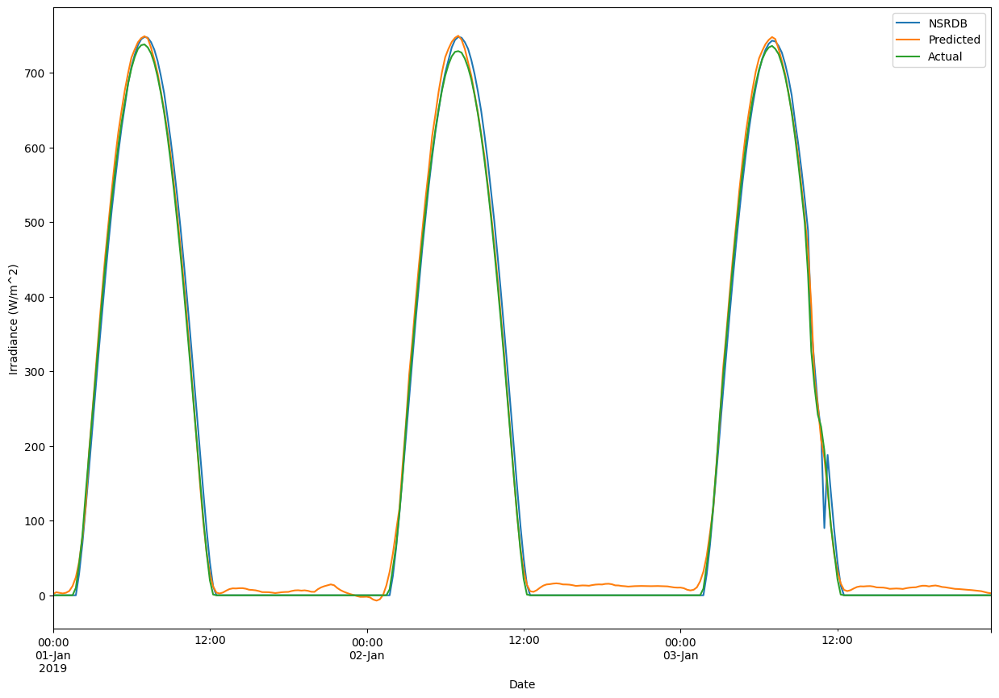

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.992728429954879
Root Mean Sqaured Error 25.45443839280057
Mean Absolute Error 12.756899400563384


Text(0, 0.5, 'Irradiance (W/m^2)')

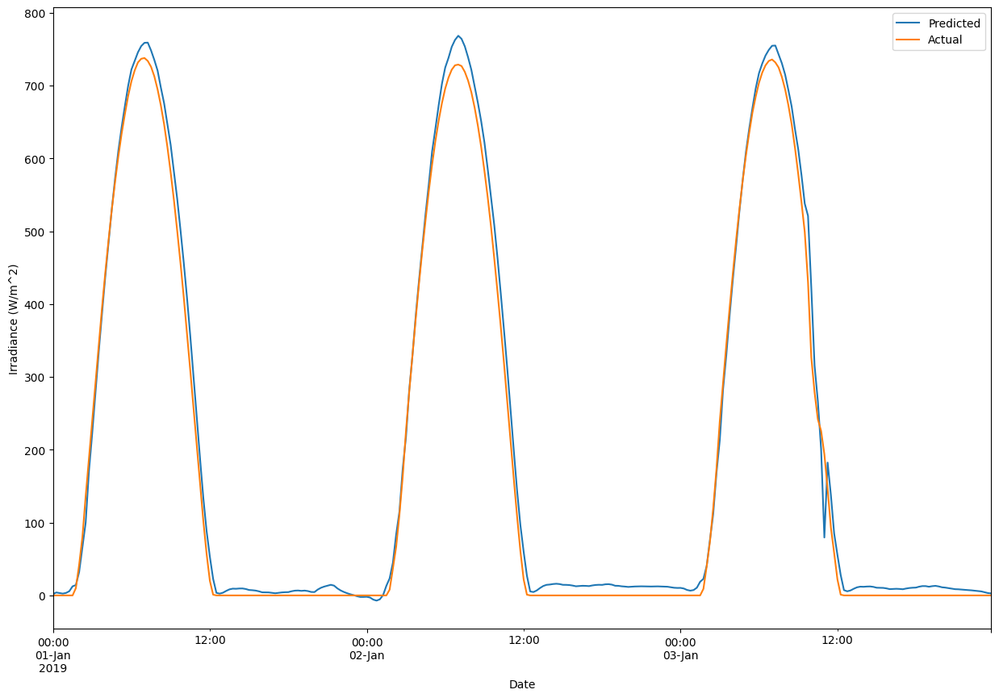

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

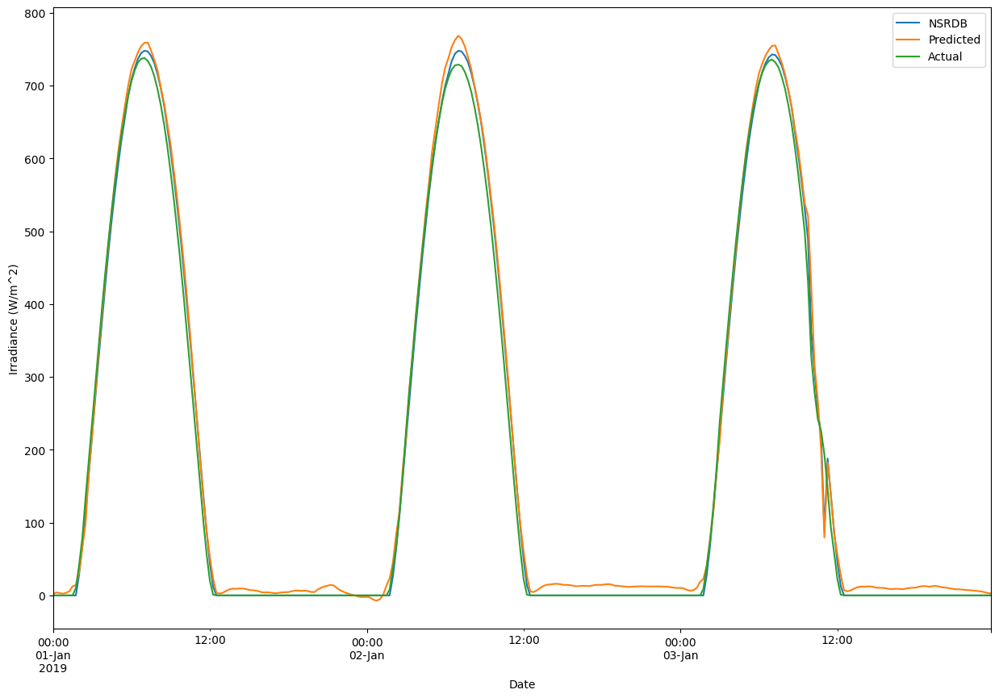

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S1_12

In [ ]:
s1_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s1_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S1_12.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9922663492055306
Root Mean Sqaured Error 25.56976
Mean Absolute Error 12.859148


Text(0, 0.5, 'Irradiance (W/m^2)')

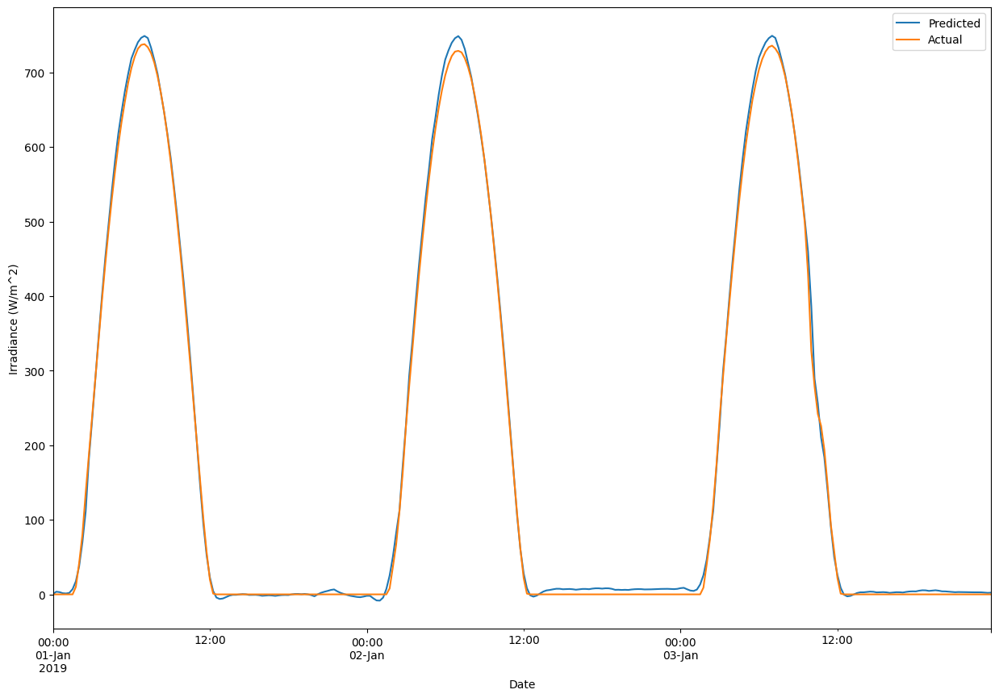

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s1_12.predict(man_val_x))
print("r2_Score",r2_score(s1_12.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

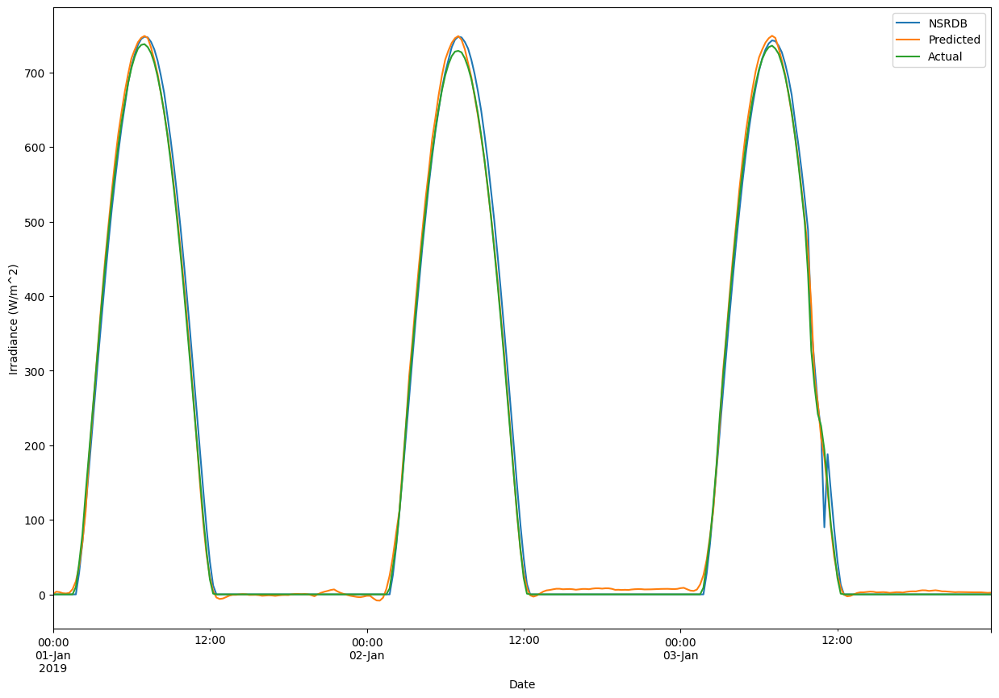

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.9926623931597239
Root Mean Sqaured Error 25.569759459133113
Mean Absolute Error 12.859149026617285


Text(0, 0.5, 'Irradiance (W/m^2)')

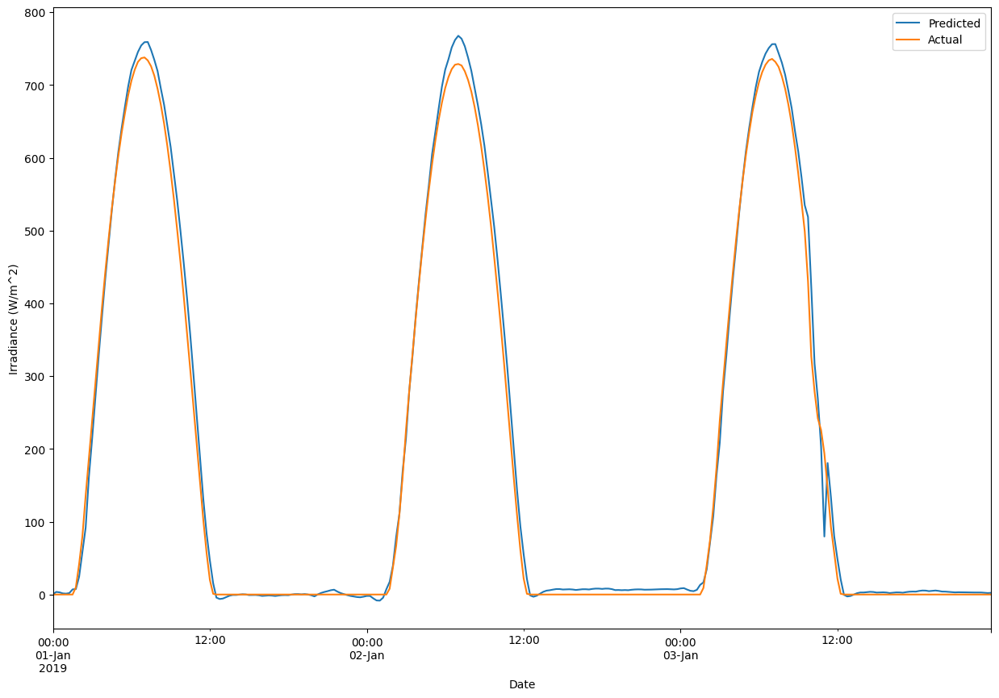

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

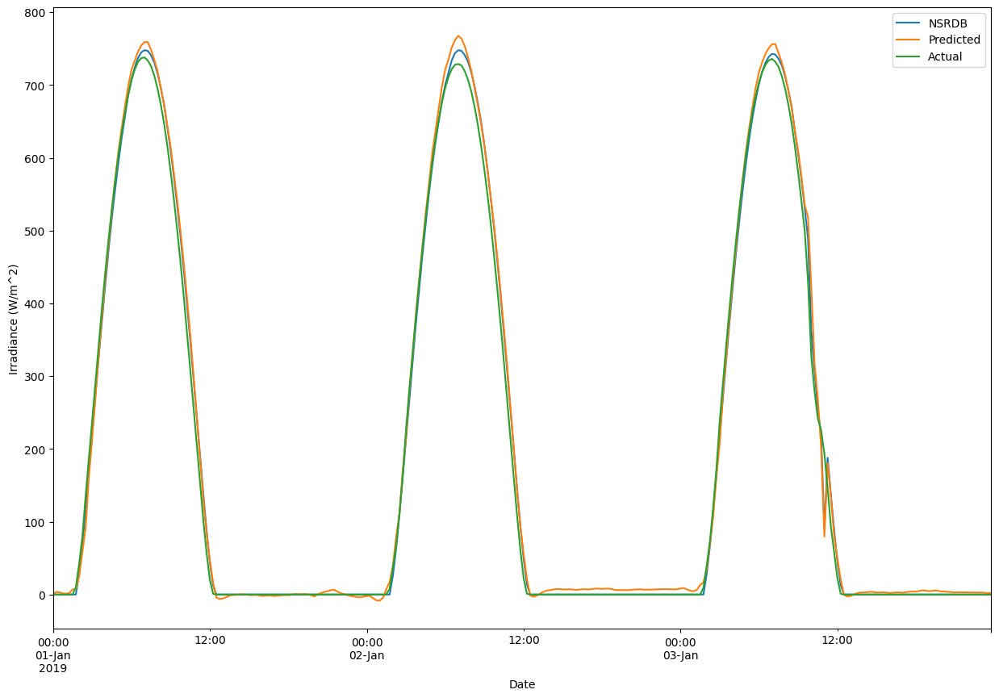

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S2 validation

## S2_4

In [ ]:
s2_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S2_4.h5.h5')

1095/1095 [==============================] - 9s 9ms/step
r2_Score 0.9916383425546045
Root Mean Sqaured Error 26.725597
Mean Absolute Error 13.468525


Text(0, 0.5, 'Irradiance (W/m^2)')

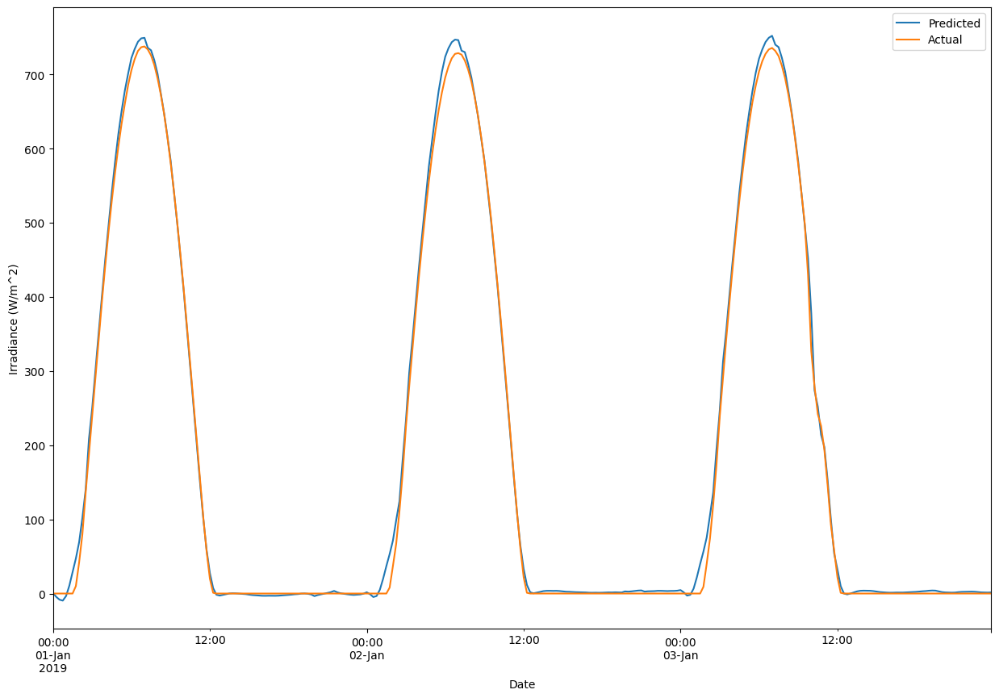

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s2_4.predict(man_val_x))
print("r2_Score",r2_score(s2_4.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

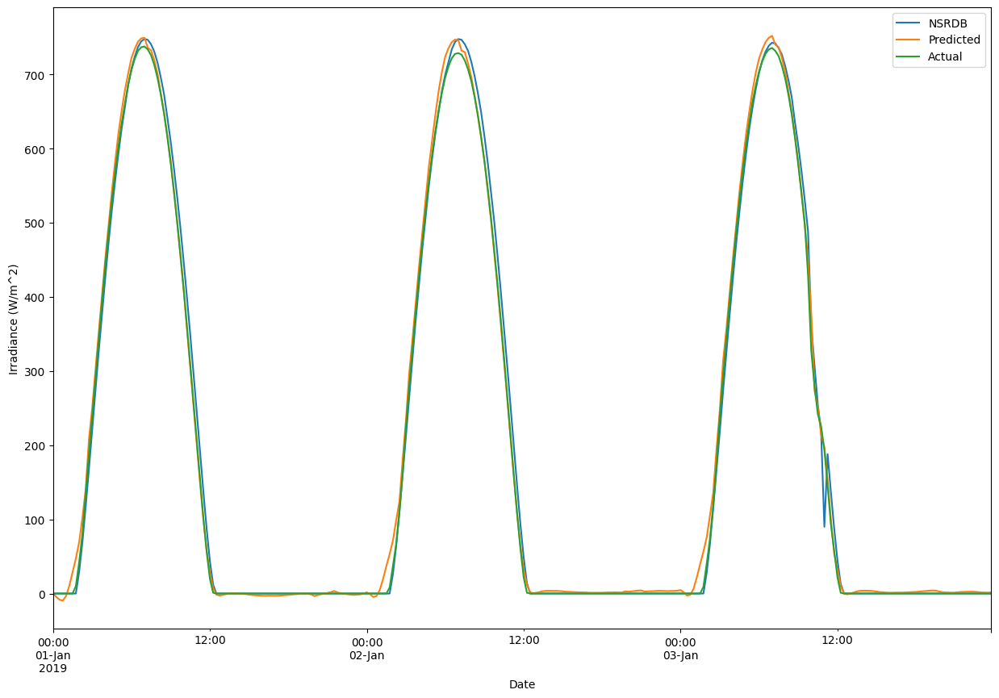

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.9919840324956336
Root Mean Sqaured Error 26.72559590701678
Mean Absolute Error 13.468525022884393


Text(0, 0.5, 'Irradiance (W/m^2)')

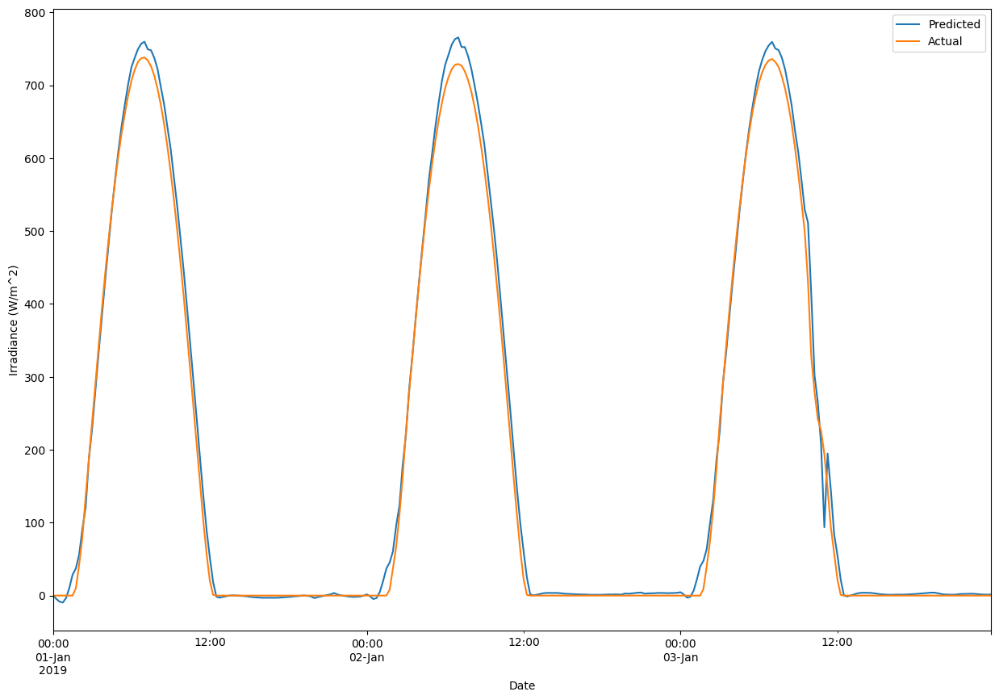

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

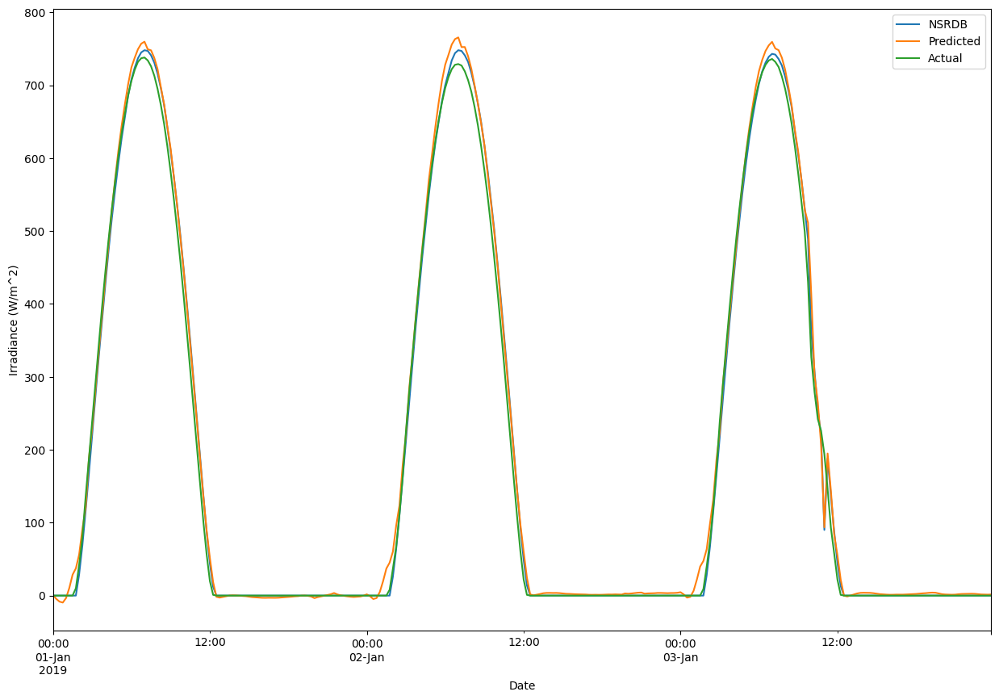

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_8 

In [ ]:
s2_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s2_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S2_8.h5.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9922213646345001
Root Mean Sqaured Error 25.659067
Mean Absolute Error 12.322017


Text(0, 0.5, 'Irradiance (W/m^2)')

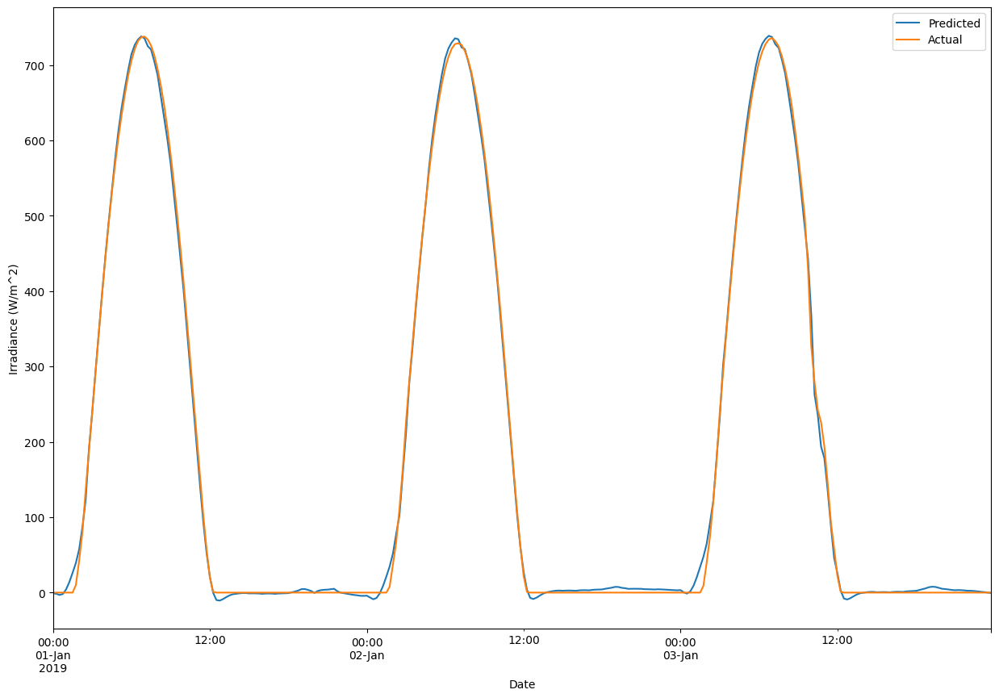

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s2_8.predict(man_val_x))
print("r2_Score",r2_score(s2_8.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

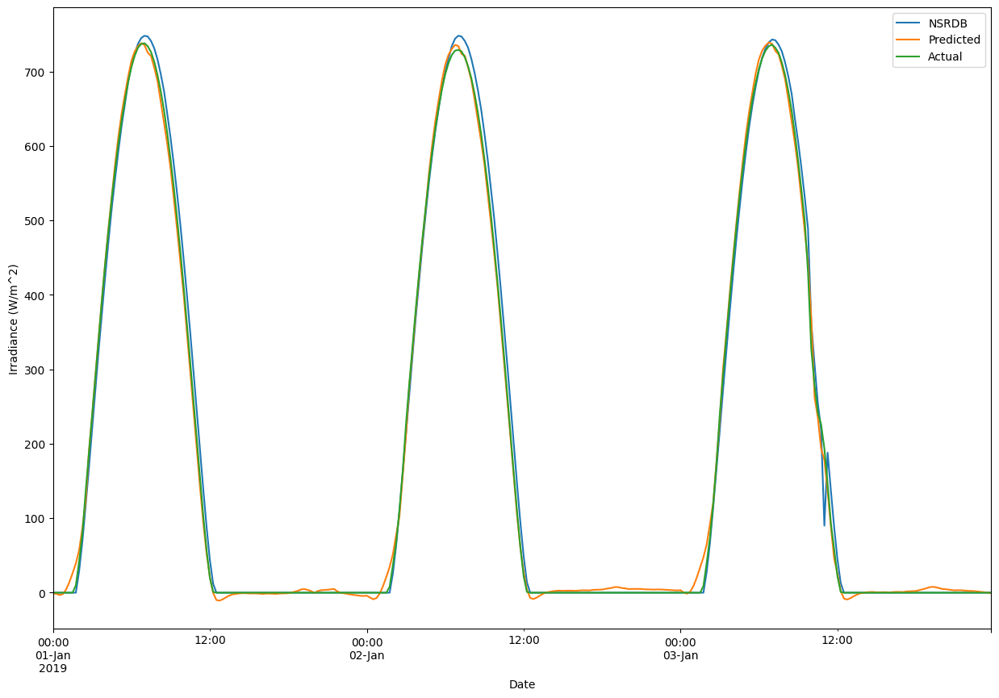

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.9926110487599302
Root Mean Sqaured Error 25.659064822068157
Mean Absolute Error 12.322016909168331


Text(0, 0.5, 'Irradiance (W/m^2)')

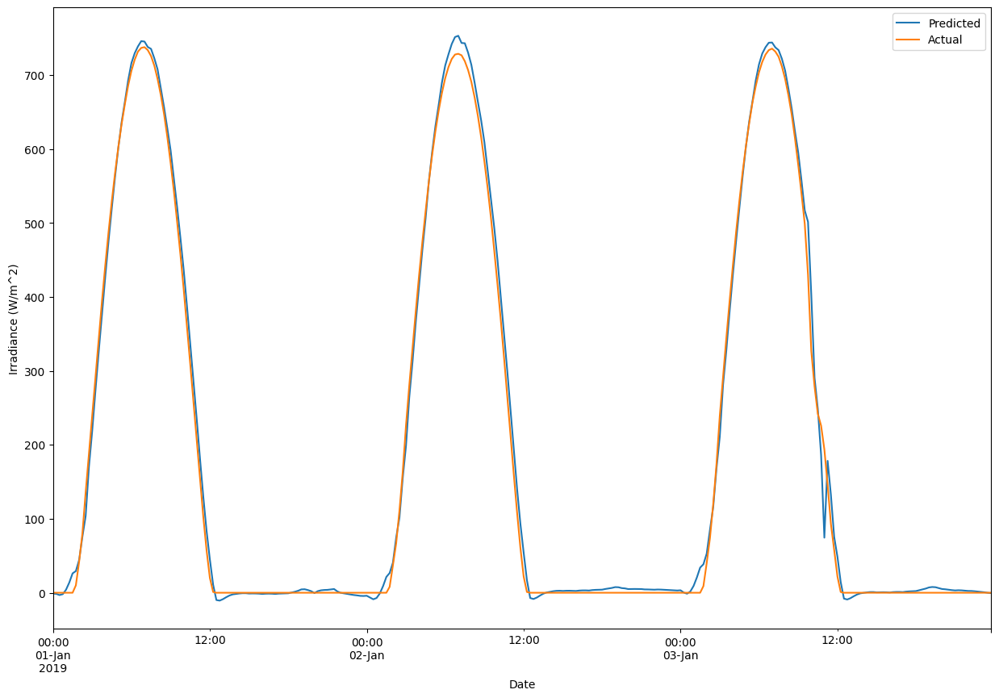

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

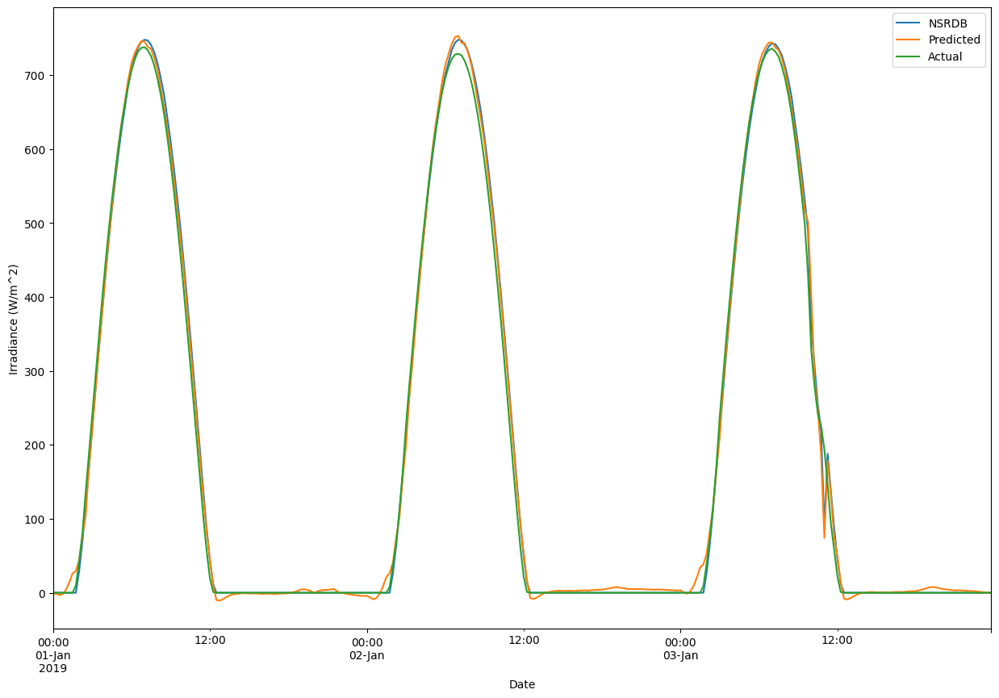

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S2_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S2_12.h5.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9918034817636112
Root Mean Sqaured Error 26.469591
Mean Absolute Error 12.811146


Text(0, 0.5, 'Irradiance (W/m^2)')

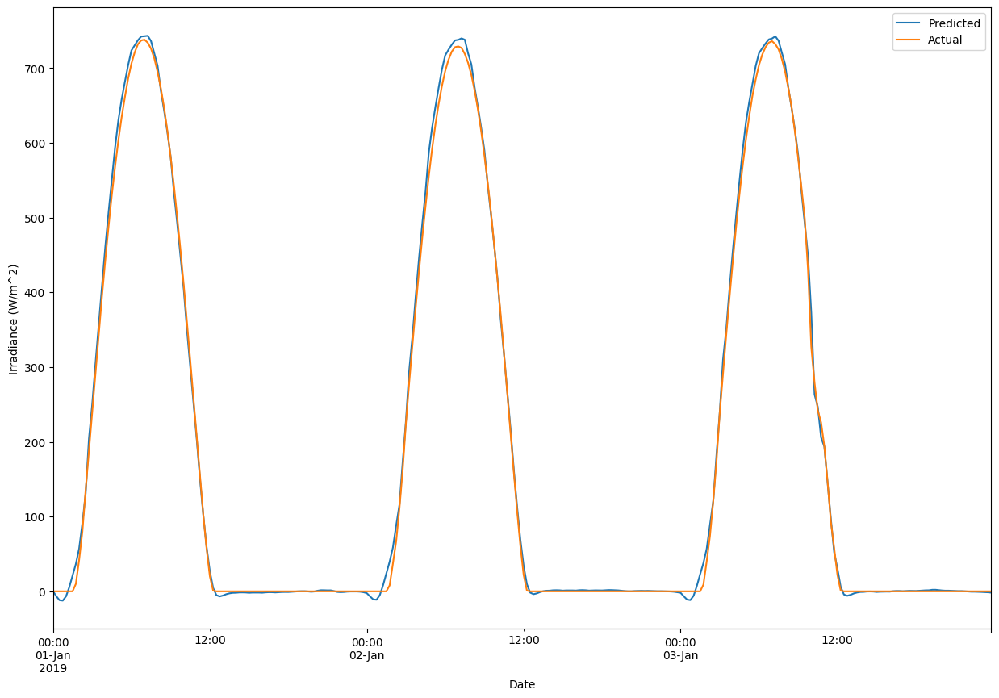

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s2_12.predict(man_val_x))
print("r2_Score",r2_score(s2_12.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

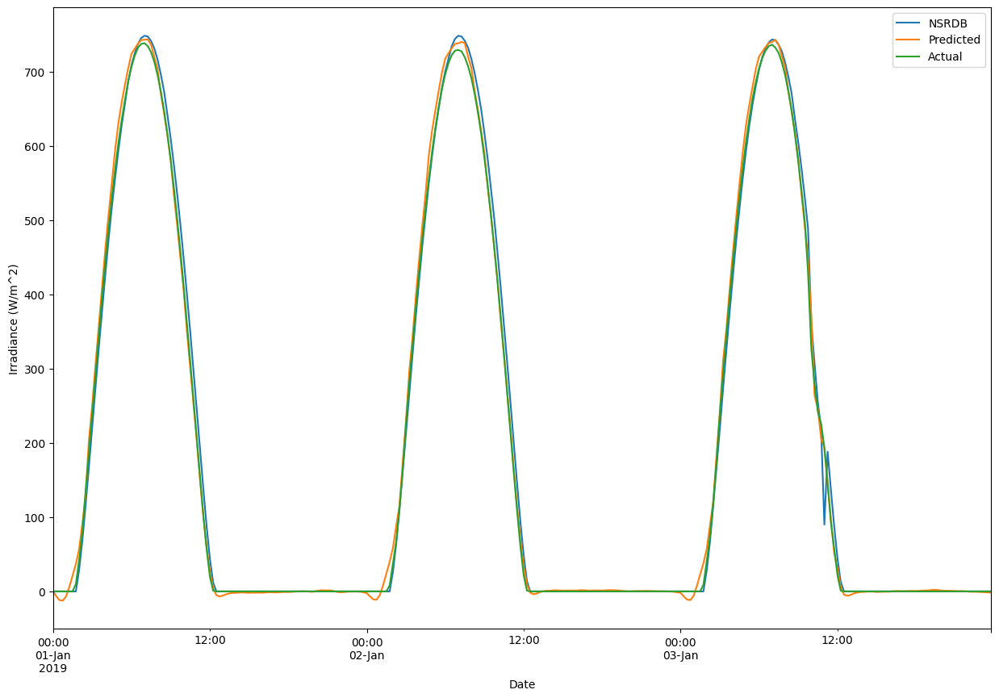

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.9921368671039544
Root Mean Sqaured Error 26.469591043543108
Mean Absolute Error 12.811146532891735


Text(0, 0.5, 'Irradiance (W/m^2)')

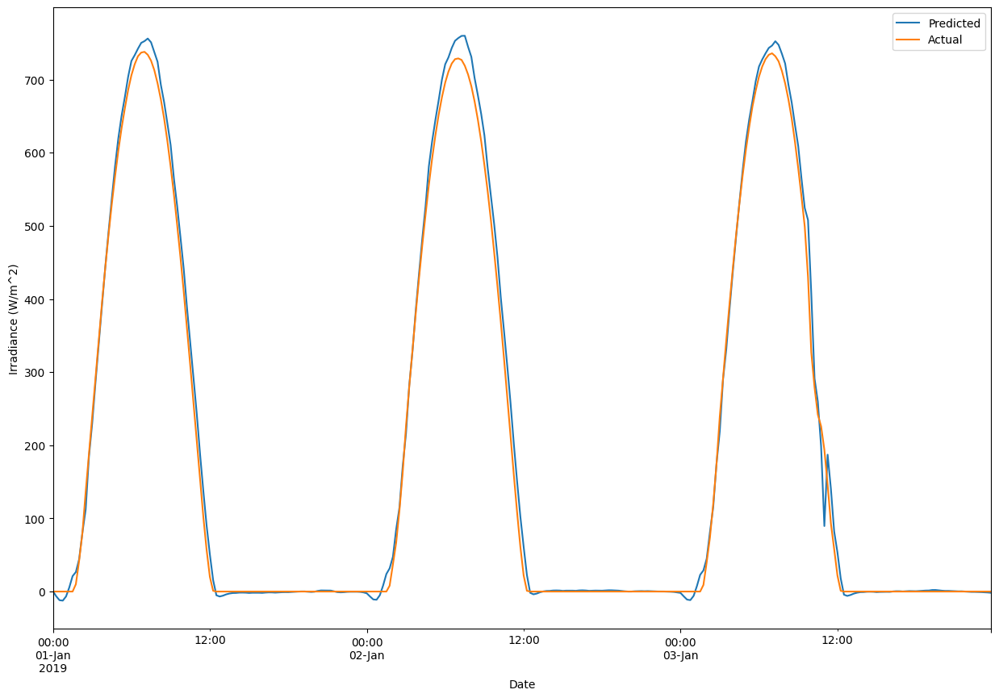

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

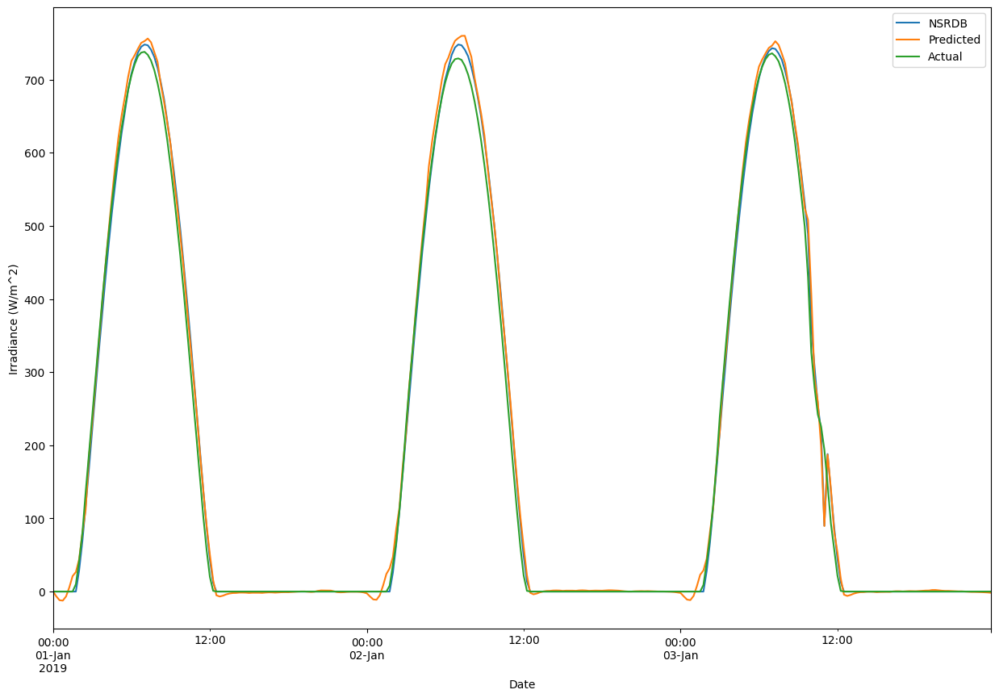

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

# S3 validation

## S3_4

In [ ]:
s3_4=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_4.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S3_4.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9867674524796347
Root Mean Sqaured Error 34.41069
Mean Absolute Error 21.799667


Text(0, 0.5, 'Irradiance (W/m^2)')

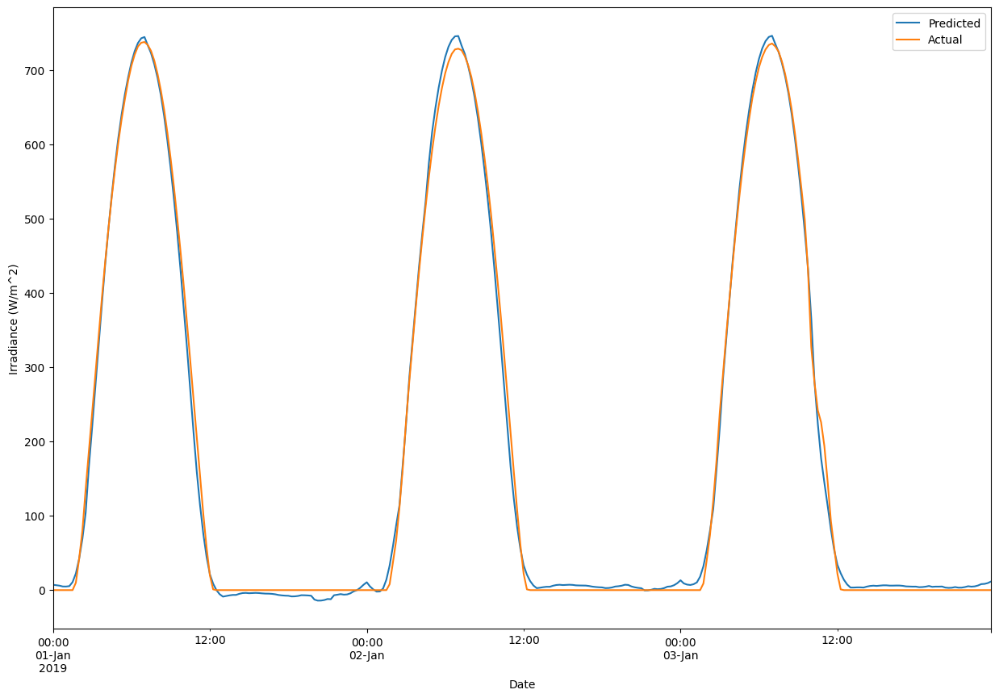

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s3_4.predict(man_val_x))
print("r2_Score",r2_score(s3_4.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

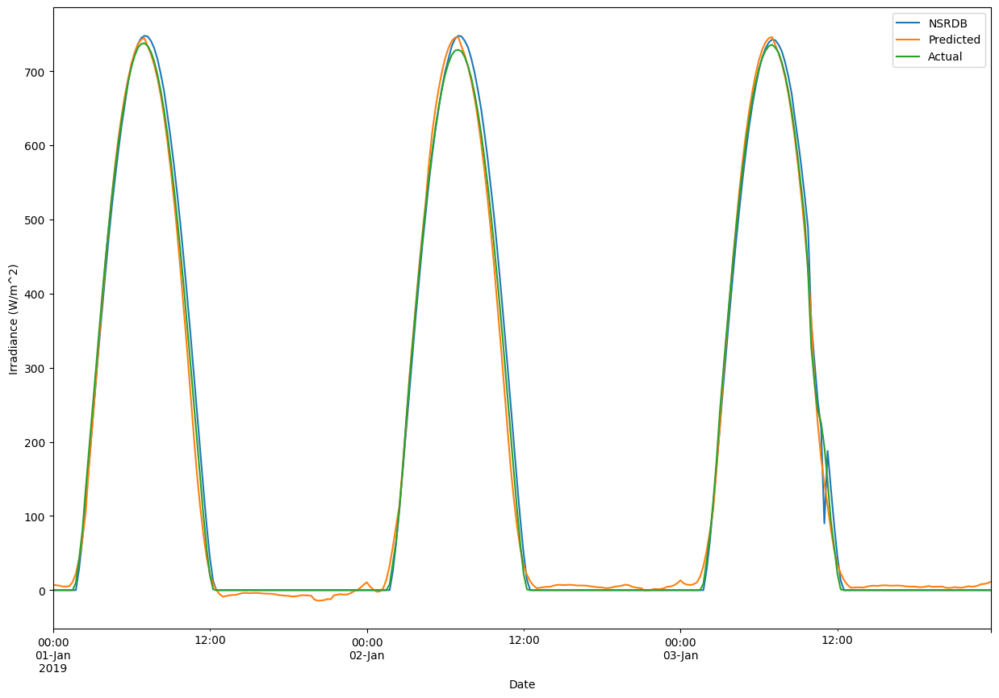

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.9867111330033769
Root Mean Sqaured Error 34.410691569835045
Mean Absolute Error 21.799665833830826


Text(0, 0.5, 'Irradiance (W/m^2)')

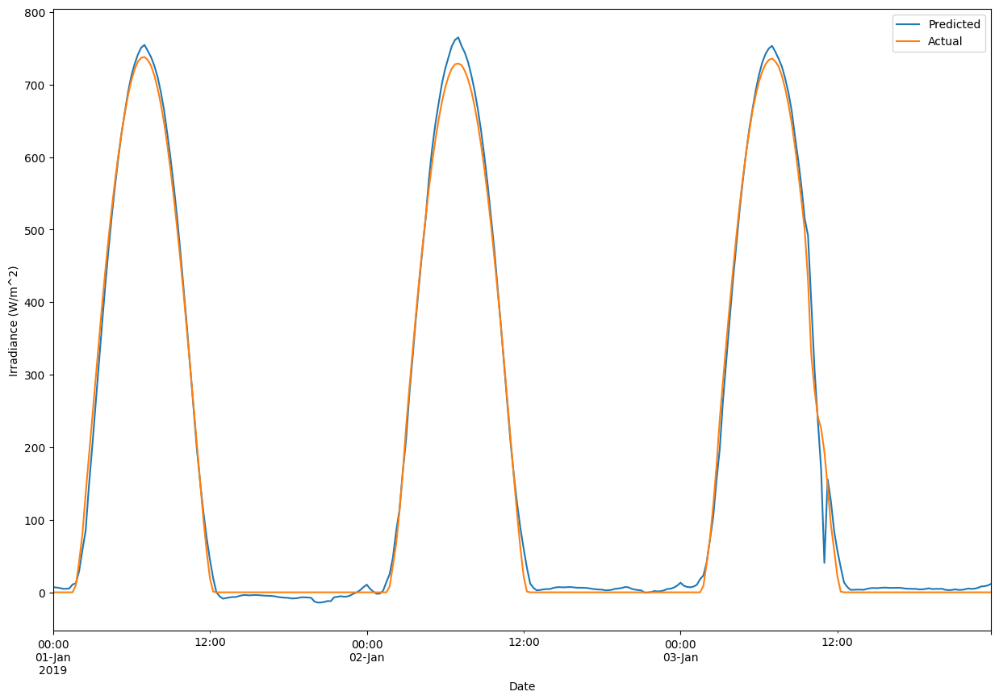

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

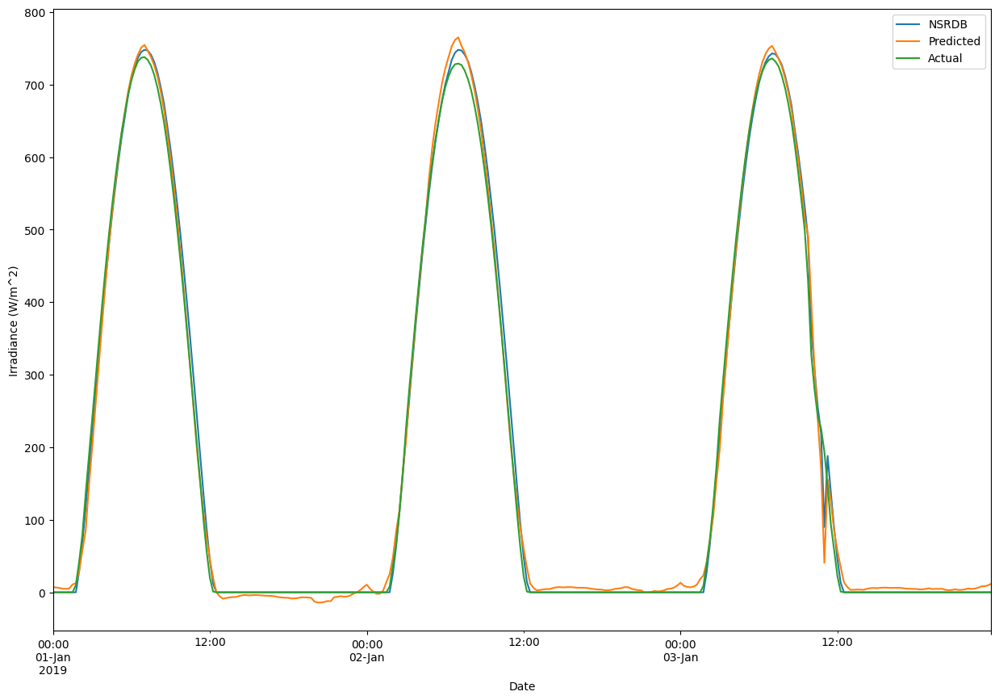

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_8 

In [ ]:
s3_8=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_8.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S3_8.h5')

1095/1095 [==============================] - 10s 9ms/step
r2_Score 0.9896999258173796
Root Mean Sqaured Error 28.817656
Mean Absolute Error 17.28157


Text(0, 0.5, 'Irradiance (W/m^2)')

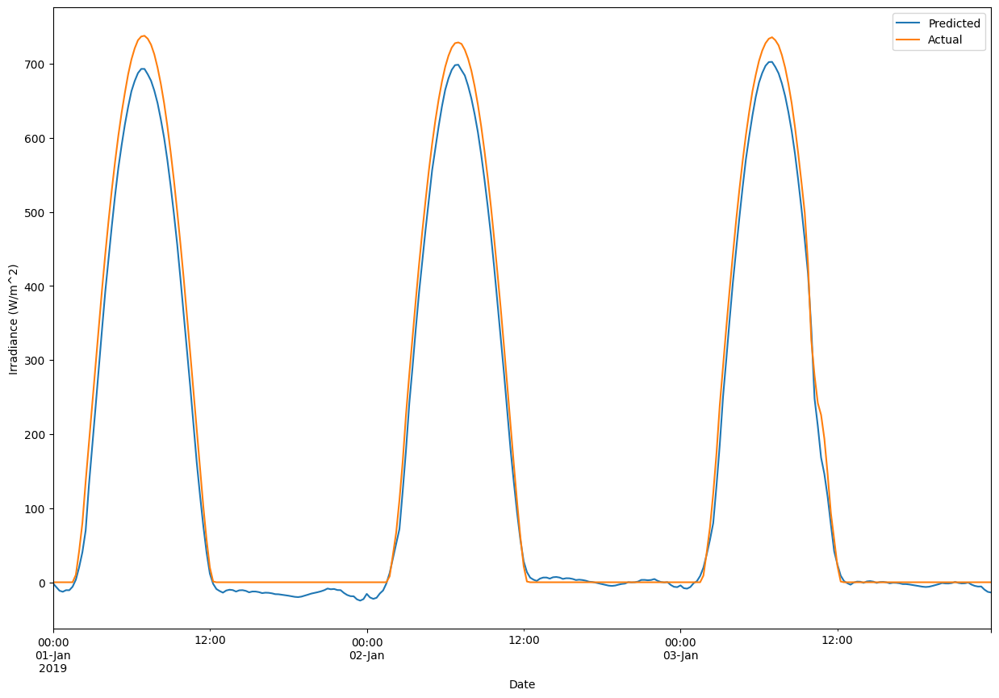

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s3_8.predict(man_val_x))
print("r2_Score",r2_score(s3_8.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

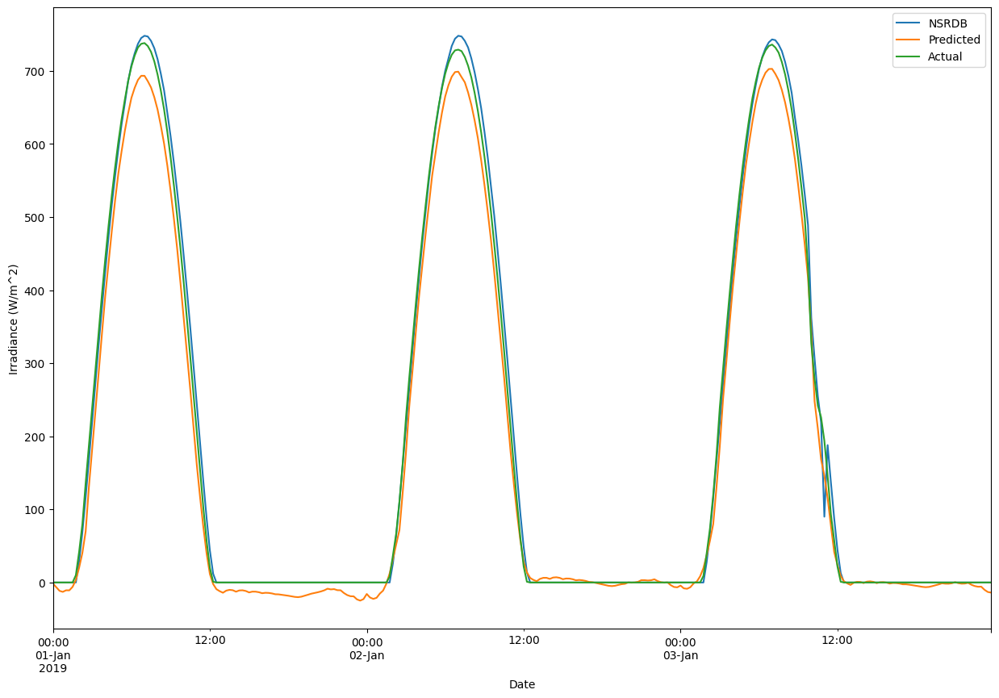

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.9906799470334156
Root Mean Sqaured Error 28.817653412042777
Mean Absolute Error 17.281572960495797


Text(0, 0.5, 'Irradiance (W/m^2)')

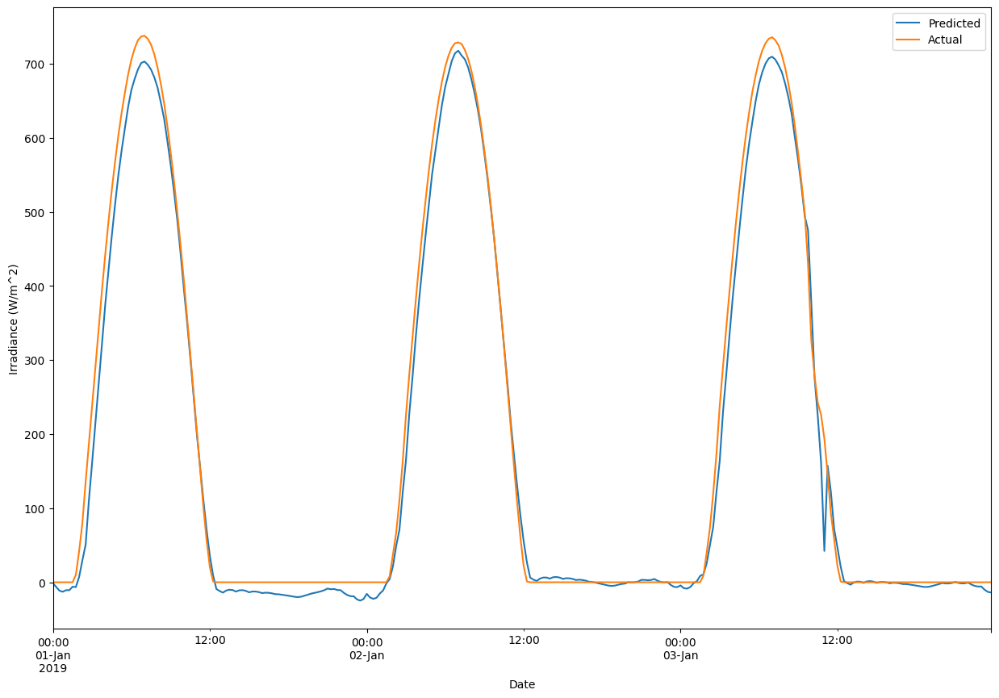

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

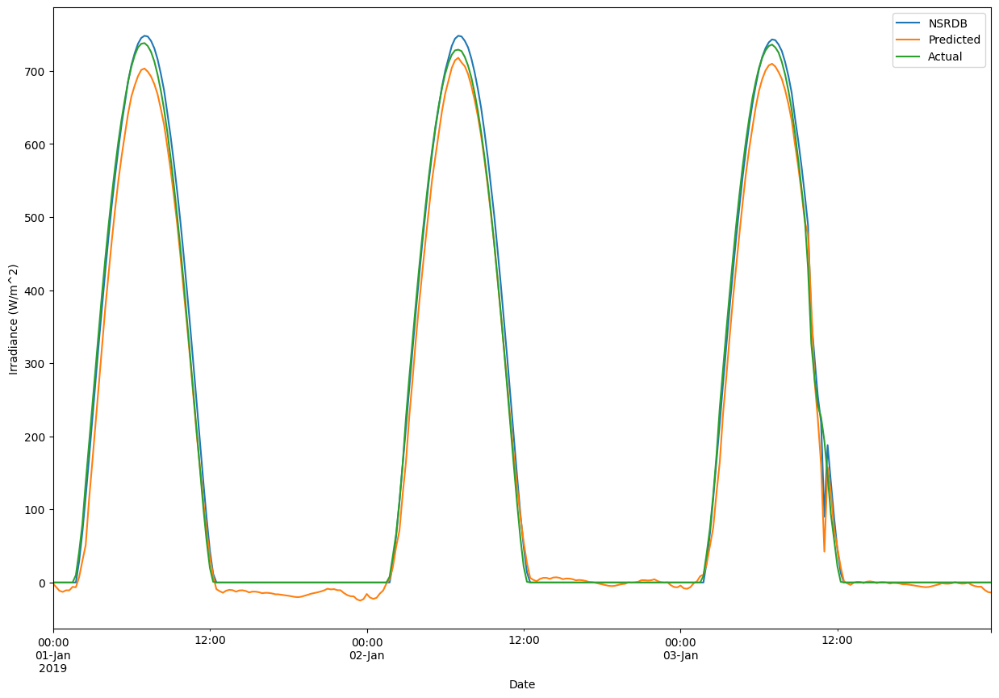

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

## S3_12

In [ ]:
s3_12=TransferLearningModel('/content/drive/MyDrive/Generalization_India_Models/Kaza Solar Plant/Best Model/Solar_Irradiance_Bi-LSTM_Base_Model_kaz.h5',[''],n_timesteps,n_features,n_outputs)
s3_12.load_trained_model('/content/drive/MyDrive/Generalization_India_Models/Mandsur Solar Farm/S3_12.h5')

1095/1095 [==============================] - 9s 8ms/step
r2_Score 0.9920915715424391
Root Mean Sqaured Error 25.773815
Mean Absolute Error 11.948494


Text(0, 0.5, 'Irradiance (W/m^2)')

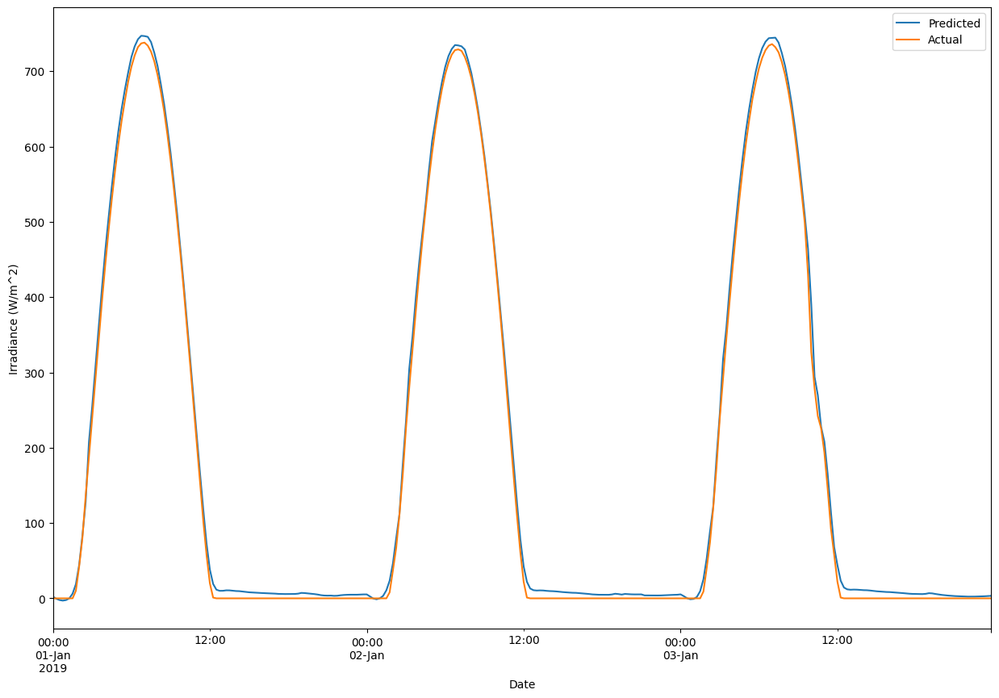

In [ ]:
df_date_man_val['Actual']=scaler_y.inverse_transform(man_val_y)
df_date_man_val['Predicted']=scaler_y.inverse_transform(s3_12.predict(man_val_x))
print("r2_Score",r2_score(s3_12.predict(man_val_x),man_val_y))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['Actual'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['Actual'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['NSRDB']=man_val_ns['GHI'].to_list()

Text(0, 0.5, 'Irradiance (W/m^2)')

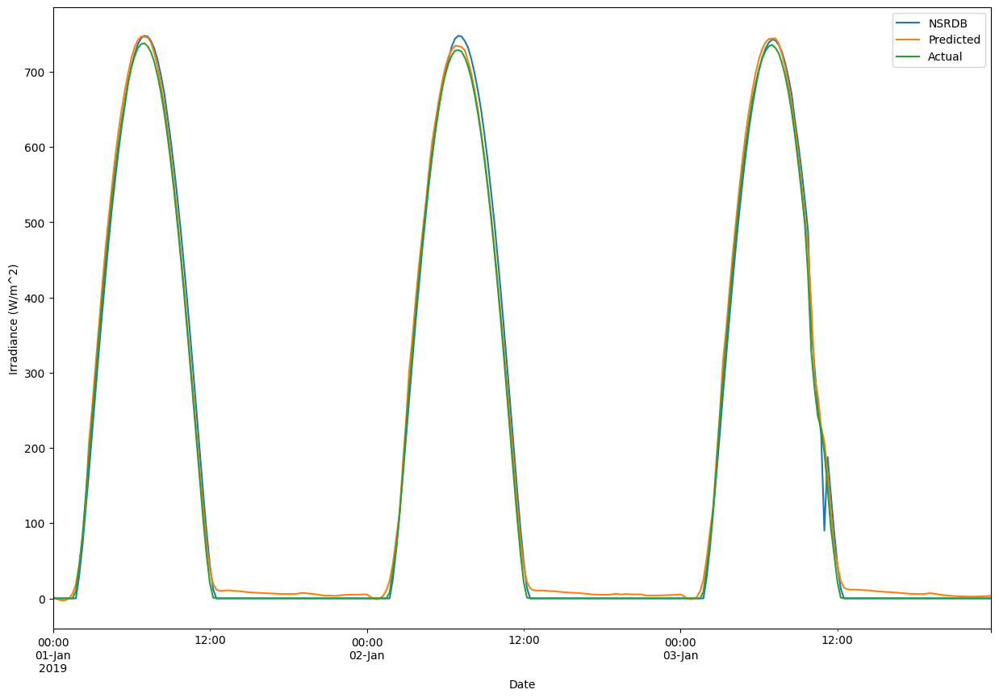

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

In [ ]:
df_date_man_val['Error']=df_date_man_val['Actual']-df_date_man_val['NSRDB']

In [ ]:
df_date_man_val['Predicted']=df_date_man_val['Predicted']- df_date_man_val['Error']

r2_Score 0.9925448120774203
Root Mean Sqaured Error 25.773815846291484
Mean Absolute Error 11.948493346220657


Text(0, 0.5, 'Irradiance (W/m^2)')

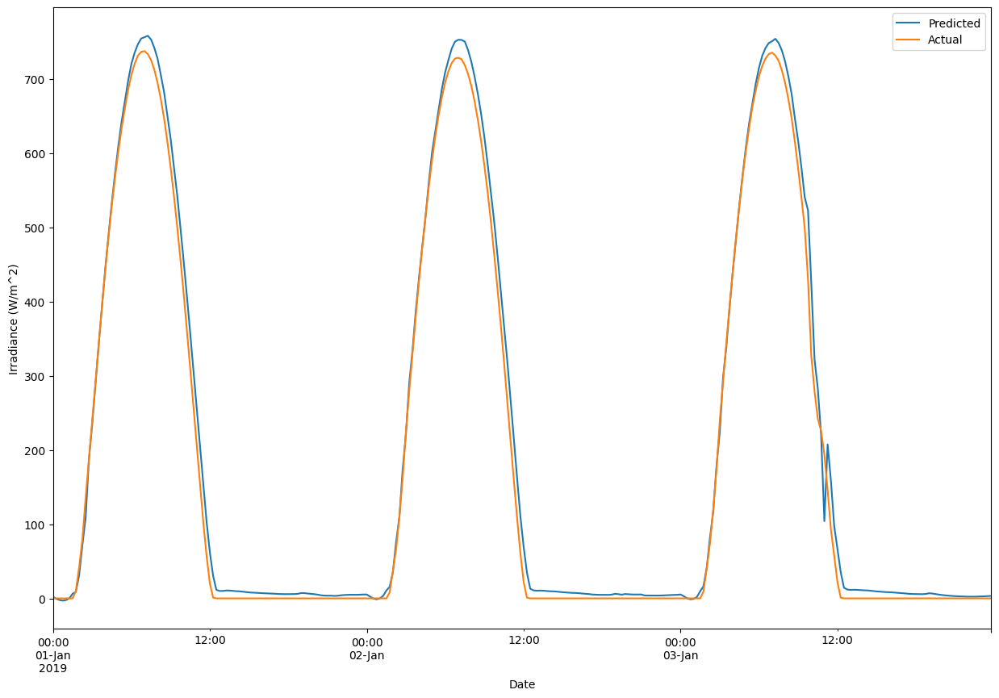

In [ ]:
print("r2_Score",r2_score(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
print("Root Mean Sqaured Error",np.sqrt(mean_squared_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted'])))

print("Mean Absolute Error",mean_absolute_error(df_date_man_val['NSRDB'],df_date_man_val['Predicted']))
df_date_man_val.set_index('Date')[['Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')

Text(0, 0.5, 'Irradiance (W/m^2)')

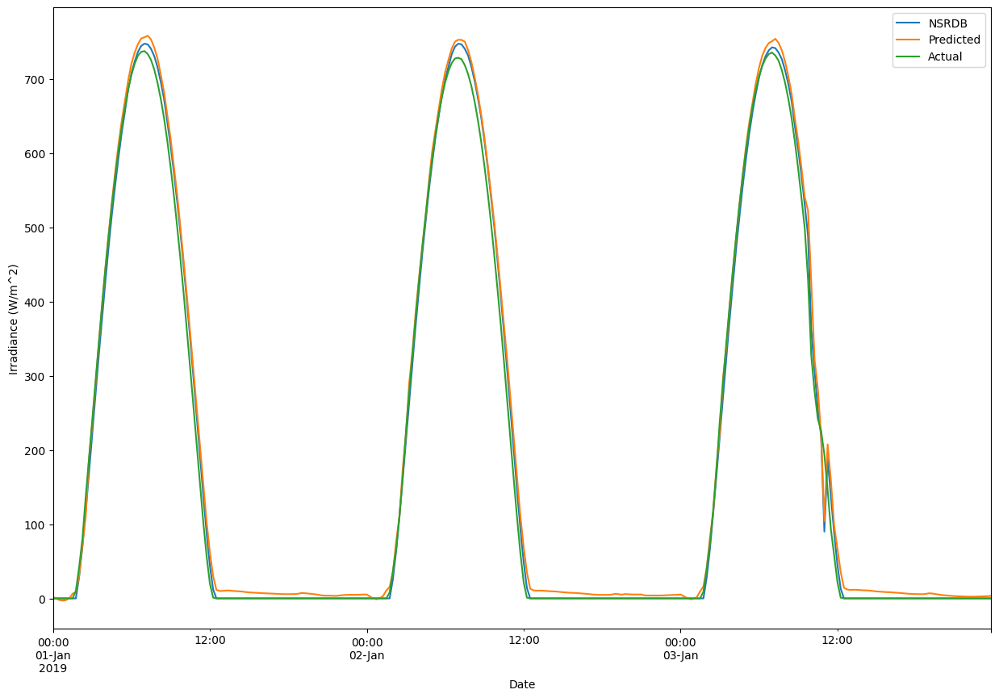

In [ ]:
df_date_man_val.set_index('Date')[['NSRDB','Predicted','Actual']].iloc[0:96*3].plot(figsize=(15,10))
plt.ylabel('Irradiance (W/m^2)')